# Problem definiton.

    The problem consists on disaggregating data from NUTS0 spatial resolution to a NUTS3 spatial resolution. It means disaggregating data from Cuntry level to District level. 

    The spatial resolution consists of the following dimensions:

    - The number of LAU spatial resolution units are:  95743
    - The number of NUTS3_gdf spatial resolution units are:  1170
    - The number of NUTS2_gdf spatial resolution units are:  240
    - The number of NUTS1_gdf spatial resolution units are:  92
    - The number of NUTS0_gdf spatial resolution units are:  27

The following datasets have been queried, processed and mapped to LAU level:

## 1) OSM data

    - (a) network:
      - (Bicycle, bus, railways, major roads and shipping length network).
      - The dataset consists in two columns (first one corresponds to the code_region id and the second one to the lenght value in meters of the specific neftwork for the region in question)
    - (b) stations
      - (fuel_stations, charging_stations, bicycle_stations, bus_stations, airport_stations, railway_station, train_station, subway_station, lightrail_station, shipping_station and helicopter_station). 
      - The dataset consists in two columns (first one corresponds to the code_region id and the second one to the number of physical stations for the region in question)

The following datasets have been queried, processed and mapped to NUTS3 level:

## 1) Synthetic European road freight transport flow data based on ETISplus

    This dataset describes estimated European truck traffic flows between 1,675 regions all over Europe and is based on the publicly available ETISplus project from 2010 (DOI: 10.13140/RG.2.2.16768.25605). The project collected Europe-wide freight volumes and calibrated the resulting origin-destination matrices with real world traffic flows. For the current dataset,  the truck results of the ETISplus project were updated using current Eurostat data (https://ec.europa.eu/eurostat/web/transport/data/database). Additionally, a forecast was added for 2030. Using Dijkstra's algorithm, the freight flows were finally transferred to the European highway network. Therefore, the dataset provides a synthetically generated truck traffic volume for each road section. 
    The dataset can be a basis for developing, planning and sizing future road infrastructure, such as charging infrastructure for electric trucks.

    The main dataset 01_Trucktrafficflow describes 1,514,573 directed transport flows in fifteen columns: 

    - (1) distance from origin region to the E-road network, 
    - (2) distance within the E-road network, 
    - (3) distance from the E-road network to the destination region, 
    - (4) total distance, 
    - (5) road freight flow in tons for 2010, 
    - (6) road freight flow in tons for 2019, 
    - (7) road freight flow in tons for 2030, 
    - (8) truck traffic flow in number of vehicles for 2010, 
    - (9) truck traffic flow in number of vehicles for 2019, 
    - (10) truck traffic flow in number of vehicles for 2030.

- Information

        - Data Source: 
        The European Transport policy Information System (ETISplus) (DOI: 10.13140/RG.2.2.16768.25605, data: https://ftp.demis.nl/outgoing/etisplus/datadeliverables ) serves as a basis for the described dataset. 
        In a first step, based on Eurostat data (https://ec.europa.eu/eurostat/web/transport/data/database), the national and international growth of freight transport volume was determined on a country-by-country basis between 2010 and 2019. 

        - Data Year:

            Subsequently, the country-specific growth rates were used to scale the ETISplus data from 2010 to 2019. Since projections for 2030 vary extremely, the same growth was assumed through 2030 as in previous years. 

            Afterwards, the freight volumes were then converted into vehicle trips using an average loading factor of 13.6 t and an empty trip share of 25%.

            The road network is also based on the ETISplus project. The original network was filtered for highways, four-lane roads and smaller roads, which are part of the European road network. To ensure that all E-roads are part of the dataset, a comparison with the current E-road network was done by hand and missing edges were manually added. The routes relevant for long-distance traffic, where public refueling or charging infrastructure will be increasingly needed in the future, are thus mapped.  


            Then, the vehicle trips were mapped to the road network. Using Dijkstra's algorithm implemented in the Python library NetworkX, shortest paths between die origin and destination regions were determined. Additionally, regional traffic was excluded, since the regional resolution is not high enough to represent them properly. The distance within the region, which cannot be estimated cleanly, would be higher than the distance in the defined road network. Therefore, routes where origin and destination are in the same region were excluded. In addition, routes that do not have a network node in the origin or destination region and are less than 50 km apart or are directly adjacency were deleted. 
            Finally, for each individual edge in the network, it was calculated how many trucks would use it. 

    - Institutions

        Fraunhofer-Institut fur System und Innovationsforschung

    - Categories

        Transport Infrastructure, Road Transportation, Infrastructure, Road Freight, Road Network

## 2) Vehicle Stock for Germany

    This dataset describes the number of motor vehicles and their trailers by municipality, 1 January 2023 (FZ 3) 
    Next update: expected May 2023Stock vehicle by municipality (FZ 3)
    Data Source: 
    - KBA 
    - https://www.kba.de/DE/Statistik/Fahrzeuge/Bestand/FahrzeugklassenAufbauarten/fahrzeugklassen_node.html;jsessionid=146BD1A6D96652037488B0F88BD8554F.live11313
    - https://www.kba.de/DE/Statistik/Produktkatalog/produkte/Fahrzeuge/fz3_b_uebersicht.html?nn=3514348

    The main dataset was structured as follows: 
    - (1) Motorcylces	
    - (2) Agricultural Tractors	
    - (3) Buses	
    - (4) Passenger Vehicles	
    - (5) Motor Vehicles Other	
    - (6) Motor Vehicles Total	
    - (7) Load Force Wagons	
    - (8) Trailers Other	
    - (9) Trailers Total

## Probelem definition and specifications

    All of them are stored as comma separated values with commas as column separators and dots as decimal separators.

    All the respective datasets were aggregated at each of the possible spatial resolutions in increasing order, for example, OSM data was aggregated stepwise from LAU to NUTS3, NUTS2, NUTS1 and up to NUTS0. 

    Traffic flow dataset, as the raw data was at the NUTS3 level, was added aggregated from NUTS3, NUTS2, NUTS1 and up to NUTS0.

    The problem definition consists of developing or exploring different machine learning algorithms that are capable of accurately and reliably predicting data from NUTS0 to NUTS3 level, then comparing the error with the originally target data at the NUTS3 level, evaluating the predictive capacity and generalization of each model.

    The problem could use all the folling features as NUTS3 input data:

        Transport related data:
            OSM Network data:    
                'bicycle_network_value',
                'bus_network_value', 
                'railways_network_value',
                'road_major_network_value', 
                'shipping_network_value',
                TOTAL: 5

            OSM stations data:
                'fuel_stations_value', 
                'charging_stations_value',
                'bicycle_stations_value', 
                'bus_stations_value',
                'airport_stations_value', 
                'railway_station_value',
                'train_station_value', 
                'subway_station_value',
                'lightrail_station_value', 
                'shipping_station_value',
                'helicopter_station_value',
                TOTAL: 11 

            Traffic flow data: 
                'Distance_from_origin_region_to_E_road',
                'Distance_within_E_road', 
                'Distance_from_E_road_to_destination_region',
                'Total_distance', 
                'Traffic_flow_trucks_2010',
                'Traffic_flow_trucks_2019', 
                'Traffic_flow_trucks_2030',
                'Traffic_flow_tons_2010', 
                'Traffic_flow_tons_2019',
                'Traffic_flow_tons_2030',
                TOTAL: 10

            Germany vehicle Stock data:
                'Motorcylces', 
                'Agricultural Tractors',
                'Buses', 
                'Passenger Vehicles', 
                ' Motor Vehicles Other',
                ' Motor Vehicles Total', 
                'Load Force Wagons', 
                ' Trailers Other',
                'Trailers Total',
                TOTAL: 9

            Poland transport data:
                'number of busses_PL_value',
                'number of lorries_PL_value',
                'number of mopeds_PL_value', 
                'number of motorcycles_PL_value',
                'number of passenger cars_PL_value',
                'number of residential buildings_PL_value',
                'number of road tractors_PL_value',
                TOTAL: 7 

        Economic Metric data: 
            'employment in nace sector G-I_value', 
            'gross domestic product_value',
            'gross value added in nace sector G-I_value', 
            'gross value added_value',                           
            'number of large businesses_value', 
            'number of small businesses_value',
            'relative gross value added in nace sector G-I_value',
            'relative gross value added_value',
            'total employment_value', 
            'total number of businesses_value'
            TOTAL: 10

        Socio metrics:
            'deaths_value',
            'live births_value',
            'quality of life index_value',
            TOTAL: 3

        Demographic data: 
            'population_value',
            'total area_value',
            TOTAL: 2 

        The total number of features for all EU27 are: 41
        The total number of features for the DE are: 50
        The total number of features for PL are: 48

    A sensitivity analysis will be done to determine the best linear correlation of the input variables with the target variable.
    The sensitivity analysis helps to select the best features for getting the best model performance.

    The target variable to be disaggregated and to analyze the model performance will be:

        - Fuel Stations   

    Once the model disaggregates the data with a high grade of accuracy, a validation of the spatial disaggregagtion model using other metric will be done. For doing so the problem should be transformed from an unsupervised learning to a supervised learning algorithm. 

    The possible ways for dointg so are:

        * Mass-Preserving Area Weighting:

        Mass-preserving area weighting is a simple spatial disaggregation method that divides the known counts associated with administrative regions evenly throughout their area. This method is based on the assumption that the phenomenon of interest is uniformly distributed throughout the territory, making it inherently conserving of total count values within each region of origin. However, this method often produces poor estimates when compared to other alternative approaches, due to the fact that most geospatial data is rarely uniform.

        * Pycnophylactic Interpolation:

        Pycnophylactic interpolation is a refinement of mass-preserving area weighting that begins by applying the mass conservation area weighting procedure, and then smoothing the values of the resulting grid cells by replacing them with the average of its neighbors. This process continues until there are no changes from the previous iteration. Pycnophylactic interpolation maintains the property of conservation of mass by keeping the sum of all values within each region of origin constant. This method takes into account the spatial property of autocorrelation, stating that regions close to each other tend to have similar values. However, it does not impose any other properties about the distribution of the target variable, often leading to too smooth results.

        * Additional Information:

        Additional information about the distribution of the source data can also be used in spatial disaggregation methods. For example, external variables that are expected to be correlated with the target counts can be utilized to improve the accuracy of the estimates. This information can be especially useful in cases where the source data is not uniformly distributed or when more refined results are desired.

    The data that will be used for validation are:
        
        - Charhing stations
        - Bus stations

# Prepearing the environment

Import the Python libraries that we will need to (i) load the data, (ii) analyze it, (iii) create model, (iv) process the results.

In [104]:
#Importing the necessary libraries
import math
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
import matplotlib as mpl
from zoomin.data.constants import countries_dict, open_stack_list, data_columns, \
    osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col, transport_PL_col, \
        economic_metric_col, socio_metric_col, demo_metric_col 
from zoomin.data.osmtags import networks_tags_dict, stations_tags_dict, name_tags_dict

In [105]:
# Data Preparation and Scoring
from sklearn import preprocessing as pp
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from matplotlib.colors import LogNorm

In [106]:
# ML Algorithms to be used
from sklearn.linear_model import Lasso
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.svm import SVR
from sklearn.linear_model import BayesianRidge

# Pre-Processing
## Loading the data

In [107]:
# Loading the data
cwd = os.getcwd()
DATA_PATH = os.path.join(cwd, '..', '..', '..', 'data', 'input')
RAW_DATA_PATH = os.path.join(DATA_PATH, 'raw')
PROCESSED_DATA_PATH = os.path.join(DATA_PATH, 'processed')

In [108]:
def read_Data():
        data_path = os.path.join(
        PROCESSED_DATA_PATH, 
        'ancilliary_data', 
        "data.csv")
        data = pd.read_csv(data_path)
        return data

In [109]:
data = read_Data()

In [110]:
data.head()

,EU_region_code,NUTS0_region_code,NUTS1_region_code,NUTS2_region_code,NUTS3_region_code,deaths_value,employment in nace sector G-I_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030,gross domestic product_value,gross value added in nace sector G-I_value,gross value added_value,live births_value,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,number of busses_PL_value,number of large businesses_value,...,number of small businesses_value,population_value,quality of life index_value,relative gross value added in nace sector G-I_value,relative gross value added_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value,total area_value,total employment_value,total number of businesses_value,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total
0,EU,AT,AT1,AT11,AT111,495.00,0.00,30.00,825.73,11.30,867.04,36.41,38.16,40.68,495.11,518.99,553.20,"1,018.00",0.00,910.00,231.00,0.00,0.00,"17,650.22","381,288.55",0.00,NaN,175.00,...,751.00,"37,384.00",0.00,0.00,89.00,23.00,8.00,0.00,327.00,1.00,14.00,3.00,0.00,0.00,0.00,2.00,701.00,"14,000.00","2,179.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,EU,AT,AT1,AT11,AT112,"1,716.00",0.00,18.00,"1,202.16",130.20,"1,350.36",230.20,247.37,273.23,"3,130.73","3,364.22","3,715.89","5,456.00",0.00,"4,877.00","1,305.00",0.00,0.00,"260,878.91","842,626.32","49,237.04",NaN,778.00,...,"3,366.00","160,064.00",0.00,0.00,89.00,77.00,62.00,19.00,891.00,1.00,124.00,24.00,0.00,0.00,9.00,4.00,"1,792.00","70,100.00","10,491.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,EU,AT,AT1,AT11,AT113,"1,182.00",0.00,16.00,"1,179.28",145.63,"1,340.91",166.52,174.93,186.72,"2,264.66","2,379.11","2,539.34","2,769.00",0.00,"2,475.00",696.00,0.00,0.00,"68,662.62","976,564.56",0.00,NaN,402.00,...,"1,903.00","96,988.00",0.00,0.00,89.00,56.00,19.00,4.00,649.00,3.00,29.00,6.00,0.00,0.00,0.00,6.00,"1,471.00","39,300.00","5,869.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,EU,AT,AT1,AT12,AT121,"2,425.00",0.00,9.00,"1,157.76",127.13,"1,293.89",476.27,511.38,564.21,"6,477.30","6,954.83","7,673.27","8,810.00",0.00,"7,875.00","2,446.00","5,266.32",18.73,"571,758.61","2,771,270.54","10,778.60",NaN,"1,104.00",...,"4,059.00","247,347.00",0.00,0.00,89.00,168.00,151.00,16.00,"3,058.00",9.00,134.00,46.00,0.00,0.00,6.00,12.00,"3,356.00","108,000.00","13,175.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,EU,AT,AT1,AT12,AT122,"2,791.00",0.00,40.00,"1,230.41",126.41,"1,396.82",523.76,562.41,620.52,"7,123.10","7,648.84","8,439.12","8,620.00",0.00,"7,705.00","2,302.00",0.00,0.00,"345,064.47","1,446,640.77",0.00,NaN,"1,051.00",...,"4,947.00","261,156.00",0.00,0.00,89.00,100.00,61.00,23.00,"2,015.00",4.00,234.00,47.00,0.00,0.00,1.00,16.00,"3,368.00","109,100.00","15,323.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Filter Data for DE

In [111]:
data_DE_raw = data[data["NUTS0_region_code"] == "DE"]

In [112]:
data_DE_raw.shape

(401, 62)

## Data Exploration
Here look into the statistics of the data, identify any missing values or categorical features that is needed to be further process.

#### Describe

In [113]:
pd.options.display.max_columns = 57
pd.options.display.float_format = '{:,.2f}'.format
data_DE_raw.describe()

,deaths_value,employment in nace sector G-I_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030,gross domestic product_value,gross value added in nace sector G-I_value,gross value added_value,live births_value,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,number of busses_PL_value,number of large businesses_value,number of lorries_PL_value,number of mopeds_PL_value,number of motorcycles_PL_value,number of passenger cars_PL_value,number of residential buildings_PL_value,number of road tractors_PL_value,number of small businesses_value,population_value,quality of life index_value,relative gross value added in nace sector G-I_value,relative gross value added_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value,total area_value,total employment_value,total number of businesses_value,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total
count,401.00,401.00,399.00,399.00,399.00,399.00,399.00,399.00,399.00,399.00,399.00,399.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,0.00,401.00,0.00,0.00,0.00,0.00,0.00,0.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,401.00,394.00,394.00,394.00,394.00,394.00,394.00,394.00,394.00,394.00
mean,"2,342.94",0.00,10.50,"1,148.35",113.55,"1,272.40",292.30,355.00,450.88,"3,975.29","4,828.05","6,131.99","8,661.23",0.00,"7,806.62","1,940.37","1,360.13",3.31,"61,779.20","174,861.49",7.84,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"207,398.28",0.00,0.00,90.00,46.54,50.68,11.50,940.12,2.31,107.74,9.08,1.76,15.17,2.84,5.59,891.69,"112,888.57",0.00,"11,955.43","4,192.45",969.58,"121,933.50","27,911.44","149,844.94","8,550.86","12,176.99","20,727.85"
std,"2,368.10",0.00,10.34,206.51,49.08,247.70,234.56,286.10,365.57,"3,190.08","3,891.03","4,971.72","13,775.44",0.00,"12,416.32","2,652.87","7,529.94",31.97,"145,184.78","420,192.75",55.52,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"245,162.41",0.00,0.00,0.00,30.86,69.09,37.09,669.10,2.04,178.63,13.60,12.49,70.95,5.54,5.15,724.26,"155,565.61",0.00,"9,888.67","3,222.15",986.96,"111,971.95","21,175.80","132,107.81","9,599.19","8,075.73","13,487.81"
min,436.00,0.00,0.00,539.16,10.81,552.78,36.70,44.28,55.79,499.11,602.22,758.78,"1,221.00",0.00,"1,100.00",215.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"34,193.00",0.00,0.00,90.00,6.00,1.00,0.00,114.00,0.00,5.00,0.00,0.00,0.00,0.00,0.00,36.00,"19,970.00",0.00,563.00,108.00,77.00,"7,066.00","1,933.00","8,999.00",871.00,0.00,"2,235.00"
25%,"1,262.00",0.00,3.75,"1,081.47",119.18,"1,237.03",153.67,185.78,234.94,"2,089.97","2,526.67","3,195.19","3,392.00",0.00,"3,057.00",909.00,0.00,0.00,0.00,0.00,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"103,243.00",0.00,0.00,90.00,26.00,20.00,0.00,489.00,1.00,36.00,3.00,0.00,0.00,0.00,2.00,281.00,"49,620.00",0.00,"6,786.25","1,540.50",523.00,"65,541.00","16,149.75","82,446.75","4,094.25","6,111.50","12,194.50"
50%,"1,752.00",0.00,7.00,"1,202.32",129.06,"1,347.46",236.10,286.15,361.03,"3,210.97","3,891.69","4,909.99","5,382.00",0.00,"4,851.00","1,379.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,NaN,NaN,NaN,NaN,NaN,NaN,0.00,"154,899.00",0.00,0.00,90.00,40.00,34.00,2.00,754.00,2.00,61.00,6.00,0.00,0.00,0.00,4.00,798.00,"74,570.00",0.00,"9,845.00","3,632.50",760.00,"94,210.00","24,720.50","117,096.50","6,243.50","11,917.00","18,350.00"
75%,"2,800.00",0.00,13.00,"1,285.27",141.46,"1,426.33",340.65,413.92,519.77,"4,632.85","5,62

#### Information

In [114]:
data_DE_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401 entries, 122 to 522
Data columns (total 62 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   EU_region_code                                       401 non-null    object 
 1   NUTS0_region_code                                    401 non-null    object 
 2   NUTS1_region_code                                    401 non-null    object 
 3   NUTS2_region_code                                    401 non-null    object 
 4   NUTS3_region_code                                    401 non-null    object 
 5   deaths_value                                         401 non-null    float64
 6   employment in nace sector G-I_value                  401 non-null    float64
 7   Distance_from_origin_region_to_E_road                399 non-null    float64
 8   Distance_within_E_road                               399 non-null   

##### Columns

In [115]:
data_DE_raw.columns

Index(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'deaths_value',
       'employment in nace sector G-I_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030',
       'gross domestic product_value',
       'gross value added in nace sector G-I_value', 'gross value added_value',
       'live births_value', 'bicycle_network_value', 'bus_network_value',
       'railways_network_value', 'road_major_network_value',
       'shipping_network_value', 'number of busses_PL_value',
       'number of large businesses_value', 'number of lorries_PL_value',
       'number of mopeds_PL_value', 'number of motorcycles_PL_value',
       'number of passenger cars_PL

## Data Visualization

In [116]:
data_DE_raw

,EU_region_code,NUTS0_region_code,NUTS1_region_code,NUTS2_region_code,NUTS3_region_code,deaths_value,employment in nace sector G-I_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030,gross domestic product_value,gross value added in nace sector G-I_value,gross value added_value,live births_value,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,number of busses_PL_value,number of large businesses_value,...,number of small businesses_value,population_value,quality of life index_value,relative gross value added in nace sector G-I_value,relative gross value added_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value,total area_value,total employment_value,total number of businesses_value,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total
122,EU,DE,DE1,DE11,DE111,"5,249.00",0.00,8.00,"1,247.06",121.76,"1,376.81",583.64,708.02,897.65,"7,937.49","9,629.08","12,207.99","58,352.00",0.00,"52,595.00","6,733.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,...,0.00,"635,911.00",0.00,0.00,90.00,81.00,327.00,126.00,"1,038.00",1.00,740.00,13.00,0.00,263.00,6.00,10.00,207.00,"549,910.00",0.00,"27,873.00","1,890.00","2,419.00","314,151.00","51,793.00","365,944.00","18,334.00","2,132.00","20,466.00"
123,EU,DE,DE1,DE11,DE112,"3,606.00",0.00,1.00,"1,237.75",126.03,"1,364.78",298.06,361.79,459.27,"4,053.67","4,920.37","6,246.14","26,469.00",0.00,"23,858.00","4,203.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,...,0.00,"392,807.00",0.00,0.00,90.00,74.00,164.00,27.00,"1,403.00",2.00,128.00,11.00,0.00,0.00,0.00,7.00,618.00,"233,740.00",0.00,"25,490.00","5,043.00","1,194.00","257,554.00","46,500.00","304,054.00","11,885.00","18,300.00","30,185.00"
124,EU,DE,DE1,DE11,DE113,"5,195.00",0.00,3.00,"1,262.01",123.69,"1,388.70",452.71,550.45,700.24,"6,156.86","7,486.18","9,523.22","23,203.00",0.00,"20,914.00","5,209.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,...,0.00,"535,024.00",0.00,0.00,90.00,86.00,208.00,19.00,"1,640.00",5.00,157.00,19.00,0.00,17.00,0.00,6.00,641.00,"291,590.00",0.00,"37,895.00","6,334.00","1,720.00","337,566.00","70,397.00","407,963.00","18,558.00","26,104.00","44,662.00"
125,EU,DE,DE1,DE11,DE114,"2,845.00",0.00,11.00,"1,137.66",141.89,"1,290.56",260.07,313.08,393.03,"3,536.91","4,257.95","5,345.27","8,590.00",0.00,"7,742.00","2,461.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,...,0.00,"258,145.00",0.00,0.00,90.00,50.00,39.00,3.00,584.00,6.00,55.00,9.00,0.00,0.00,0.00,4.00,642.00,"122,470.00",0.00,"18,498.00","5,353.00",777.00,"168,923.00","38,355.00","207,278.00","9,221.00","16,714.00","25,935.00"
126,EU,DE,DE1,DE11,DE115,"5,000.00",0.00,2.00,"1,255.35",119.54,"1,376.89",538.32,651.79,824.47,"7,321.09","8,864.36","11,212.84","25,020.00",0.00,"22,551.00","5,581.00",0.00,0.00,0.00,0.00,0.00,NaN,0.00,...,0.00,"545,423.00",0.00,0.00,90.00,87.00,104.00,29.00,"1,581.00",4.00,130.00,14.00,0.00,16.00,12.00,7.00,687.00,"271,130.00",0.00,"34,248.00","6,934.00","1,426.00","320,908.00","65,754.00","386,662.00","18,364.00","21,453.00","39,817.00"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
518,EU,DE,DEG,DEG0,DEG0K,"1,188.00",0.00,10.00,"1,069.86",133.09,"1,212.95",266.55,321.27,403.89,"3,625.07","4,369.21","5,492.87","2,468.00",0.00,"2,224.00",548.00,0.00,0.00,"115,852.65","862,485.64",0.00,NaN,0.00,...,0.00,"80,312.00",0.00,0.00,90

### Histogram

        This function takes a DataFrame df, a list of lists of column names column_lists, a number of bins for the histogram bins, and a size for the figure figsize as inputs. It then creates a figure with one subplot for each list of column names in column_lists, uses the hist() function from pandas to plot a histogram of the columns in each list, and sets the xlabel and ylabel for each subplot. 

In [117]:
column_lists = [osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col, transport_PL_col, \
        economic_metric_col, socio_metric_col, demo_metric_col]

In [118]:
def plot_histogram(df, column_lists, bins=15, figsize=(8,8), xlabel='', ylabel='Frequency', title=''):
    num_subplots = len(column_lists)
    fig, axs = plt.subplots(num_subplots, 1, figsize=figsize)
    fig.suptitle(title, fontsize=14)
    fig.tight_layout(pad=3.0)
    
    # Generate a list of colors, one for each set of columns
    colors = plt.cm.get_cmap('Set2', len(column_lists))
    
    for i, cols in enumerate(column_lists):
        data = df[cols].dropna()
        axs[i].hist(data, bins=bins, alpha=0.5, color=colors(i))
        axs[i].set_xlabel(xlabel)
        axs[i].set_ylabel(ylabel)
        axs[i].set_title(''.join(f"{cols} Histogram"))
    
    plt.show()


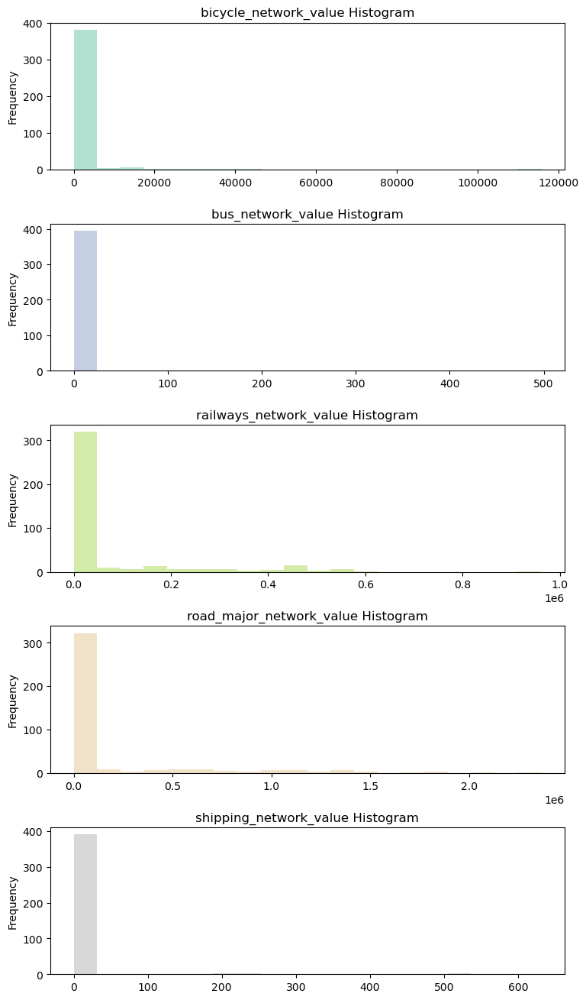

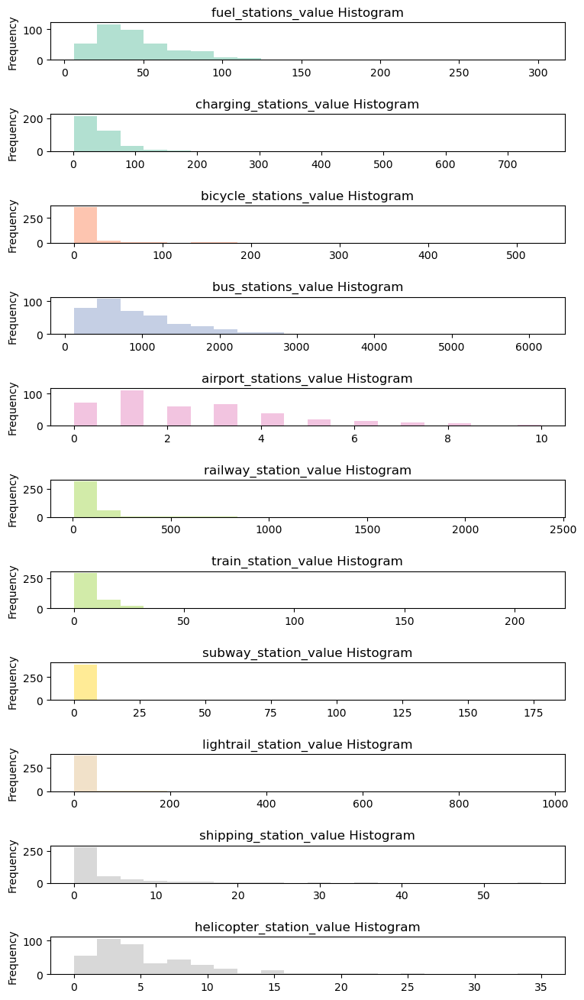

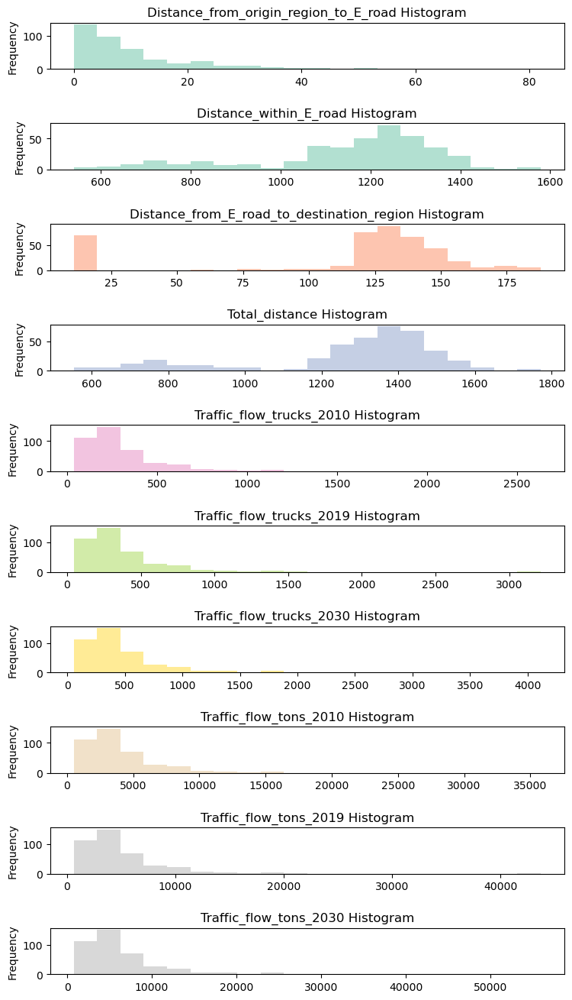

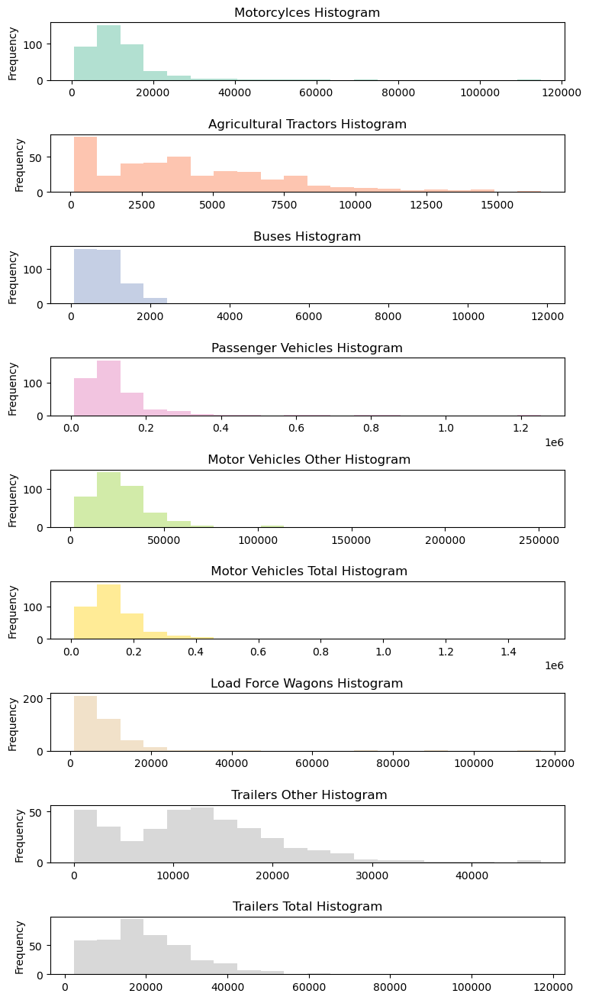

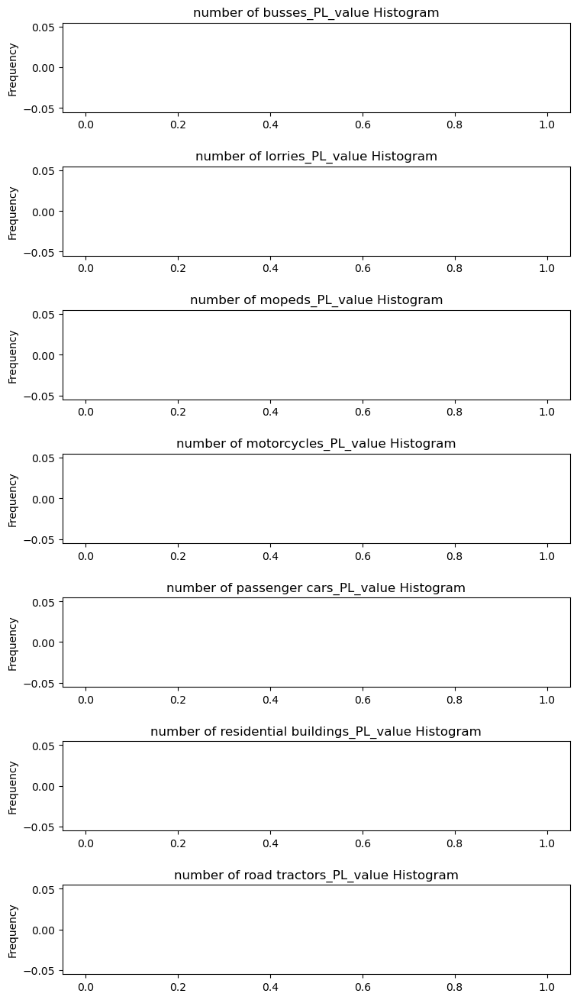

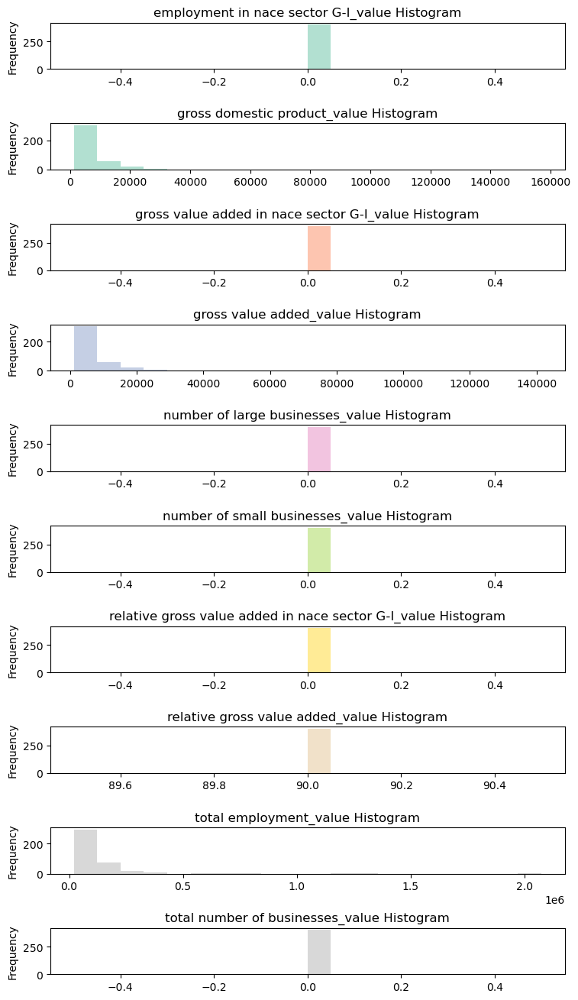

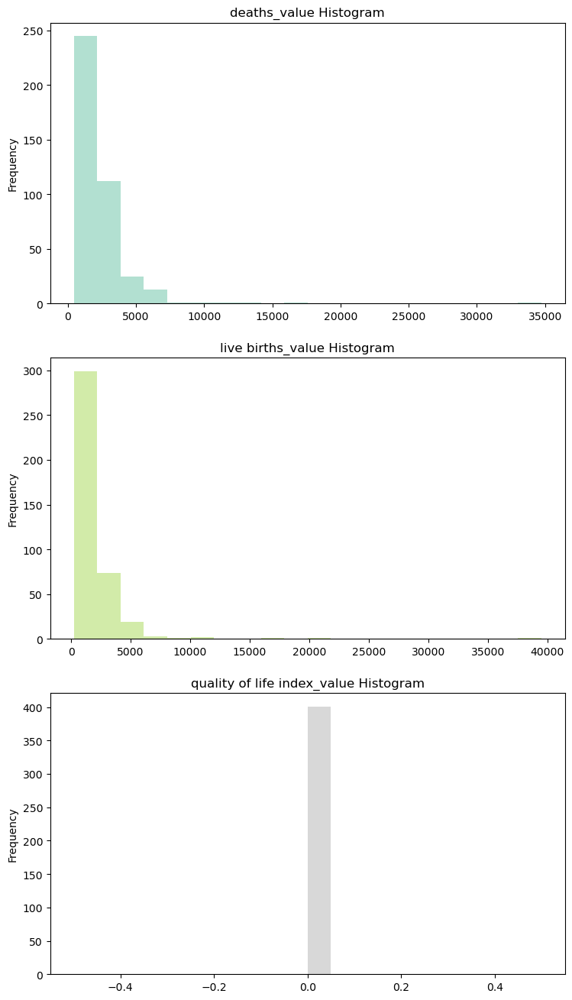

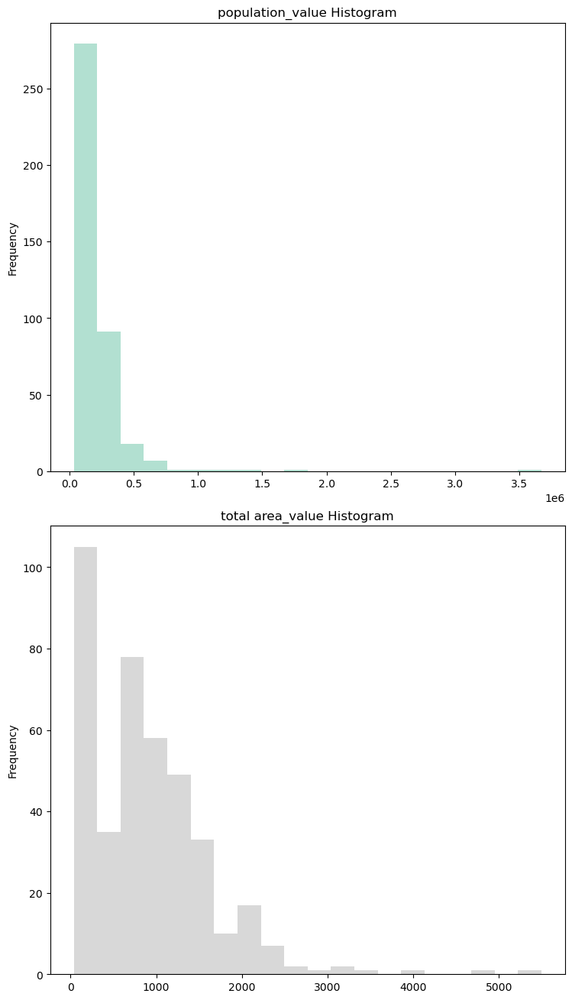

In [119]:
for column in column_lists:
    plot_histogram(data_DE_raw, column, bins=20, figsize=(8,14))

### CHeck Nan - Uniqueness - Distributions
        It is always a good exercise to look into the data visually and try to see the

        1) Features with NaN values
        2) Uniqueness of the dataset
        3) Distributions of the features

        NonNumerical values Identification:
        
        - Some ML algorithms can not handle non-numerical values (NaN: not a number) so it may be needed to identify the data type for each feature and modify it if necessary. It is also quite common that different feature values are missing for different instances / examples it may be needed to decide what to do: (i) omit the instance; (ii) replace them with the mean / median / mode of the feature; (iv) substitute them with a value of specific choice.

        The following line counts the NaNs for each feature for us:





In [120]:
data_DE_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401 entries, 122 to 522
Data columns (total 62 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   EU_region_code                                       401 non-null    object 
 1   NUTS0_region_code                                    401 non-null    object 
 2   NUTS1_region_code                                    401 non-null    object 
 3   NUTS2_region_code                                    401 non-null    object 
 4   NUTS3_region_code                                    401 non-null    object 
 5   deaths_value                                         401 non-null    float64
 6   employment in nace sector G-I_value                  401 non-null    float64
 7   Distance_from_origin_region_to_E_road                399 non-null    float64
 8   Distance_within_E_road                               399 non-null   

#### Nan and fill

In [121]:
def replace_nan_with_mean(df):
    for col in df.columns:
        num_nans = df[col].isnull().sum()
        if num_nans > 0:
            print("The number of rows with NaN values in column", col, "is", num_nans)
            mean_val = df[col].mean()
            df[col] = df[col].fillna(mean_val)
            if num_nans > 100:
                df.drop(col, axis=1, inplace=True)
                print(f"Dropped column '{col}' due to more than 100 missing values.")
        else:
            print('The number of rows with NaN values in column', col, 'is', 0)
    return df

In [122]:
data_DE_raw.shape

(401, 62)

In [123]:
data_DE = replace_nan_with_mean(data_DE_raw)

The number of rows with NaN values in column EU_region_code is 0
The number of rows with NaN values in column NUTS0_region_code is 0
The number of rows with NaN values in column NUTS1_region_code is 0
The number of rows with NaN values in column NUTS2_region_code is 0
The number of rows with NaN values in column NUTS3_region_code is 0
The number of rows with NaN values in column deaths_value is 0
The number of rows with NaN values in column employment in nace sector G-I_value is 0
The number of rows with NaN values in column Distance_from_origin_region_to_E_road is 2
The number of rows with NaN values in column Distance_within_E_road is 2
The number of rows with NaN values in column Distance_from_E_road_to_destination_region is 2
The number of rows with NaN values in column Total_distance is 2
The number of rows with NaN values in column Traffic_flow_trucks_2010 is 2
The number of rows with NaN values in column Traffic_flow_trucks_2019 is 2
The number of rows with NaN values in column 

C:\Users\rofer\AppData\Local\Temp\ipykernel_26840\2175200320.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].fillna(mean_val)
C:\Users\rofer\AppData\Local\Temp\ipykernel_26840\2175200320.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(col, axis=1, inplace=True)
C:\Users\rofer\AppData\Local\Temp\ipykernel_26840\2175200320.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyda

In [124]:
data_DE.shape

(401, 55)

In [127]:
for col in data_DE.columns:
        num_nans = data_DE[col].isnull().sum()
        if num_nans > 0:
            print("The number of rows with NaN values in column", col, "is", num_nans)

In [130]:
def convert_float_to_int(df):
    for column in df.columns:
        if df[column].dtype == 'float64':
            df[column] = df[column].astype(int)
    return df

In [131]:
data_DE = convert_float_to_int(data_DE)

In [133]:
data_DE.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401 entries, 122 to 522
Data columns (total 55 columns):
 #   Column                                               Non-Null Count  Dtype 
---  ------                                               --------------  ----- 
 0   EU_region_code                                       401 non-null    object
 1   NUTS0_region_code                                    401 non-null    object
 2   NUTS1_region_code                                    401 non-null    object
 3   NUTS2_region_code                                    401 non-null    object
 4   NUTS3_region_code                                    401 non-null    object
 5   deaths_value                                         401 non-null    int32 
 6   employment in nace sector G-I_value                  401 non-null    int32 
 7   Distance_from_origin_region_to_E_road                401 non-null    int32 
 8   Distance_within_E_road                               401 non-null    int32 
 9

It is also a good exercise to check the uniqueness of the dataset, that is, whether there exists values repeating at different instances:

In [135]:
distinctCounter_1 = data_DE.apply(lambda x: len(x.unique()))
print('The number of unique not repeated values at different instances for "data_DE" are: ')
print(distinctCounter_1)

The number of unique not repeated values at different instances for "data_DE" are: 
EU_region_code                                           1
NUTS0_region_code                                        1
NUTS1_region_code                                       16
NUTS2_region_code                                       38
NUTS3_region_code                                      401
deaths_value                                           377
employment in nace sector G-I_value                      1
Distance_from_origin_region_to_E_road                   45
Distance_within_E_road                                 284
Distance_from_E_road_to_destination_region              74
Total_distance                                         290
Traffic_flow_trucks_2010                               273
Traffic_flow_trucks_2019                               296
Traffic_flow_trucks_2030                               324
Traffic_flow_tons_2010                                 390
Traffic_flow_tons_2019         

For more pre-processing options; you may check:

https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing

### Data to be predicted

In [141]:
data_DE_osm_fs = data_DE[['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'fuel_stations_value']]

In [145]:
data_DE_osm_fs.head()

,EU_region_code,NUTS0_region_code,NUTS1_region_code,NUTS2_region_code,NUTS3_region_code,fuel_stations_value
122,EU,DE,DE1,DE11,DE111,81
123,EU,DE,DE1,DE11,DE112,74
124,EU,DE,DE1,DE11,DE113,86
125,EU,DE,DE1,DE11,DE114,50
126,EU,DE,DE1,DE11,DE115,87


### Correlation matrix
Now let's try to visualize how correlated the data is by creating a correlation matrix.

In [188]:
column_lists = [osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col, economic_metric_col, socio_metric_col, demo_metric_col]
indep_col = data_DE_osm_fs[['fuel_stations_value']].squeeze()

In [224]:
# def plot_correlation_matrix(df, col_list, indep_col, figsize=(4,4)):
#     size = (4.5*len(col_list), 4.5*len(col_list))
#     fig, axs = plt.subplots(1, len(col_list), figsize=size)
#     fig.tight_layout(pad=3.0)
    
#     for i, col in enumerate(col_list):
#         cols_all = [col] + [indep_col.columns[0]]
#         data = df[cols_all]
#         corr = data.corr()
#         sns.heatmap(corr, cmap='coolwarm', center=0, square=True, annot=True, ax=axs[i])
#         axs[i].set_title(f"Correlation Matrix for {col} and {indep_col.columns[0]}")
    
#     plt.show()


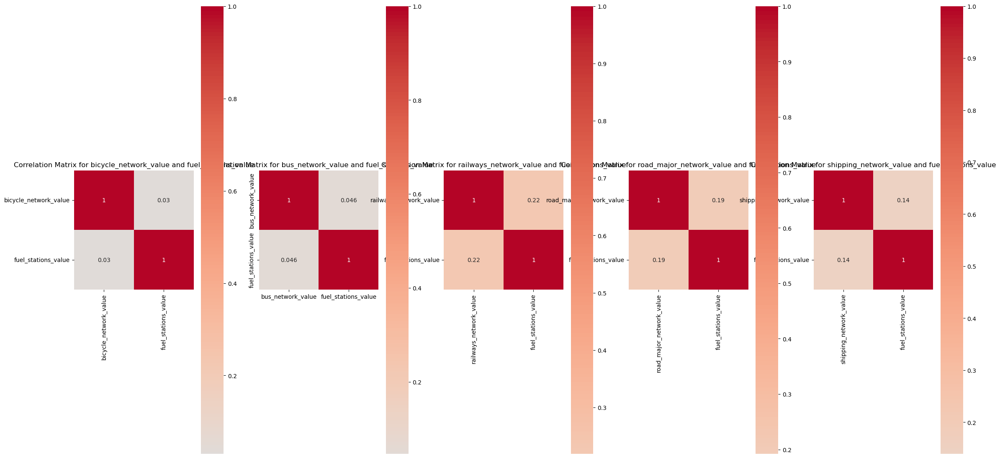

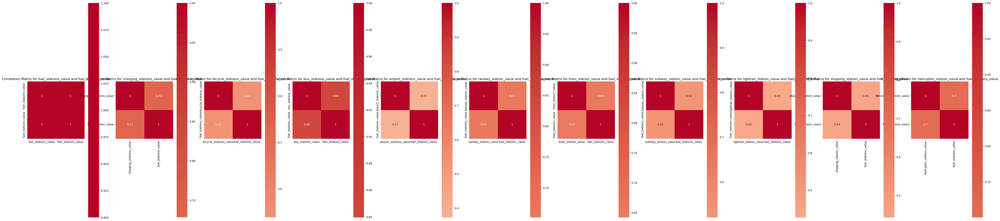

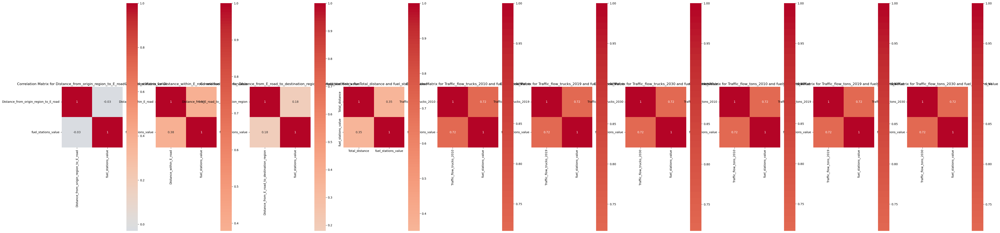

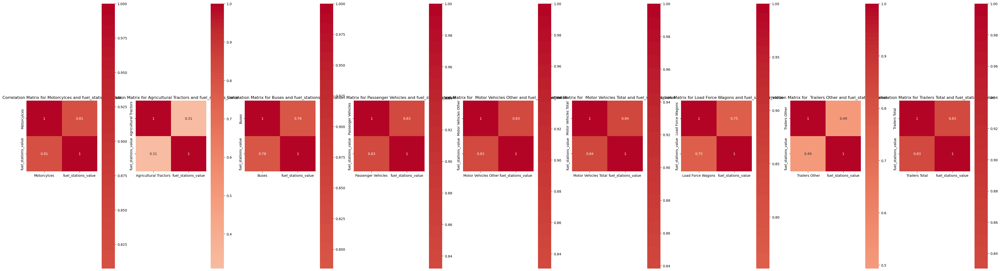

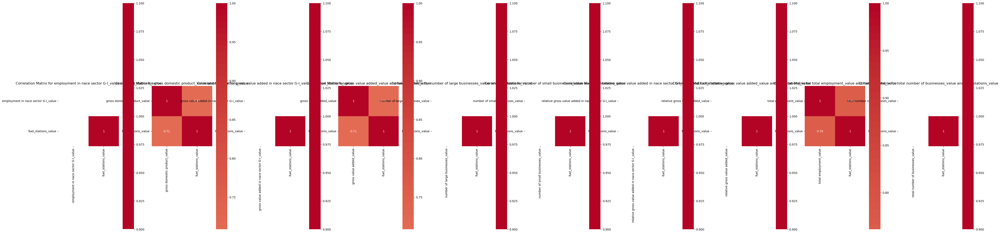

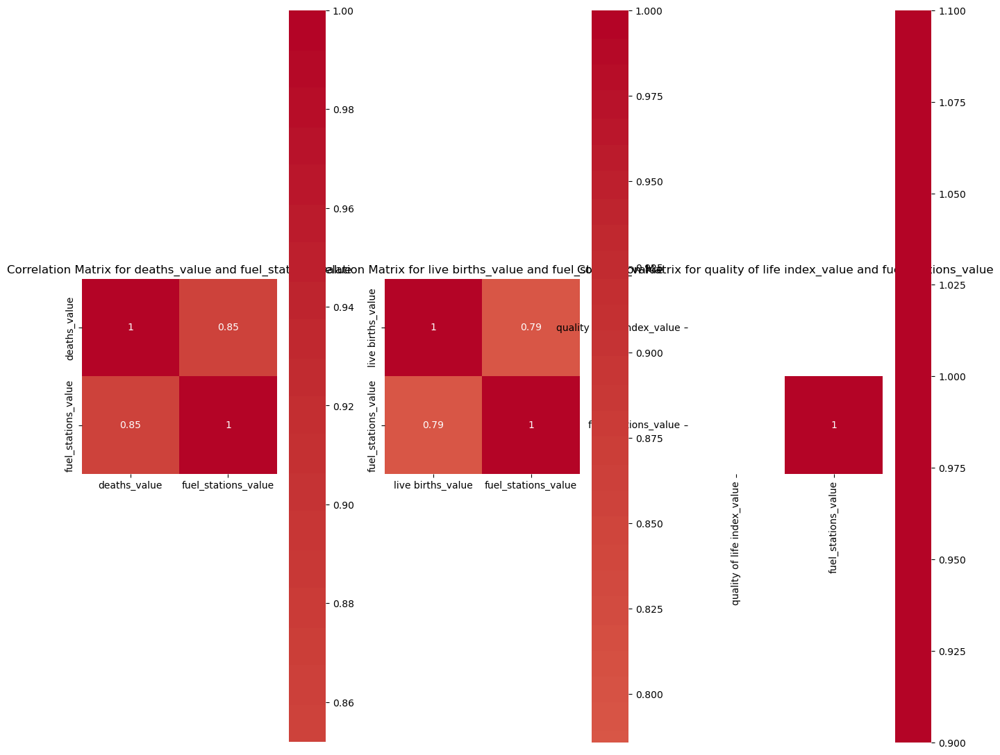

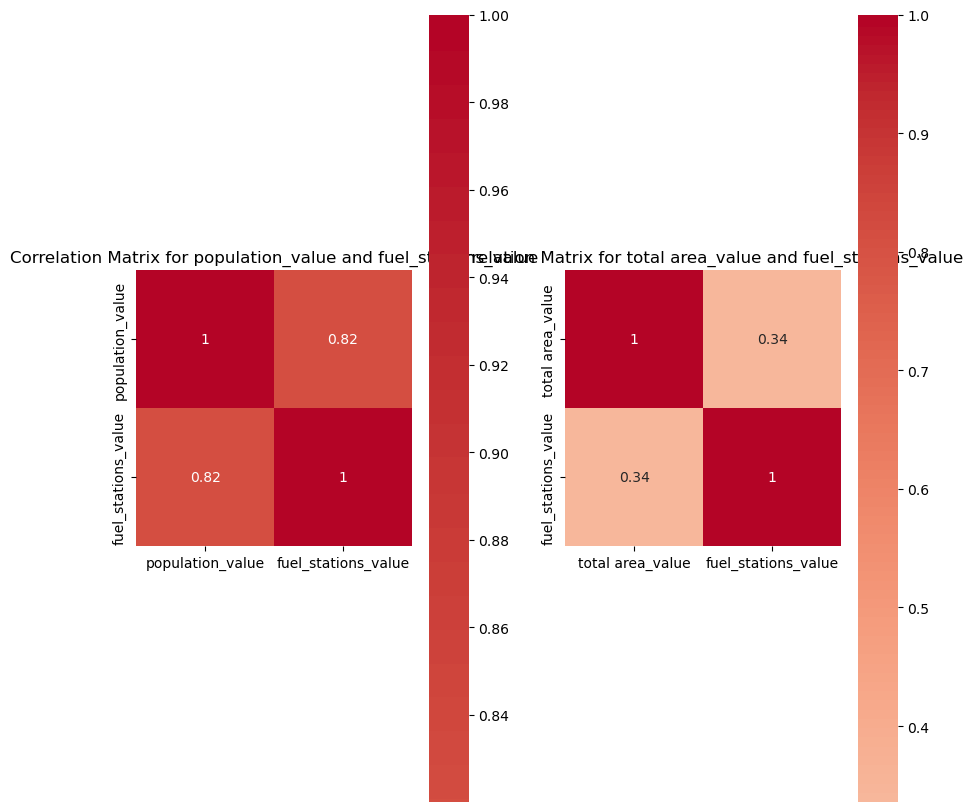

In [225]:
# column_lists = [osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col,
#                 economic_metric_col, socio_metric_col, demo_metric_col]

# indep_col = data_DE_osm_fs[['fuel_stations_value']]

# for col in column_lists:
#     plot_correlation_matrix(data_DE, col, indep_col, figsize=(15, 5))

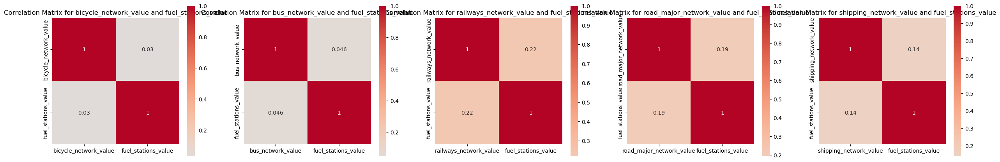

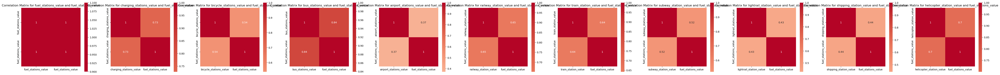

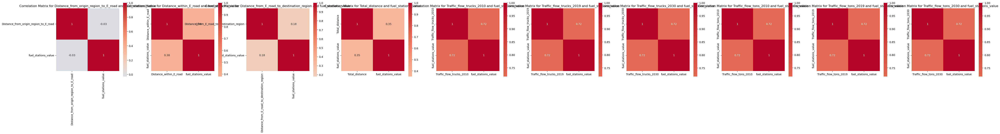

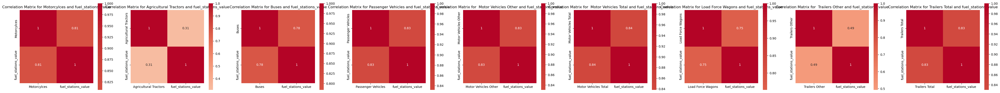

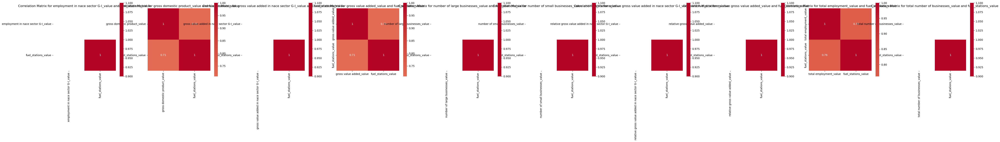

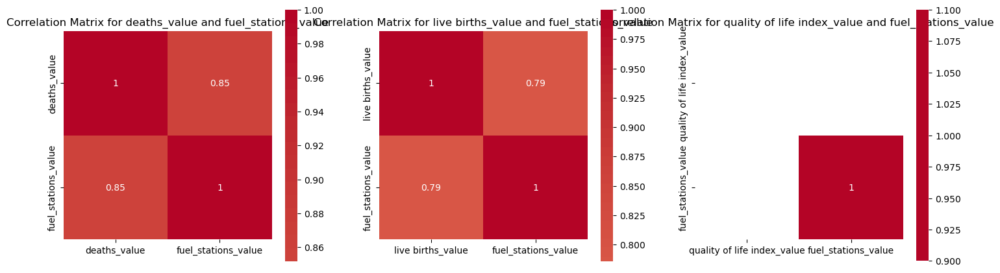

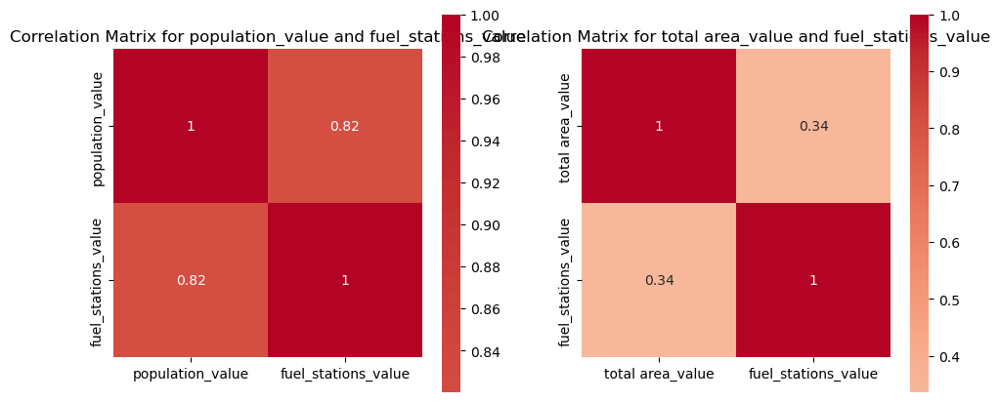

In [222]:
# def plot_correlation_matrix(df, col_list, indep_col, figsize=(4,4)):
#     size = (5*len(col_list), 5)
#     fig, axs = plt.subplots(1, len(col_list), figsize=size)
#     fig.tight_layout(pad=3.0)
    
#     for i, col in enumerate(col_list):
#         cols_all = [col] + [indep_col.columns[0]]
#         data = df[cols_all]
#         corr = data.corr()
#         sns.heatmap(corr, cmap='coolwarm', center=0, square=True, annot=True, ax=axs[i])
#         axs[i].set_title(f"Correlation Matrix for {col} and {indep_col.columns[0]}")
    
#     plt.show()
    
# column_lists = [osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col,
#                 economic_metric_col, socio_metric_col, demo_metric_col]

# indep_col = data_DE_osm_fs[['fuel_stations_value']]

# for col in column_lists:
#     plot_correlation_matrix(data_DE, col, indep_col, figsize=(15, 5))

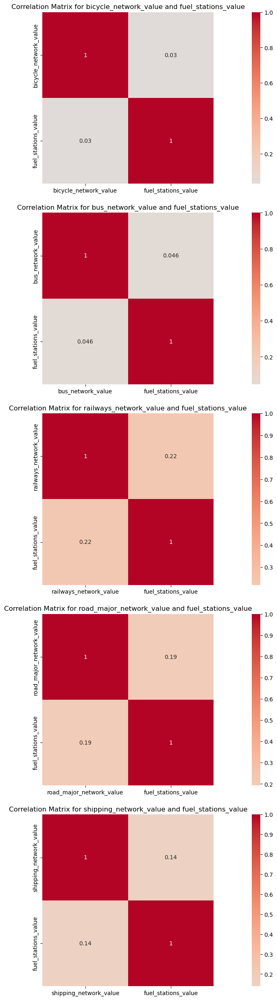

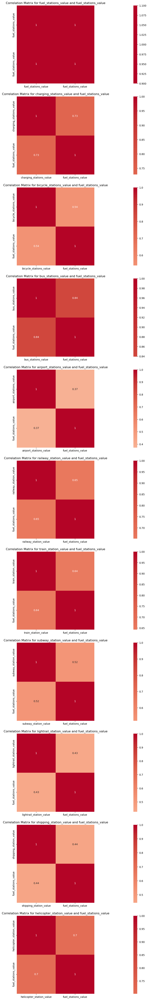

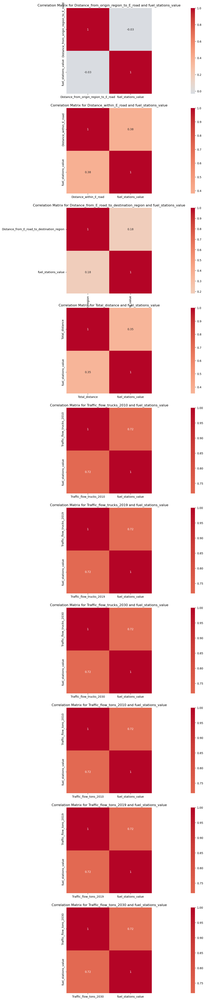

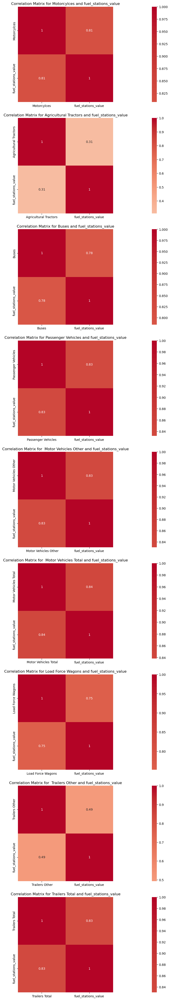

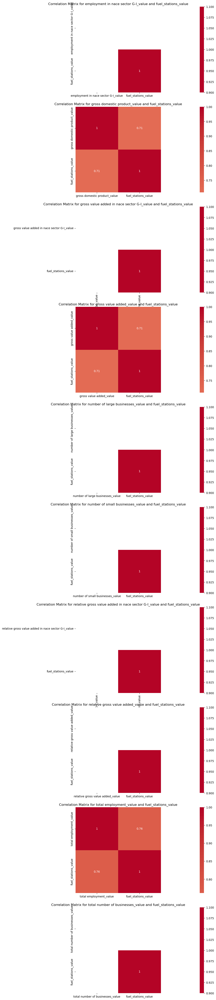

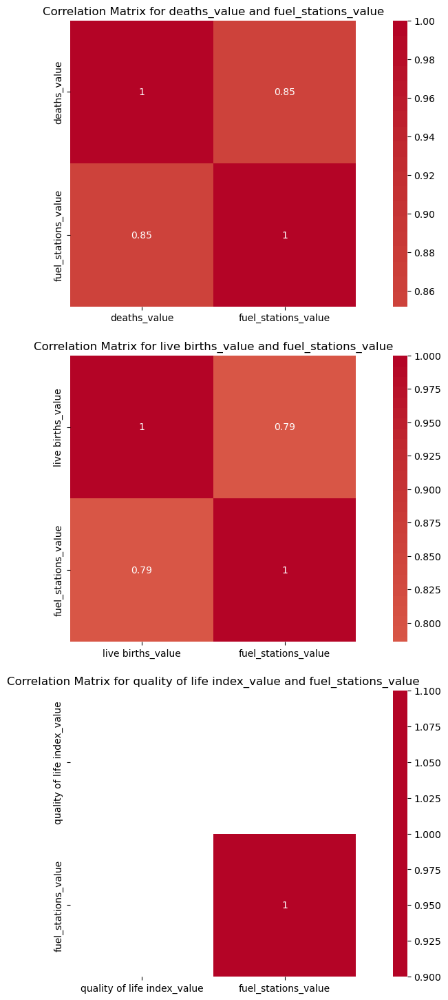

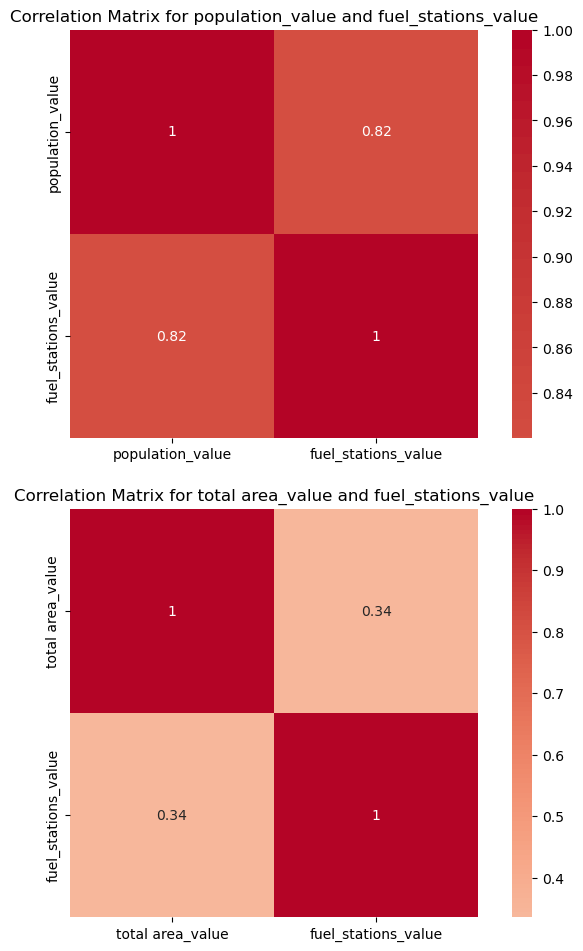

In [226]:
def plot_correlation_matrix(df, col_list, indep_col, figsize=(4,4)):
    size = (4*len(col_list), 5*len(col_list))
    fig, axs = plt.subplots(len(col_list), 1, figsize=size)
    fig.tight_layout(pad=3.0)
    
    for i, col in enumerate(col_list):
        cols_all = [col] + [indep_col.columns[0]]
        data = df[cols_all]
        corr = data.corr()
        sns.heatmap(corr, cmap='coolwarm', center=0, square=True, annot=True, ax=axs[i])
        axs[i].set_title(f"Correlation Matrix for {col} and {indep_col.columns[0]}")
    
    plt.show()
    
column_lists = [osm_net_col, osm_sta_col, traff_flow_col, vehicle_sto_DE_col,
                economic_metric_col, socio_metric_col, demo_metric_col]

indep_col = data_DE_osm_fs[['fuel_stations_value']]

for col_list in column_lists:
    plot_correlation_matrix(data_DE, col_list, indep_col)


### Hypothesis III --> Spatial Disaggregation of OSM Stations for  Germany

        Disaggregation of OSM fuel stations from Country Level to NUTS3 level using OSM Network data, Freight traffic Flow, Vehicle Stock, population, GVA and number of business at NUTS3 level for Germany.  

        - Input data:

                * OSM data Stations NUTSO:
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'
        
                * OSM data Network NUTS3:
                        'bicycle_network_value'
                        'bus_network_value'
                        'railways_network_value'
                        'road_major_network_value'
                        'shipping_network_value',

                * Freight traffic Flow at NUTS3 level:
                        'Distance_from_origin_region_to_E_road', 
                        'Distance_within_E_road', 
                        'Distance_from_E_road_to_destination_region', 
                        'Total_distance'
                        'Traffic_flow_trucks_2010',
                        'Traffic_flow_trucks_2019', 
                        'Traffic_flow_trucks_2030',
                        'Traffic_flow_tons_2010', 
                        'Traffic_flow_tons_2019',
                        'Traffic_flow_tons_2030'

                * Vehicle Stock at NUTS3 level:
                        'Motorcylces', 
                        'Agricultural Tractors',
                        'Buses', 
                        'Passenger Vehicles', 
                        ' Motor Vehicles Other',
                        ' Motor Vehicles Total', 
                        'Load Force Wagons', 
                        ' Trailers Other',
                        'Trailers Total'
                
                * Socio-Economic Data at NUTS3 level:        
                        'gva_value', 
                        'population_value', 
                        'business_value'

        - Output Data (target data):

                * OSM data Stations NUTSO "Disaggregated data":
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'

#### Prepearing the data set for the model 

In [ ]:
df_nuts3 = train_data_NUTS3_DE[[
'NUTS0_region_code', 'NUTS3_region_code', 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value'
]]
df_country = train_data_NUTS0_DE[[
'NUTS0_region_code', 
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'
]]
df = pd.merge(df_nuts3, df_country, how='left', on='NUTS0_region_code')

In [ ]:
len(df_nuts3)

401

##### check again NaN values

###### input Data

In [ ]:
nan_values = np.isnan(df[[
       'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'Motorcylces', 'Agricultural Tractors', 'Buses', 
                            'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
                            'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                                   'gva_value', 
                                   'population_value', 
                                   'business_value',
                                          'fuel_stations_value', 'charging_stations_value',
                                          'bicycle_stations_value', 'bus_stations_value',
                                          'airport_stations_value', 'railway_station_value',
                                          'train_station_value', 'subway_station_value',
                                          'lightrail_station_value', 'shipping_station_value',
                                          'helicopter_station_value' 
       ]]).sum()

In [ ]:
nan_values

bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
Distance_from_origin_region_to_E_road         0
Distance_within_E_road                        0
Distance_from_E_road_to_destination_region    0
Total_distance                                0
Traffic_flow_trucks_2010                      0
Traffic_flow_trucks_2019                      0
Traffic_flow_trucks_2030                      0
Traffic_flow_tons_2010                        0
Traffic_flow_tons_2019                        0
Traffic_flow_tons_2030                        0
Motorcylces                                   0
Agricultural Tractors                         0
Buses                                         0
Passenger Vehicles                            0
 Motor Vehicles Other                         0
 Motor Vehicles Total                   

In [ ]:
df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [ ]:
df.sample(5)

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
328,DE,DEC02,0.0,0.0,97110.607492,436837.773251,0.0,7.0,1277.268215,133.622098,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
45,DE,DE949,0.0,0.0,0.000000,0.000000,0.0,9.0,1410.612526,121.734343,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
129,DE,DE22A,0.0,0.0,0.000000,0.000000,0.0,18.0,1271.935843,141.777588,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
194,DE,DE916,0.0,0.0,0.000000,0.000000,0.0,23.0,1171.209828,129.141186,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
229,DE,DE113,0.0,0.0,0.000000,0.000000,0.0,3.0,1262.011445,123.685980,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


###### Target data

In [ ]:
nan_values = np.isnan(train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'  
]]).sum()

In [ ]:
nan_values

fuel_stations_value         0
charging_stations_value     0
bicycle_stations_value      0
bus_stations_value          0
airport_stations_value      0
railway_station_value       0
train_station_value         0
subway_station_value        0
lightrail_station_value     0
shipping_station_value      0
helicopter_station_value    0
dtype: int64

In [ ]:
len(train_data_NUTS3_DE)

401

##### Defining the input and target variable

In [ ]:
#  Prepearing data input
dataX = df[[ 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value',
                            'fuel_stations_value', 'charging_stations_value',
                            'bicycle_stations_value', 'bus_stations_value',
                            'airport_stations_value', 'railway_station_value',
                            'train_station_value', 'subway_station_value',
                            'lightrail_station_value', 'shipping_station_value',
                            'helicopter_station_value'
]].copy()
dataY = train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'
]].copy()

        Divide the entire dataset into fractions to have a training set from which the machine learning algorithm learns. Also it is needed another set to test the predictions of the ML algorithm. There is no golden rule here: need to consider the size of the entire dataset. Sometimes 5% is more than enough, sometimes it is needed to divide 1/3 to have enough test samples.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [ ]:
X_train.columns

Index(['bicycle_network_value', 'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030', 'Motorcylces',
       'Agricultural Tractors', 'Buses', 'Passenger Vehicles',
       ' Motor Vehicles Other', ' Motor Vehicles Total', 'Load Force Wagons',
       ' Trailers Other', 'Trailers Total', 'gva_value', 'population_value',
       'business_value', 'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value

In [ ]:
y_train.columns

Index(['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

#### Normalization

In [ ]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
count,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,...,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0
mean,7.087708e-17,-2.214909e-18,-5.315781e-17,1.151753e-16,-1.328945e-17,7.087708e-17,2.281356e-16,-1.107454e-16,2.170611e-16,-1.373243e-16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-1.021628e+00,-2.956462e+00,-2.099951e+00,-2.913685e+00,-1.095747e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-6.347679e-01,-3.291813e-01,1.067024e-01,-1.432554e-01,-5.949253e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-3.446226e-01,2.688071e-01,3.179313e-01,3.006220e-01,-2.425328e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,3.323833e-01,6.664594e-01,5.707941e-01,6.186400e-01,2.194994e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.520168e+01,1.546343e+01,6.203096e+00,5.216320e+00,1.123521e+01,6.909012e+00,2.080656e+00,1.520826e+00,2.014643e+00,9.998414e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Cross-Validation
        Another rule of thumb is to split the training set into a sub-training sets and a validation set before seeing its true performance on the test set (25% of the dataset reserved above). This policy is called k-fold cross-validation. The training data is divided into k fractions, trained over (k-1) fractions and tested on the k_th. Here the idea is to increase the generalization of the model as much as possible.
        
        https://scikit-learn.org/stable/modules/cross_validation.html

In [ ]:
k_fold = KFold(n_splits=5, shuffle=True, random_state=2020)

#### How to calculate the performance?
        In any supervised approach, it is needed to select a cost function to compare ML predictions with the true values (labels). The ML algorithm will minimize the cost function by changing its fitting parameters. Some time should be spent to define what might be the best cost function for the data set and the objective.

        In this case, as it is been dealed with regression, it can be used with built-in error functions:

        https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

#### Model Development

In [ ]:
# Hyperparameters:
alpha=600 #alpha = 0 is equivalent to an ordinary least square but it is not recommended to put zero here!
# normalize=False #
max_iter=40000
tol=0.0001
random_state = 2020 # to make the results reproduceble. 
selection='cyclic' # (setting to ‘random’) often leads to significantly faster convergence especially when tol is higher than 1e-4.

lasso_MultiOutputRegressor = MultiOutputRegressor(Lasso(alpha=alpha, max_iter = max_iter, tol = tol, random_state = random_state, selection = selection))

In [ ]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])
# print(predictionsBasedOnKFolds)
# print("X_train shape:", predictionsBasedOnKFolds.shape)
model = lasso_MultiOutputRegressor

#kfold.split will generate indices to split data into training and test set (cv):
# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.values):
# k_fold.split gives as the number of iterations (in this case 1169 are going to be splited into 5 kfolds 
# and the 20 % rest is going to the cross validation check)

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)
scoreLasso = model.score(X_train,y_train)
print('-----------------------------------')
print('Lasso Score: ', scoreLasso)
print('-----------------------------------')

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.392e+06, tolerance: 1.018e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5815010333013301
CV Score:  0.5577654442678383


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.297e+06, tolerance: 1.208e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.724901546744706
CV Score:  -87.05775197634992


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.201e+06, tolerance: 1.190e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.728615821478309
CV Score:  -0.12160410293206407


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.268e+06, tolerance: 1.203e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7393225211136898
CV Score:  -3.4138126146684558


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.217e+06, tolerance: 1.108e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7126162120417227
CV Score:  0.08805120828750836
-----------------------------------
Lasso Score:  0.6832128810751507
-----------------------------------


        If the performance is much worse for CV, then it is overfitting. If they are both bad, then it is probably underfitting the data and we need more complex models.

In [ ]:
# Test Problem:
test_data = df.sample(1,random_state=11).copy()
test_data

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,DE,DE26C,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [ ]:
# Preparing the input data:
x_testing = test_data.drop(['NUTS0_region_code', 'NUTS3_region_code'],axis=1)

In [ ]:
x_testing.head()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,787.343496,259.833587,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [ ]:
# Calling model for the prediction:
lasso_MultiOutputRegressor.predict(x_testing)

array([[ 41.30854428,  37.25452487,  -2.54620547, 600.83380064,
          2.56894481,  64.82679821,   6.4981098 ,  -1.36577209,
         -1.86673774,   1.95241498,   4.66756841]])

#### Accurracy Visualization

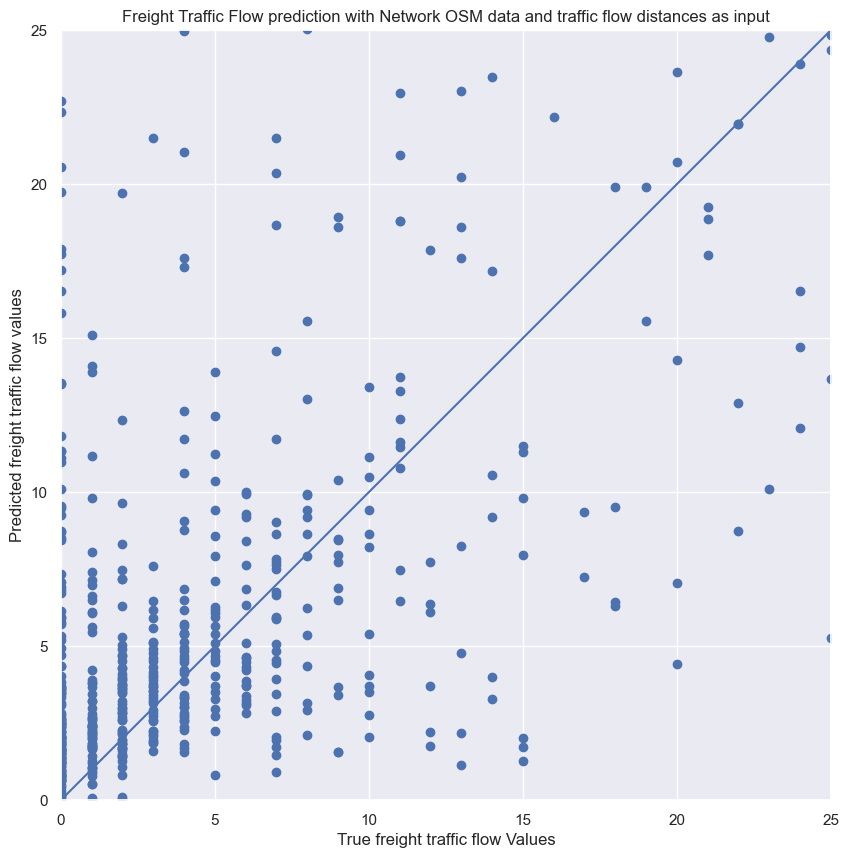

In [ ]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True freight traffic flow Values')
plt.ylabel('Predicted freight traffic flow values')
plt.title('Freight Traffic Flow prediction with Network OSM data and traffic flow distances as input')
lims = [0, 25]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

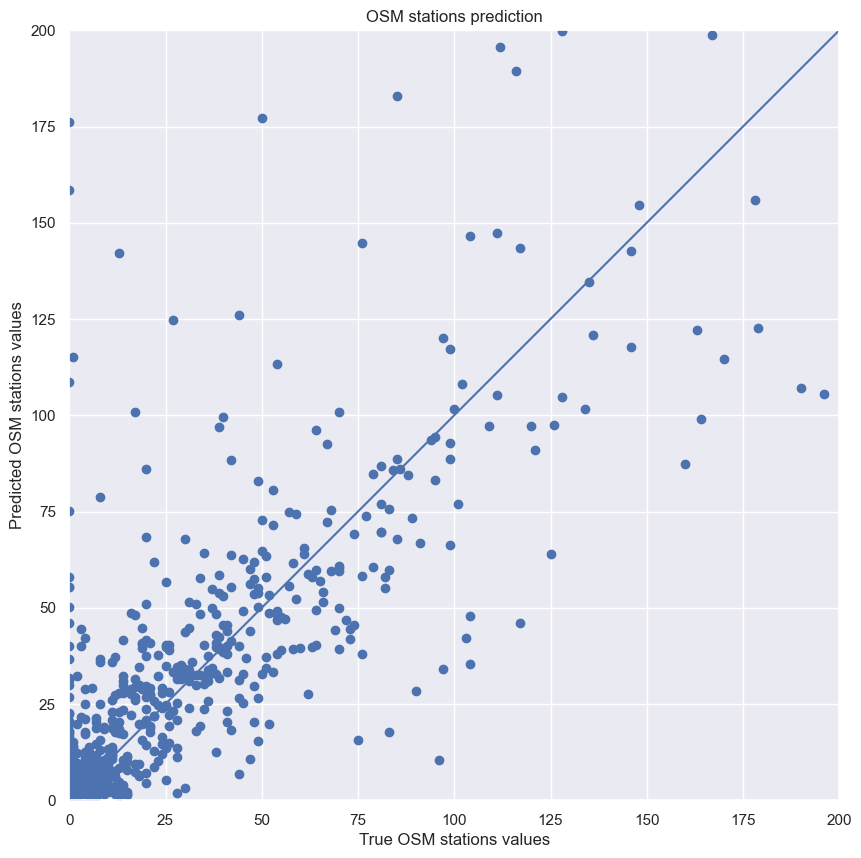

In [ ]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM stations prediction')
lims = [0, 200]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

In [ ]:
Y_test_predictions.head()

,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
2,90.837569,231.416827,135.863679,1428.328604,0.626690,637.354477,30.373684,29.705491,237.665824,3.397169,13.009920
190,73.783465,51.110299,17.224536,1014.118560,3.652173,306.000506,15.902984,7.748899,79.072870,10.731867,10.457243
302,57.265283,75.486579,26.280268,1037.938478,1.853243,180.832352,10.791546,3.940352,52.740105,0.969925,6.041467
257,54.767178,47.960992,9.607300,1200.602437,2.103537,24.376120,6.945861,-2.091973,-11.187129,3.352093,5.763476
208,39.163558,35.593772,6.252520,650.828193,0.983010,115.680454,5.409870,-0.592089,33.711505,3.242904,4.659845


#### Error Distribution Calculation

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6709: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6710: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

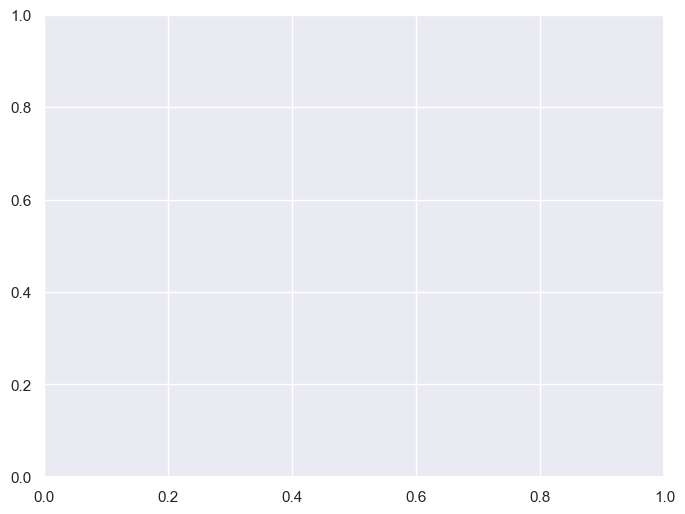

In [ ]:
# Calculating the error distribution

# The error you are encountering is because the error_lasso variable contains some inf values (infinity). 
# When plotting with matplotlib's hist function, you need to supply a finite range for the x-axis, 
# but the range of error_lasso is not finite because of the inf values.
# To resolve this issue, you need to remove or replace the inf values in error_lasso. 
# For example, you could replace them with NaN values, which can be ignored in the plot:

error_lasso = (Y_test_predictions - y_test)/y_test*100
error_lasso[np.isinf(error_lasso)] = np.nan
plt.hist(error_lasso, bins=3)
plt.xlabel('Predicted Relative % Error')
plt.ylabel('count')

#### Tuning Hyperparameters

        Here it can be seen that the model fails! So, is it possible to improve the model outcome? We can tune the hyperparameter alpha and use grid search to sweep possible values.

        For that purpose, we will use GridSearchCV of scikit learn: we will give the list of hyperparameters and it will use CV to test possible combinations. Here we only have one parameter to play with.

In [ ]:
# create a Lasso regressor object
lasso_reg = Lasso(max_iter = max_iter, tol = tol, random_state = random_state, selection = selection)

# create a MultiOutputRegressor object
multi_regressor = MultiOutputRegressor(lasso_reg)

# define a grid of hyperparameters to search
param_grid = {'estimator__alpha': [-4, 0, 1, 10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]}

# create a GridSearchCV object
grid_search = GridSearchCV(multi_regressor, param_grid, scoring='r2', cv=k_fold, refit=True)

# fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# get the results 
results = grid_search.cv_results_
# get the best hyperparameters from the grid search
print("Best Hyperparameters: ", grid_search.best_params_)
# Perform the grid search
print('Best R^2 obtained:', grid_search.best_score_)

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\multioutput.py:49: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X, y, **fit_params)
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.113e+04, tolerance: 1.815e+01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  m

Best Hyperparameters:  {'estimator__alpha': 600}
Best R^2 obtained: -17.98947040827902


In [ ]:
#Lets check the keys to plot them:
results.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_estimator__alpha', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

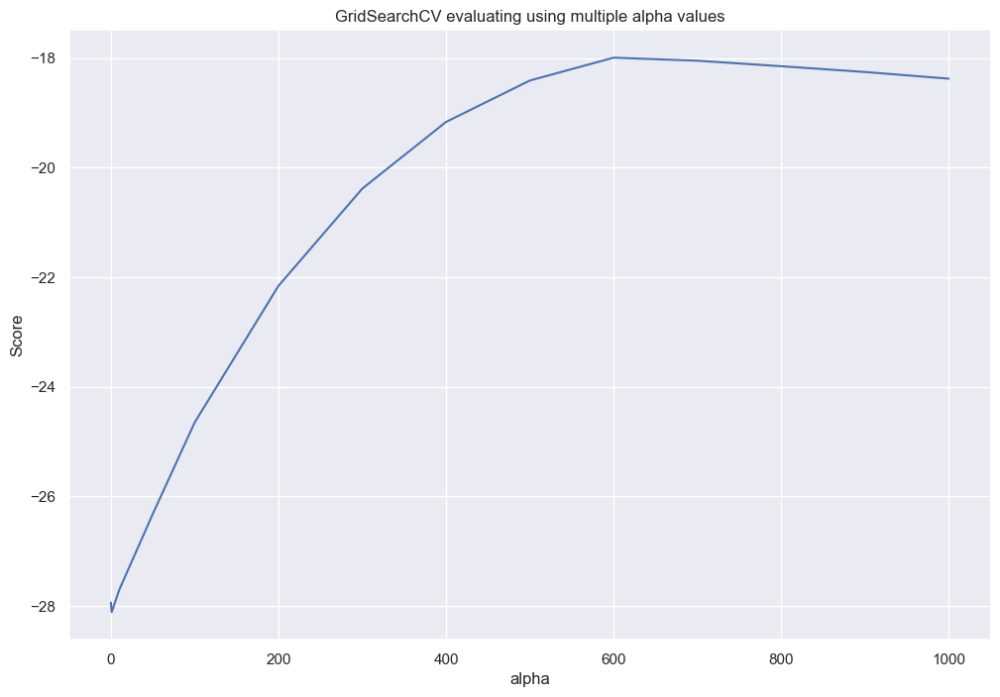

In [ ]:
# Plotting the results
plt.figure(figsize=(12, 8))
plt.title("GridSearchCV evaluating using multiple alpha values",
          fontsize=12)
plt.xlabel("alpha")
plt.ylabel("Score")
# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_estimator__alpha'].data, dtype=float)
Y_axis = np.array(results['mean_test_score'].data, dtype=float)
plt.plot(X_axis,Y_axis)
plt.show()

#### Learning curve

In [ ]:
# # Defining our function to run the model and see the evolution of error>
# def plot_learning_curves(model, X_train, X_test, y_train, y_test):
#   #Empty lists for data storage:
#   train_errors, val_errors = [], []
#   # Remember, we will look at the error as model is trained with more data.
#   # So we will make predictions with increasing instance sizes for both the training set and test set.
#   for m in range(1, len(X_train)):
#     #Model fitting:
#     model.fit(X_train[:m], y_train[:m])
#     #Predicting for the training data:
#     y_train_predict = model.predict(X_train[:m])
#     #Predicting for the test data:
#     y_test_predict = model.predict(X_test)
#     #Saving the errors for the plot for a given data size:
#     train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
#     val_errors.append(mean_squared_error(y_test, y_test_predict))
  
#   # Plotting the results:
#   plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
#   plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
#   plt.legend()
#   plt.xlim(0, 50),  plt.ylim(0.01,50)
#   plt.yscale("log")
#   plt.xlabel("Instances"),  plt.ylabel("MSE")
  
# # Calling our function to draw the learning curve for elastic net:
# plot_learning_curves(model,X_train, X_test, y_train, y_test) 

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\pandas\core\common.py:245: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


TypeError: unhashable type: 'Series'

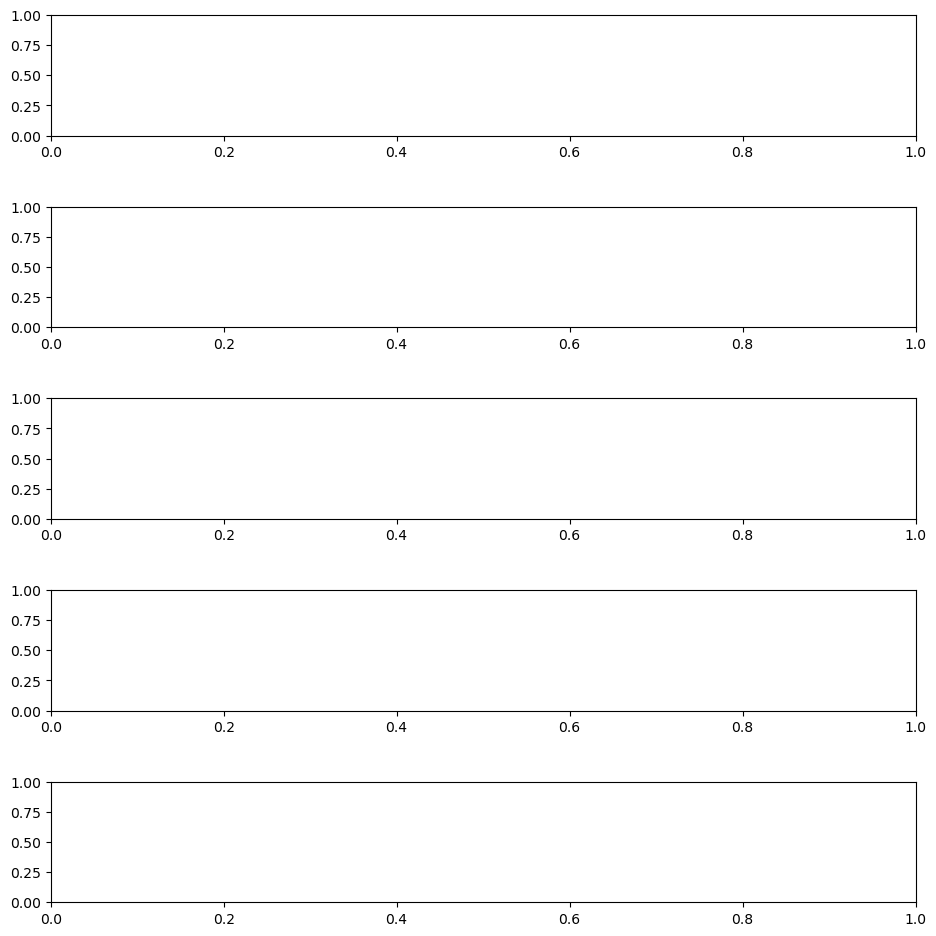

In [189]:
def plot_correlation_matrix(df, col_lists, indep_col, figsize=(10,10)):
    num_subplots = len(col_lists)
    fig, axs = plt.subplots(num_subplots, 1, figsize=figsize)
    fig.tight_layout(pad=3.0)

    for i, cols in enumerate(col_lists):
        # Convert to list if cols is a string
        if isinstance(cols, str):
            cols = [cols]
        # Combine independent and dependent variables
        cols_all = cols.copy()
        cols_all.append(indep_col)
        data = df[cols_all]
        # Calculate correlation matrix
        corr = data.corr()
        # Create heatmap plot
        sns.heatmap(corr, cmap='coolwarm', center=0, square=True, annot=True, ax=axs[i])
        axs[i].set_title(f"Correlation Matrix for {', '.join(cols_all)}")

    plt.show()

for column in column_lists:
    plot_correlation_matrix(data_DE, column, indep_col, figsize=(10,10))

KeyError: "['number of busses_PL_value', 'number of lorries_PL_value', 'number of mopeds_PL_value', 'number of motorcycles_PL_value', 'number of passenger cars_PL_value', 'number of residential buildings_PL_value', 'number of road tractors_PL_value'] not in index"

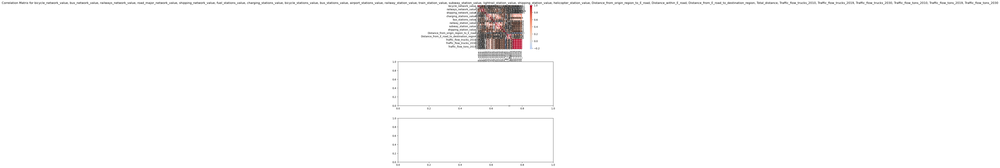

In [169]:
import itertools

column_lists = [[osm_net_col, osm_sta_col, traff_flow_col],
                [vehicle_sto_DE_col, ,
                [economic_metric_col, socio_metric_col, demo_metric_col]]

def plot_correlation_matrix(df, col_lists, figsize=(10,10)):
    num_subplots = len(col_lists)
    fig, axs = plt.subplots(num_subplots, 1, figsize=figsize)
    fig.tight_layout(pad=3.0)

    for i, cols in enumerate(col_lists):
        cols_all = list(itertools.chain(*cols))
        data = df[cols_all]
        corr = data.corr()
        sns.heatmap(corr, cmap='coolwarm', center=0, square=True, annot=True, ax=axs[i])
        axs[i].set_title(f"Correlation Matrix for {', '.join(cols_all)}")

    plt.show()

plot_correlation_matrix(data_DE, column_lists, figsize=(10,10))


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\pandas\core\common.py:245: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = np.asarray(values, dtype=dtype)


TypeError: unhashable type: 'list'

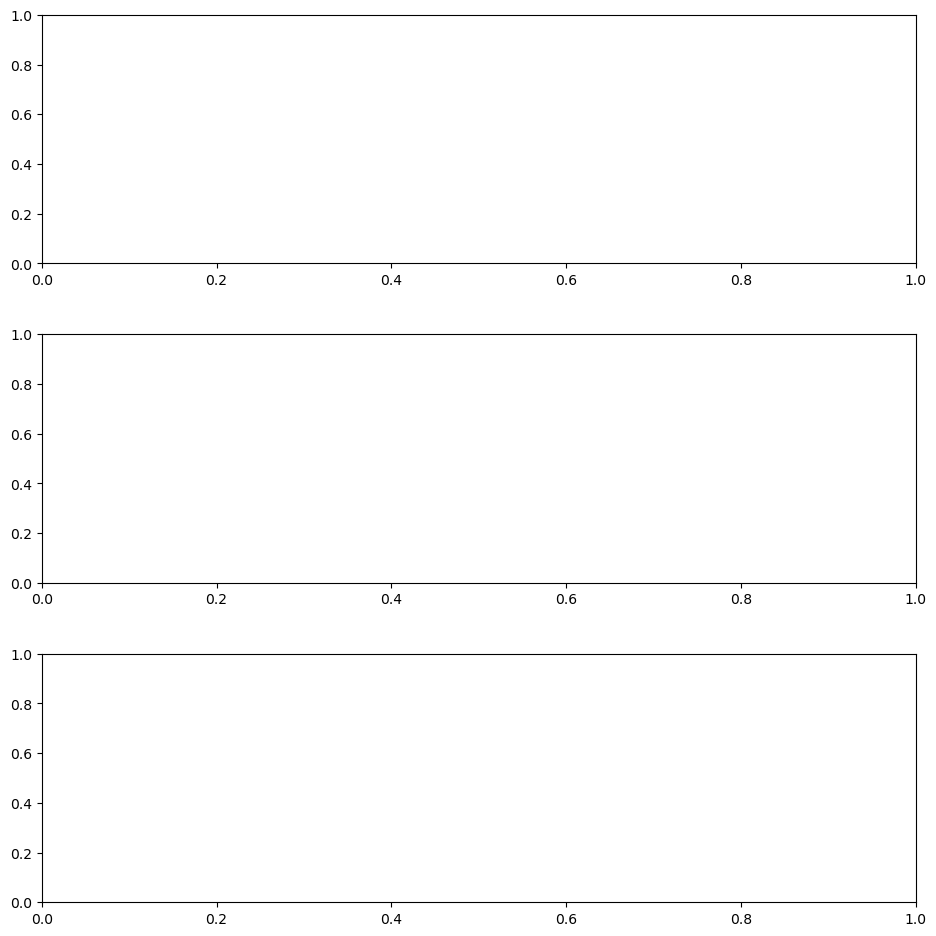

In [168]:
column_lists = [[osm_net_col, osm_sta_col, traff_flow_col],
                [vehicle_sto_DE_col, transport_PL_col],
                [economic_metric_col, socio_metric_col, demo_metric_col]]
plot_correlation_matrix(data_DE, column_lists, figsize=(10,10))

In [52]:
data_DE = data_DE.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'LAU_region_code'],axis=1)
data_network_NUTS3_X = data_network_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
data_stations_LAU_X = data_stations_LAU.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'LAU_region_code'],axis=1)
data_stations_NUTS3_X = data_stations_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
freight_traffic_flow_NUTS3_X = freight_traffic_flow_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
vehicle_stock_NUTS3_X = vehicle_stock_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
gva_popu_busi_NUTS3_X = train_data_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total'],axis=1)
train_data_NUTS3_X = train_data_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
train_data_NUTS0_X = train_data_NUTS0.copy().drop(['EU_region_code', 'NUTS0_region_code'],axis=1)

In [53]:
correlationMatrix_1 = pd.DataFrame(data_network_LAU_X).corr()
correlationMatrix_2 = pd.DataFrame(data_network_NUTS3_X).corr()  
correlationMatrix_3 = pd.DataFrame(data_stations_LAU_X).corr() 
correlationMatrix_4 = pd.DataFrame(data_stations_NUTS3_X).corr()
correlationMatrix_5 = pd.DataFrame(freight_traffic_flow_NUTS3_X).corr()   
correlationMatrix_6 = pd.DataFrame(vehicle_stock_NUTS3_X).corr()   
correlationMatrix_7 = pd.DataFrame(train_data_NUTS3_X).corr()   
correlationMatrix_8 = pd.DataFrame(train_data_NUTS0_X).corr()
correlationMatrix_9 = pd.DataFrame(gva_popu_busi_NUTS3_X).corr()

In [54]:
#we can also simply look at the table via pandas:
correlationMatrix_1.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\2933393365.py:2: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_1.style.background_gradient(cmap='viridis').set_precision(3)


,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value
bicycle_network_value,1.000,-0.001,0.181,0.135,0.025
bus_network_value,-0.001,1.000,0.002,0.024,-0.000
railways_network_value,0.181,0.002,1.000,0.508,0.140
road_major_network_value,0.135,0.024,0.508,1.000,0.236
shipping_network_value,0.025,-0.000,0.140,0.236,1.000


In [55]:
correlationMatrix_2.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\4058540874.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_2.style.background_gradient(cmap='viridis').set_precision(3)


,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value
bicycle_network_value,1.000,-0.006,0.227,0.202,0.073
bus_network_value,-0.006,1.000,0.009,0.029,-0.004
railways_network_value,0.227,0.009,1.000,0.724,0.194
road_major_network_value,0.202,0.029,0.724,1.000,0.242
shipping_network_value,0.073,-0.004,0.194,0.242,1.000


In [56]:
correlationMatrix_3.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\4114271531.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_3.style.background_gradient(cmap='viridis').set_precision(3)


,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
fuel_stations_value,1.000,0.476,0.382,0.809,0.247,0.610,0.523,0.411,0.319,0.271,0.380
charging_stations_value,0.476,1.000,0.393,0.549,0.118,0.711,0.625,0.420,0.442,0.400,0.292
bicycle_stations_value,0.382,0.393,1.000,0.497,0.061,0.637,0.425,0.634,0.311,0.306,0.213
bus_stations_value,0.809,0.549,0.497,1.000,0.204,0.697,0.552,0.521,0.342,0.344,0.379
airport_stations_value,0.247,0.118,0.061,0.204,1.000,0.114,0.117,0.076,0.067,0.091,0.129
railway_station_value,0.610,0.711,0.637,0.697,0.114,1.000,0.753,0.722,0.562,0.408,0.385
train_station_value,0.523,0.625,0.425,0.552,0.117,0.753,1.000,0.541,0.444,0.341,0.297
subway_station_value,0.411,0.420,0.634,0.521,0.076,0.722,0.541,1.000,0.306,0.314,0.267
lightrail_station_value,0.319,0.442,0.311,0.342,0.067,0.562,0.444,0.306,1.000,0.288,0.215
shipping_station_value,0.271,0.400,0.306,0.344,0.091,0.408,0.341,0.314,0.288,1.000,0.182


In [57]:
correlationMatrix_4.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\3373798373.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_4.style.background_gradient(cmap='viridis').set_precision(3)


,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
fuel_stations_value,1.000,0.482,0.496,0.701,0.723,0.596,0.661,0.419,0.170,0.268,0.698
charging_stations_value,0.482,1.000,0.489,0.576,0.319,0.649,0.501,0.437,0.351,0.370,0.429
bicycle_stations_value,0.496,0.489,1.000,0.500,0.296,0.713,0.478,0.664,0.294,0.247,0.382
bus_stations_value,0.701,0.576,0.500,1.000,0.595,0.633,0.583,0.405,0.175,0.334,0.561
airport_stations_value,0.723,0.319,0.296,0.595,1.000,0.401,0.508,0.183,-0.001,0.206,0.589
railway_station_value,0.596,0.649,0.713,0.633,0.401,1.000,0.730,0.726,0.471,0.334,0.461
train_station_value,0.661,0.501,0.478,0.583,0.508,0.730,1.000,0.475,0.254,0.268,0.482
subway_station_value,0.419,0.437,0.664,0.405,0.183,0.726,0.475,1.000,0.357,0.225,0.331
lightrail_station_value,0.170,0.351,0.294,0.175,-0.001,0.471,0.254,0.357,1.000,0.180,0.087
shipping_station_value,0.268,0.370,0.247,0.334,0.206,0.334,0.268,0.225,0.180,1.000,0.226


In [58]:
correlationMatrix_5.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\1653278224.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_5.style.background_gradient(cmap='viridis').set_precision(3)


,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030
Distance_from_origin_region_to_E_road,1.000,0.163,0.171,0.395,0.038,0.044,0.043,0.038,0.044,0.043
Distance_within_E_road,0.163,1.000,0.092,0.958,0.015,-0.021,-0.040,0.015,-0.021,-0.040
Distance_from_E_road_to_destination_region,0.171,0.092,1.000,0.274,0.138,0.146,0.152,0.138,0.146,0.152
Total_distance,0.395,0.958,0.274,1.000,0.043,0.013,-0.004,0.043,0.013,-0.004
Traffic_flow_trucks_2010,0.038,0.015,0.138,0.043,1.000,0.971,0.877,1.000,0.971,0.877
Traffic_flow_trucks_2019,0.044,-0.021,0.146,0.013,0.971,1.000,0.966,0.971,1.000,0.966
Traffic_flow_trucks_2030,0.043,-0.040,0.152,-0.004,0.877,0.966,1.000,0.877,0.966,1.000
Traffic_flow_tons_2010,0.038,0.015,0.138,0.043,1.000,0.971,0.877,1.000,0.971,0.877
Traffic_flow_tons_2019,0.044,-0.021,0.146,0.013,0.971,1.000,0.966,0.971,1.000,0.966
Traffic_flow_tons_2030,0.043,-0.040,0.152,-0.004,0.877,0.966,1.000,0.877,0.966,1.000


In [59]:
correlationMatrix_6.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\1084538796.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_6.style.background_gradient(cmap='viridis').set_precision(3)


,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total
Motorcylces,1.000,0.312,0.883,0.971,0.962,0.977,0.827,0.350,0.798
Agricultural Tractors,0.312,1.000,0.121,0.167,0.403,0.206,0.076,0.762,0.510
Buses,0.883,0.121,1.000,0.932,0.891,0.933,0.877,0.181,0.733
Passenger Vehicles,0.971,0.167,0.932,1.000,0.942,0.999,0.877,0.265,0.783
Motor Vehicles Other,0.962,0.403,0.891,0.942,1.000,0.959,0.905,0.419,0.895
Motor Vehicles Total,0.977,0.206,0.933,0.999,0.959,1.000,0.888,0.291,0.807
Load Force Wagons,0.827,0.076,0.877,0.877,0.905,0.888,1.000,0.158,0.807
Trailers Other,0.350,0.762,0.181,0.265,0.419,0.291,0.158,1.000,0.711
Trailers Total,0.798,0.510,0.733,0.783,0.895,0.807,0.807,0.711,1.000


In [60]:
correlationMatrix_7.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\3199873490.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_7.style.background_gradient(cmap='viridis').set_precision(3)


,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total,gva_value,population_value,business_value
bicycle_network_value,1.000,-0.006,0.227,0.202,0.073,0.207,0.235,0.198,0.168,0.153,0.189,0.145,0.096,0.120,0.128,0.191,-0.002,0.034,0.057,0.039,0.052,0.073,0.085,0.052,0.073,0.085,0.038,-0.064,0.080,0.039,0.049,0.040,0.090,0.013,0.072,0.095,0.116,0.072
bus_network_value,-0.006,1.000,0.009,0.029,-0.004,0.017,0.005,-0.002,0.013,0.022,0.004,0.008,-0.009,-0.008,-0.016,0.011,-0.005,0.026,-0.032,0.017,-0.022,-0.022,-0.022,-0.022,-0.022,-0.022,0.000,-0.000,0.001,0.000,0.001,0.000,0.001,0.003,0.003,-0.013,-0.013,-0.005
railways_network_value,0.227,0.009,1.000,0.724,0.194,0.434,0.299,0.282,0.523,0.551,0.486,0.495,0.148,0.044,0.200,0.362,-0.038,0.195,0.062,0.178,0.181,0.273,0.369,0.181,0.273,0.369,0.018,-0.034,0.052,0.024,0.031,0.025,0.060,0.013,0.050,0.197,0.382,0.363
road_major_network_value,0.202,0.029,0.724,1.000,0.242,0.571,0.367,0.248,0.577,0.695,0.375,0.407,0.120,0.000,0.200,0.482,0.002,0.348,0.038,0.322,0.098,0.146,0.197,0.098,0.146,0.197,0.006,-0.013,0.023,0.009,0.014,0.010,0.028,0.013,0.028,0.175,0.284,0.283
shipping_network_value,0.073,-0.004,0.194,0.242,1.000,0.126,0.117,0.054,0.209,0.175,0.080,0.088,0.021,0.013,0.242,0.071,0.012,0.177,0.123,0.182,0.026,0.024,0.024,0.026,0.024,0.024,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000,-0.000,0.033,0.040,0.071
fuel_stations_value,0.207,0.017,0.434,0.571,0.126,1.000,0.482,0.496,0.701,0.723,0.596,0.661,0.419,0.170,0.268,0.698,-0.020,0.368,0.034,0.335,0.402,0.391,0.362,0.402,0.391,0.362,0.110,0.042,0.107,0.113,0.113,0.114,0.102,0.067,0.113,0.499,0.681,0.595
charging_stations_value,0.235,0.005,0.299,0.367,0.117,0.482,1.000,0.489,0.576,0.319,0.649,0.501,0.437,0.351,0.370,0.429,-0.061,0.069,0.074,0.060,0.263,0.302,0.321,0.263,0.302,0.321,0.352,0.046,0.363,0.368,0.348,0.367,0.336,0.057,0.273,0.548,0.492,0.407
bicycle_stations_value,0.198,-0.002,0.282,0.248,0.054,0.496,0.489,1.000,0.500,0.296,0.713,0.478,0.664,0.294,0.247,0.382,-0.021,0.122,0.072,0.118,0.234,0.261,0.276,0.234,0.261,0.276,0.202,-0.027,0.235,0.217,0.204,0.216,0.225,-0.041,0.136,0.606,0.536,0.527
bus_stations_value,0.168,0.013,0.523,0.577,0.209,0.701,0.576,0.500,1.000,0.595,0.633,0.583,0.405,0.175,0.334,0.561,-0.009,0.238,0.212,0.247,0.298,0.331,0.358,0.298,0.331,0.358,0.162,0.063,0.155,0.165,0.167,0.166,0.153,0.108,0.173,0.512,0.587,0.523
airport_stations_value,0.153,0.022,0.551,0.695,0.175,0.723,0.319,0.296,0.595,1.000,0.401,0.508,0.183,-0.001,0.206,0.589,-0.012,0.325,0.033,0.298,0.200,0.215,0.230,0.200,0.215,0.230,0.044,0.104,0.032,0.033,0.056,0.037,0.024,0.117,0.087,0.224,0.374,0.363


In [61]:
correlationMatrix_8.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\3371517567.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_8.style.background_gradient(cmap='viridis').set_precision(3)


,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,Traffic_flow_trucks_2019,Traffic_flow_trucks_2030,Traffic_flow_tons_2010,Traffic_flow_tons_2019,Traffic_flow_tons_2030,Motorcylces,Agricultural Tractors,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total,gva_value,population_value,business_value
bicycle_network_value,1.000,0.216,0.669,0.639,0.209,0.745,0.928,0.854,0.920,0.825,0.917,0.751,0.824,0.768,0.796,0.800,0.587,0.788,0.802,0.794,0.719,0.793,0.833,0.719,0.793,0.833,0.643,0.643,0.643,0.643,0.643,0.643,0.643,0.643,0.643,0.876,0.813,0.444
bus_network_value,0.216,1.000,0.259,0.306,0.038,0.208,0.144,0.242,0.170,0.263,0.187,0.156,0.304,0.029,0.020,0.245,0.246,0.114,0.033,0.111,0.055,0.075,0.088,0.055,0.075,0.088,-0.011,-0.011,-0.011,-0.011,-0.011,-0.011,-0.011,-0.011,-0.011,0.128,0.160,0.223
railways_network_value,0.669,0.259,1.000,0.831,0.423,0.691,0.628,0.870,0.761,0.777,0.762,0.717,0.785,0.306,0.476,0.726,0.327,0.416,0.390,0.417,0.451,0.524,0.583,0.451,0.524,0.583,0.158,0.158,0.158,0.158,0.158,0.158,0.158,0.158,0.158,0.586,0.663,0.699
road_major_network_value,0.639,0.306,0.831,1.000,0.465,0.703,0.615,0.827,0.716,0.790,0.677,0.625,0.885,0.230,0.403,0.771,0.340,0.272,0.231,0.273,0.285,0.332,0.367,0.285,0.332,0.367,0.029,0.029,0.029,0.029,0.029,0.029,0.029,0.029,0.029,0.547,0.537,0.684
shipping_network_value,0.209,0.038,0.423,0.465,1.000,0.275,0.199,0.362,0.347,0.278,0.223,0.221,0.347,-0.030,0.265,0.257,0.192,0.041,0.063,0.046,0.098,0.091,0.088,0.098,0.091,0.088,-0.148,-0.148,-0.148,-0.148,-0.148,-0.148,-0.148,-0.148,-0.148,0.168,0.173,0.391
fuel_stations_value,0.745,0.208,0.691,0.703,0.275,1.000,0.780,0.895,0.852,0.949,0.864,0.953,0.862,0.580,0.689,0.979,0.584,0.711,0.625,0.709,0.824,0.802,0.762,0.824,0.802,0.762,0.357,0.357,0.357,0.357,0.357,0.357,0.357,0.357,0.357,0.880,0.934,0.826
charging_stations_value,0.928,0.144,0.628,0.615,0.199,0.780,1.000,0.829,0.948,0.867,0.959,0.832,0.810,0.884,0.874,0.815,0.477,0.873,0.880,0.876,0.814,0.871,0.896,0.814,0.871,0.896,0.753,0.753,0.753,0.753,0.753,0.753,0.753,0.753,0.753,0.950,0.861,0.435
bicycle_stations_value,0.854,0.242,0.870,0.827,0.362,0.895,0.829,1.000,0.930,0.943,0.914,0.879,0.934,0.554,0.636,0.936,0.584,0.652,0.617,0.655,0.687,0.731,0.753,0.687,0.731,0.753,0.368,0.368,0.368,0.368,0.368,0.368,0.368,0.368,0.368,0.821,0.850,0.736
bus_stations_value,0.920,0.170,0.761,0.716,0.347,0.852,0.948,0.930,1.000,0.938,0.979,0.889,0.872,0.784,0.794,0.883,0.523,0.826,0.828,0.830,0.804,0.856,0.880,0.804,0.856,0.880,0.638,0.638,0.638,0.638,0.638,0.638,0.638,0.638,0.638,0.927,0.886,0.549
airport_stations_value,0.825,0.263,0.777,0.790,0.278,0.949,0.867,0.943,0.938,1.000,0.944,0.943,0.928,0.663,0.704,0.972,0.565,0.745,0.688,0.745,0.784,0.804,0.802,0.784,0.804,0.802,0.467,0.467,0.467,0.467,0.467,0.467,0.467,0.467,0.467,0.905,0.911,0.736


In [62]:
correlationMatrix_9.style.background_gradient(cmap='viridis').set_precision(3)

C:\Users\rofer\AppData\Local\Temp\ipykernel_27932\1688847138.py:1: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  correlationMatrix_9.style.background_gradient(cmap='viridis').set_precision(3)


,gva_value,population_value,business_value
gva_value,1.000,0.847,0.767
population_value,0.847,1.000,0.870
business_value,0.767,0.870,1.000


### Sensitivity Analysis

#### Bar charts

##### Network data LAU

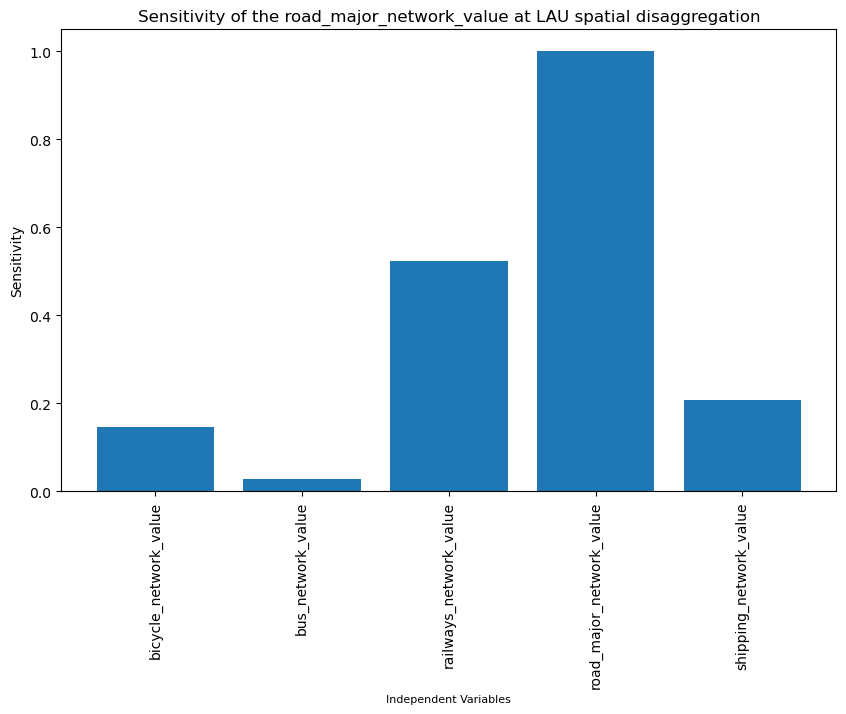

In [63]:
# Load the data
X = data_network_LAU[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
dependent_variable = 'road_major_network_value'
y = data_network_LAU[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at LAU spatial disaggregation")
plt.show()

##### Network data NUTS3

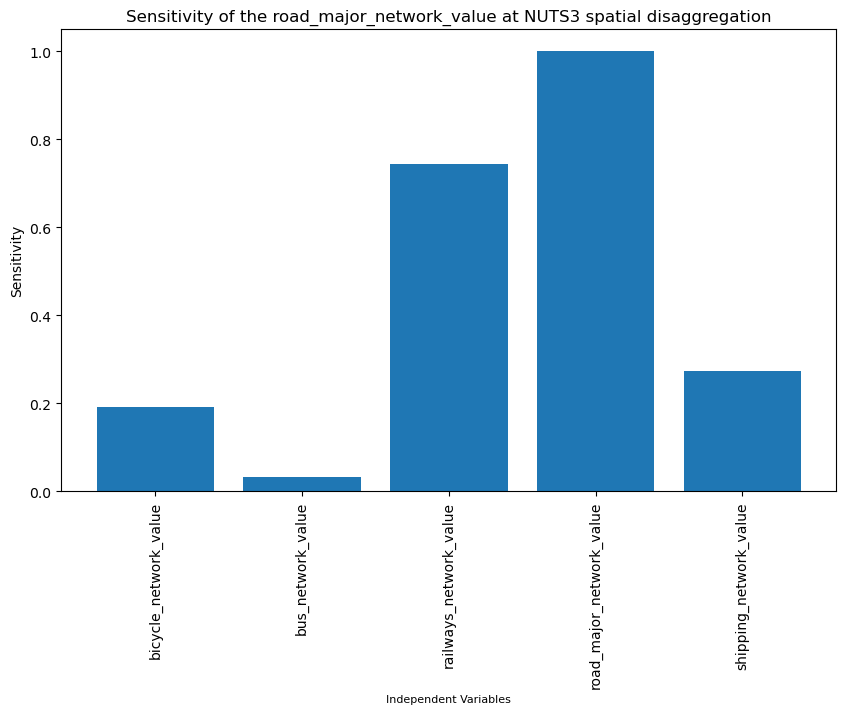

In [64]:
# Load the data
X = data_network_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
dependent_variable = 'road_major_network_value'
y = data_network_NUTS3[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Stations Data LAU

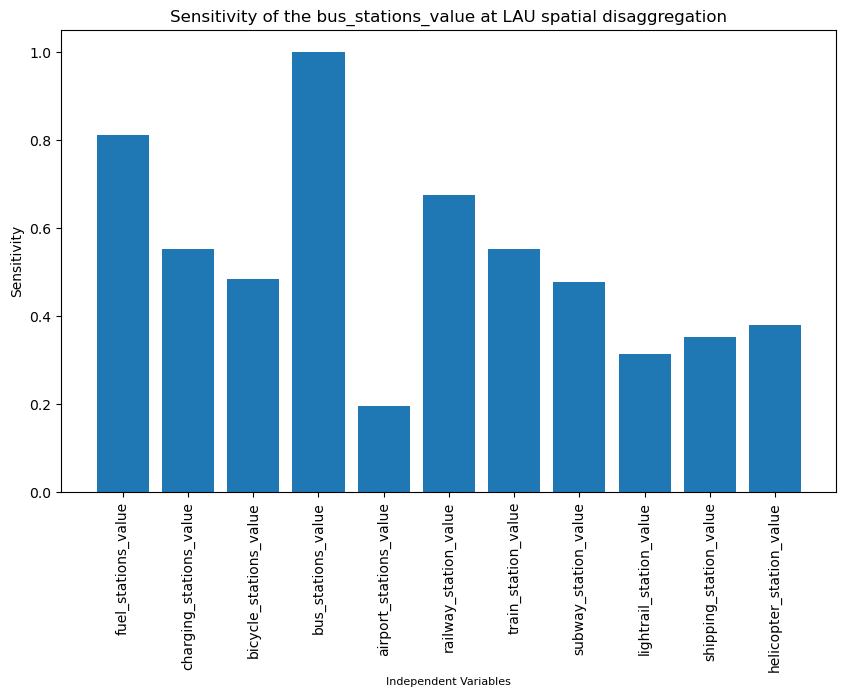

In [65]:
# Load the data
data_stations_LAU_clean = data_stations_LAU.dropna()
X = data_stations_LAU_clean[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
dependent_variable = 'bus_stations_value'
y = data_stations_LAU_clean[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at LAU spatial disaggregation")
plt.show()

##### Stations Data NUTS3

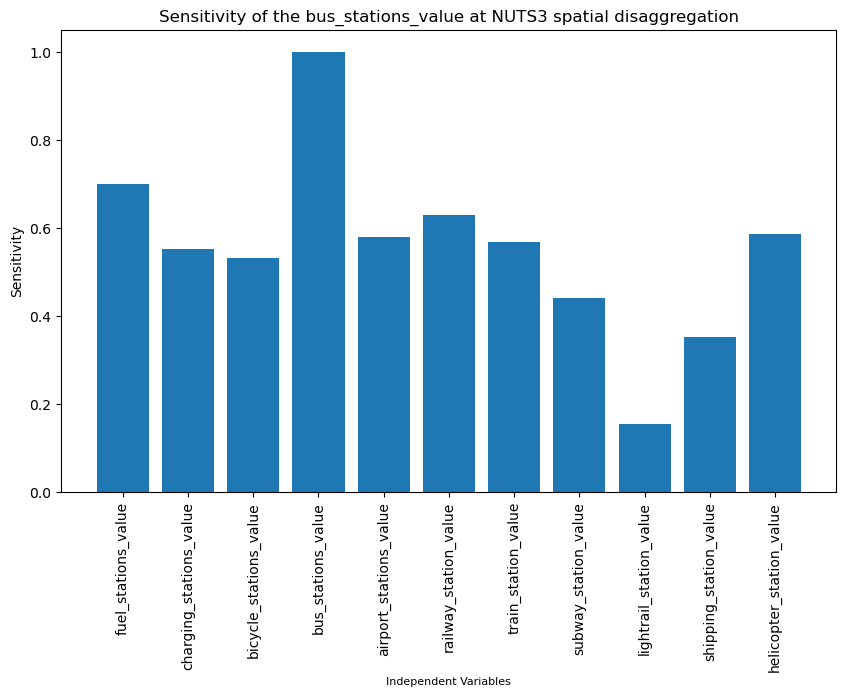

In [66]:
# Load the data
X = data_stations_NUTS3[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
dependent_variable = 'bus_stations_value'
y = data_stations_NUTS3[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Freight traffic Flow data

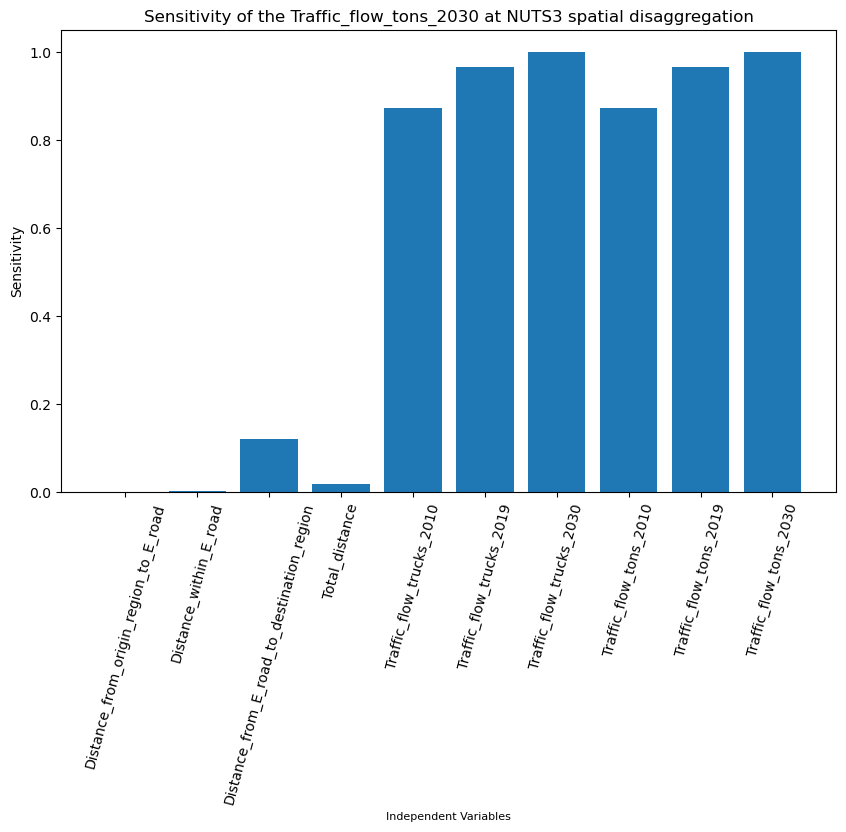

In [67]:
# Load the data
freight_traffic_flow_NUTS3_clean = freight_traffic_flow_NUTS3.dropna()
X = freight_traffic_flow_NUTS3_clean[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']]
dependent_variable = 'Traffic_flow_tons_2030'
y = freight_traffic_flow_NUTS3_clean[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=75) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Vehicle Stock data Germany

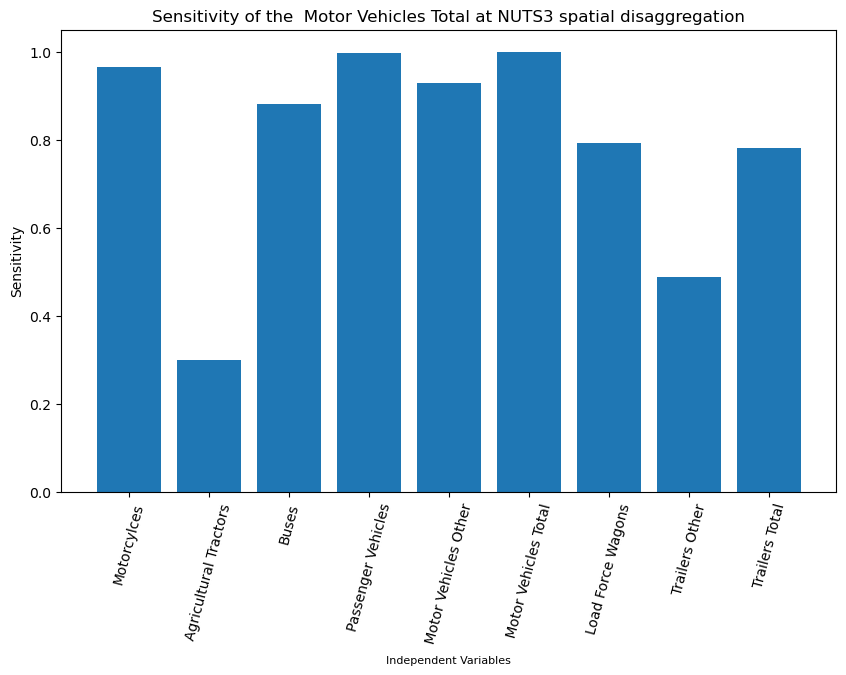

In [68]:
# Load the data
X = vehicle_stock_NUTS3[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']]
dependent_variable = ' Motor Vehicles Total'
y = vehicle_stock_NUTS3[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=75) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Population - GVA - Business nuber data 

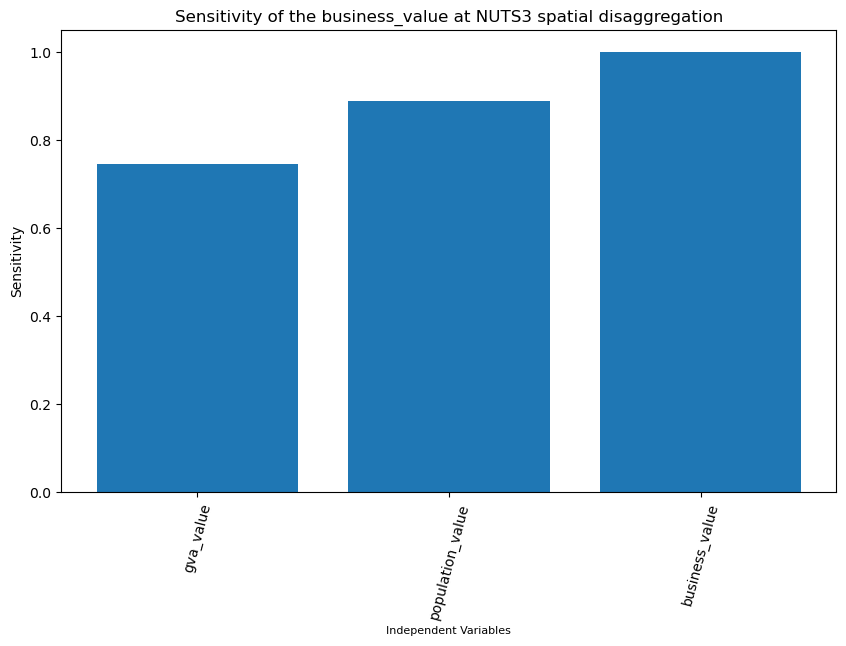

In [69]:
# Load the data
X = train_data_NUTS3[['gva_value', 'population_value', 'business_value']]
dependent_variable = 'business_value'
y = train_data_NUTS3[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(10,6))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.8)
plt.xticks(rotation=75) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Train Data NUTS3

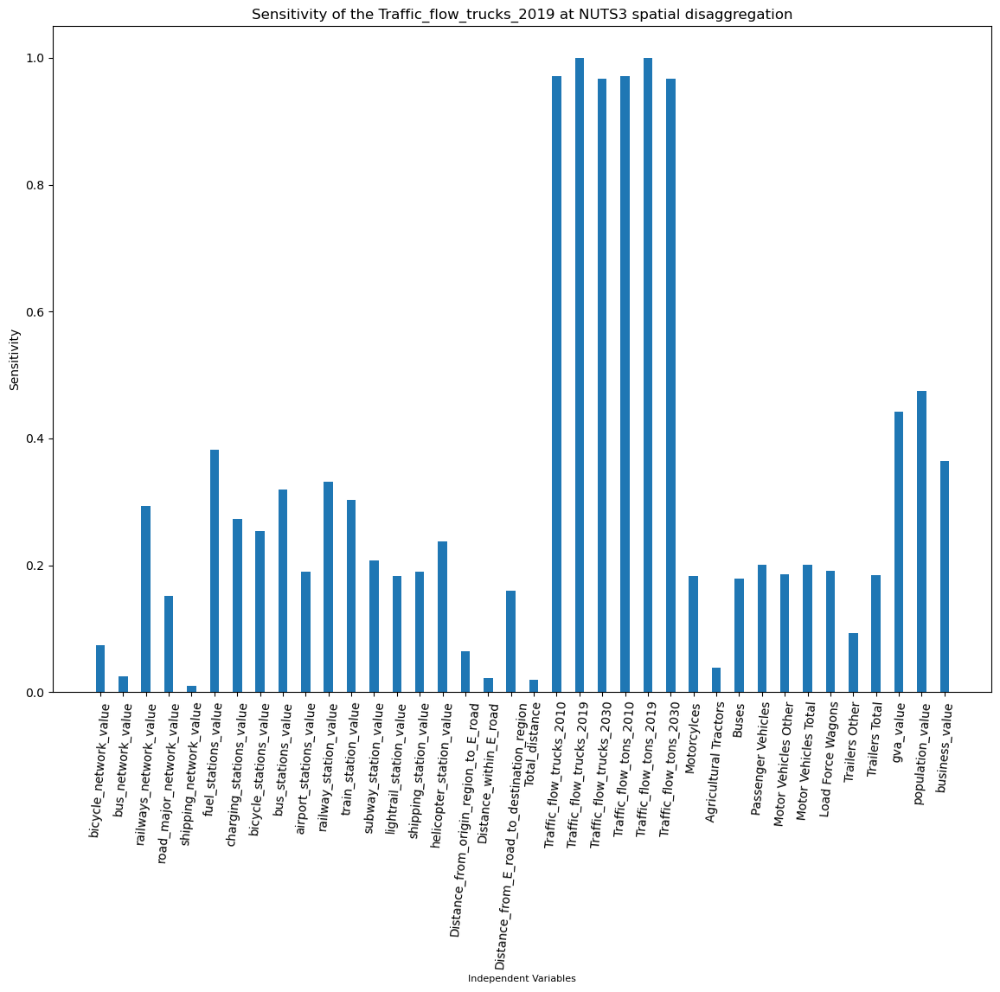

In [70]:
# Load the data
X = train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total','gva_value', 'population_value', 'business_value']]
dependent_variable = 'Traffic_flow_trucks_2019'
y = train_data_NUTS3[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(14,10))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.4)
plt.xticks(rotation=85) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS3 spatial disaggregation")
plt.show()

##### Train Data NUTS0

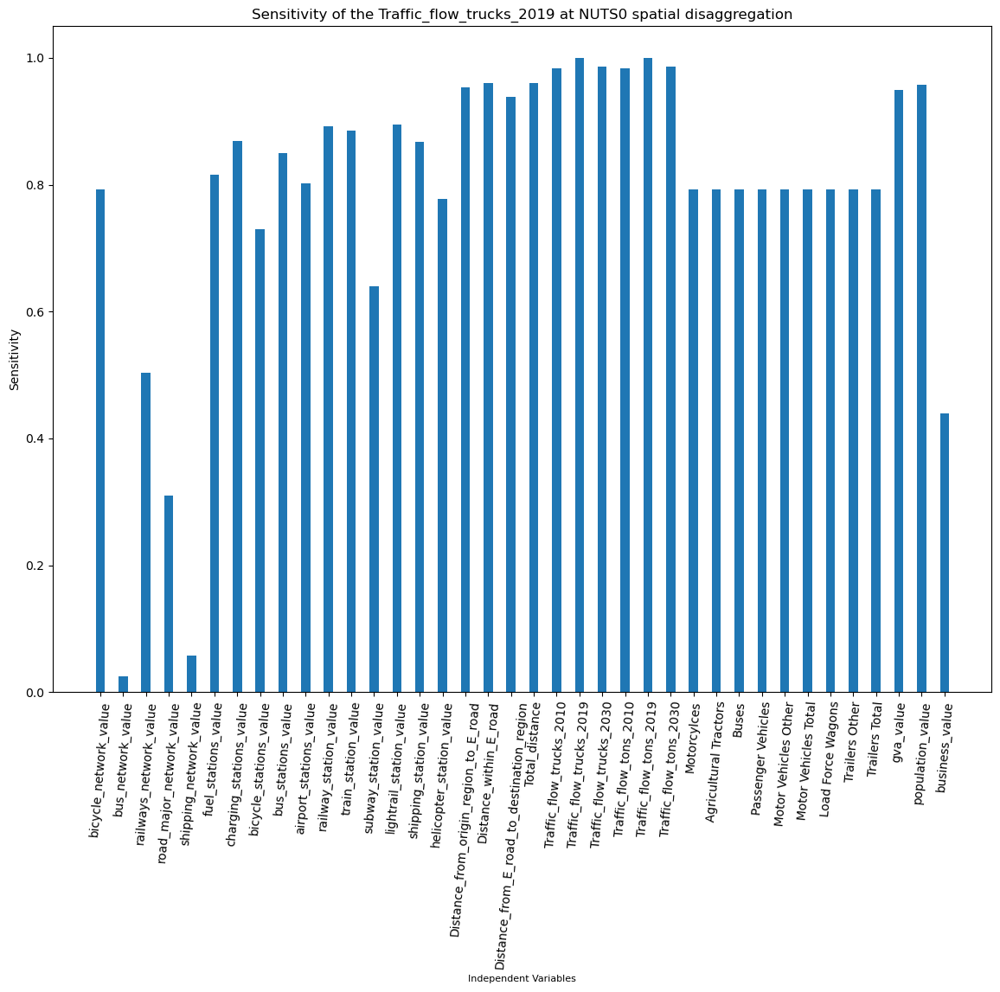

In [71]:
# Load the data
train_data_NUTS0
X = train_data_NUTS0[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 'gva_value', 'population_value', 'business_value']]
dependent_variable = 'Traffic_flow_trucks_2019'
y = train_data_NUTS0[[f'{dependent_variable}']]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Calculate sensitivity
correlation = np.corrcoef(X_train.T, y_train.T)
sensitivity = np.abs(correlation[:-1,-1])

# Plot the sensitivity
fig = plt.figure(figsize=(14,10))  # Adjust the size of the figure
plt.bar(X_train.columns, sensitivity,  width=0.4)
plt.xticks(rotation=85) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Independent Variables", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity of the {dependent_variable} at NUTS0 spatial disaggregation")
plt.show()

#### Whisker plot DE level

In [72]:
nan_values = pd.isna(train_data_NUTS3[['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code', 'bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 'gva_value', 'population_value', 'business_value']]).sum()
nan_values

EU_region_code                                1
NUTS0_region_code                             1
NUTS1_region_code                             1
NUTS2_region_code                             1
NUTS3_region_code                             0
bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
fuel_stations_value                           0
charging_stations_value                       0
bicycle_stations_value                        0
bus_stations_value                            0
airport_stations_value                        0
railway_station_value                         0
train_station_value                           0
subway_station_value                          0
lightrail_station_value                       0
shipping_station_value                        0
helicopter_station_value                

In [73]:
train_data_NUTS3[train_data_NUTS3.isna().any(axis=1)]

,EU_region_code,NUTS0_region_code,NUTS1_region_code,NUTS2_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,...,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total,gva_value,population_value,business_value
96,NaN,NaN,NaN,NaN,ELZZZ,0.0,0.0,0.0,0.0,0.0,...,969.581218,121933.502538,27911.436548,149844.939086,8550.85533,12176.989848,20727.845178,10618.821685,383021.212987,21883.935931


In [74]:
train_data_NUTS3['NUTS0_region_code'].fillna('EL',inplace=True)

In [75]:
train_data_NUTS3_DE = train_data_NUTS3[train_data_NUTS3["NUTS0_region_code"].str.contains("DE")]
train_data_NUTS0_DE = train_data_NUTS0[train_data_NUTS0["NUTS0_region_code"].str.contains("DE")]

In [76]:
train_data_NUTS3_DE[train_data_NUTS3_DE.isna().any(axis=1)]

,EU_region_code,NUTS0_region_code,NUTS1_region_code,NUTS2_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,...,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total,gva_value,population_value,business_value


In [77]:
train_data_NUTS0_DE[train_data_NUTS0_DE.isna().any(axis=1)]

,EU_region_code,NUTS0_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,fuel_stations_value,charging_stations_value,bicycle_stations_value,...,Buses,Passenger Vehicles,Motor Vehicles Other,Motor Vehicles Total,Load Force Wagons,Trailers Other,Trailers Total,gva_value,population_value,business_value


##### Network data LAU

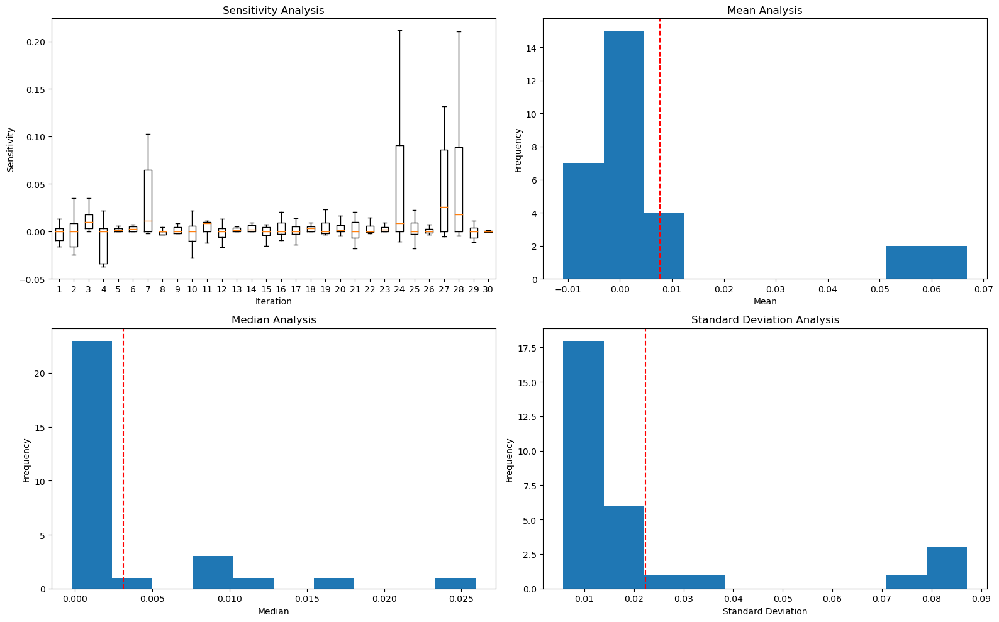

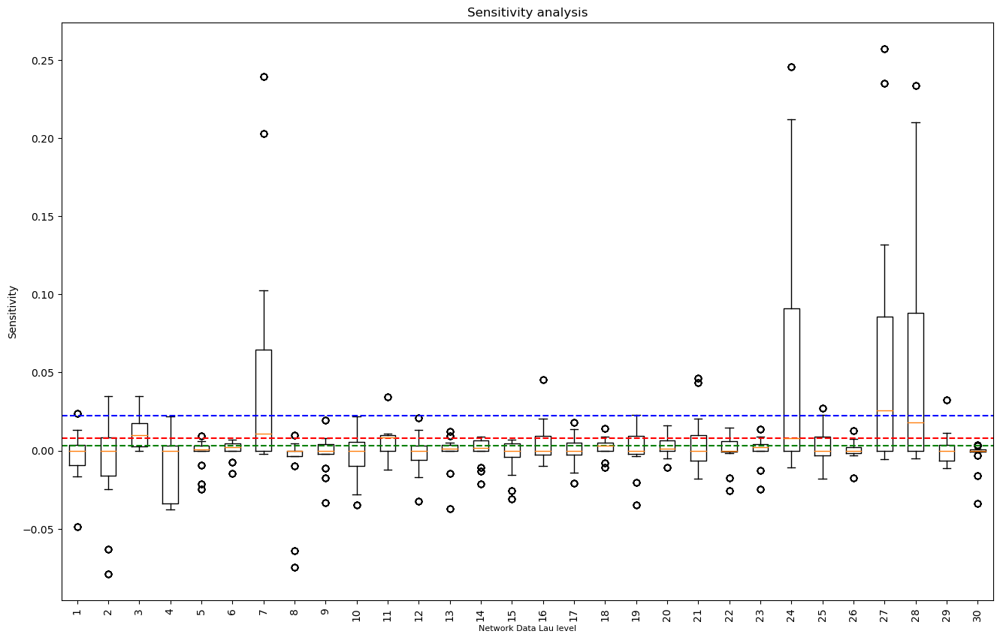

In [78]:
# Load the data
data_network_LAU_clean = data_network_LAU.dropna()
data_network_LAU_DE = data_network_LAU_clean[data_network_LAU_clean["NUTS0_region_code"].str.contains("DE")]
X = data_network_LAU_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
# dependent_variable = 'road_major_network_value'
y = data_network_LAU_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=33)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation # np. substract element by element ##################
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Network Data Lau level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Network data NUTS3

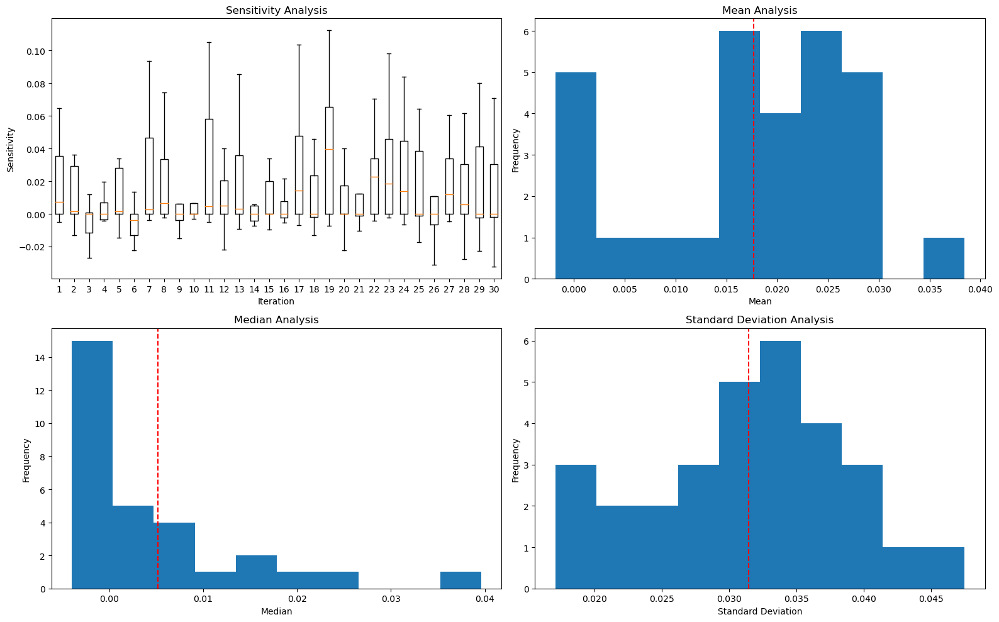

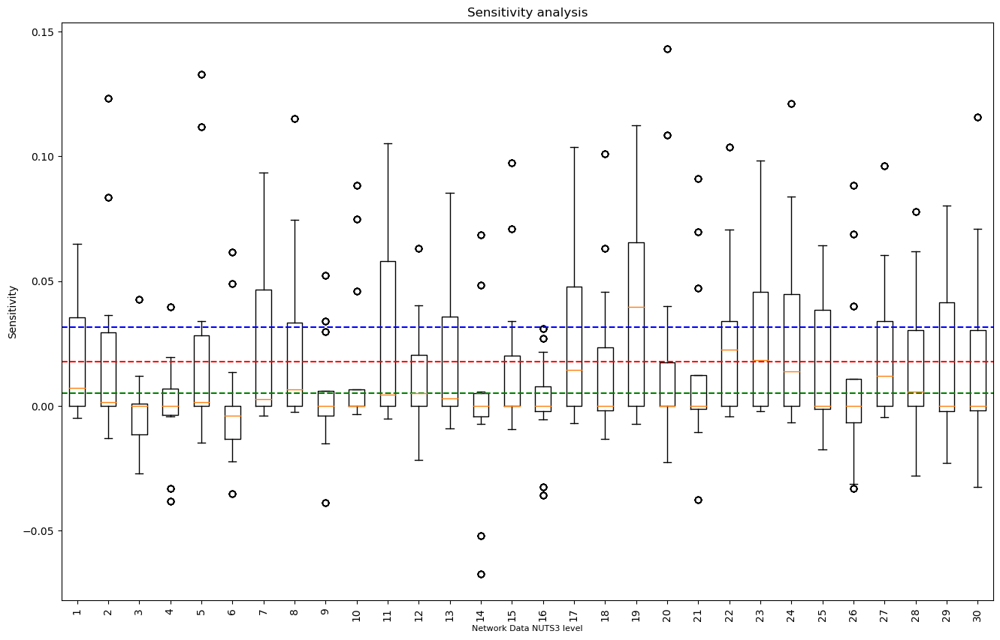

In [79]:
# load the data
X = train_data_NUTS3_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
y = train_data_NUTS3_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=109)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Network Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Stations Data LAU

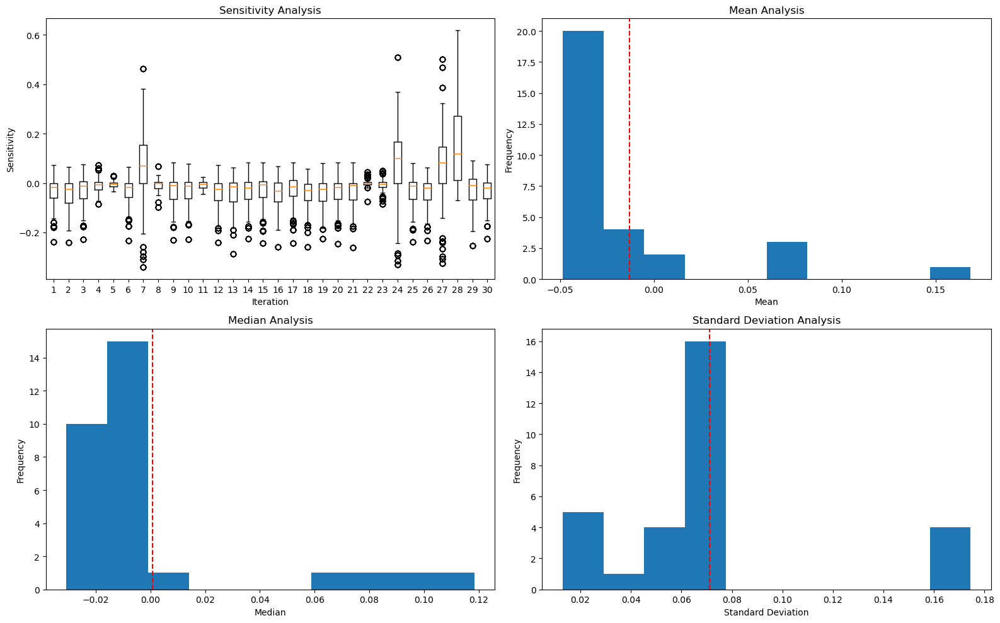

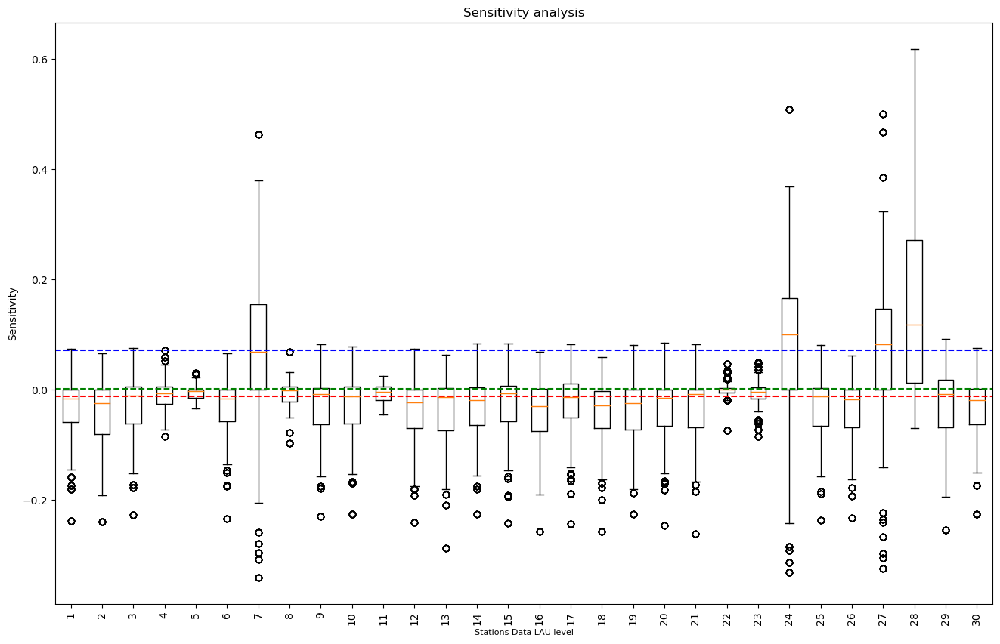

In [80]:
# Load the data
data_network_LAU_clean = data_stations_LAU.dropna()
data_stations_LAU_DE = data_network_LAU_clean[data_network_LAU_clean["NUTS0_region_code"].str.contains("DE")]
X = data_stations_LAU_DE[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
y = data_stations_LAU_DE[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=110)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Stations Data LAU level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Stations Data NUTS3

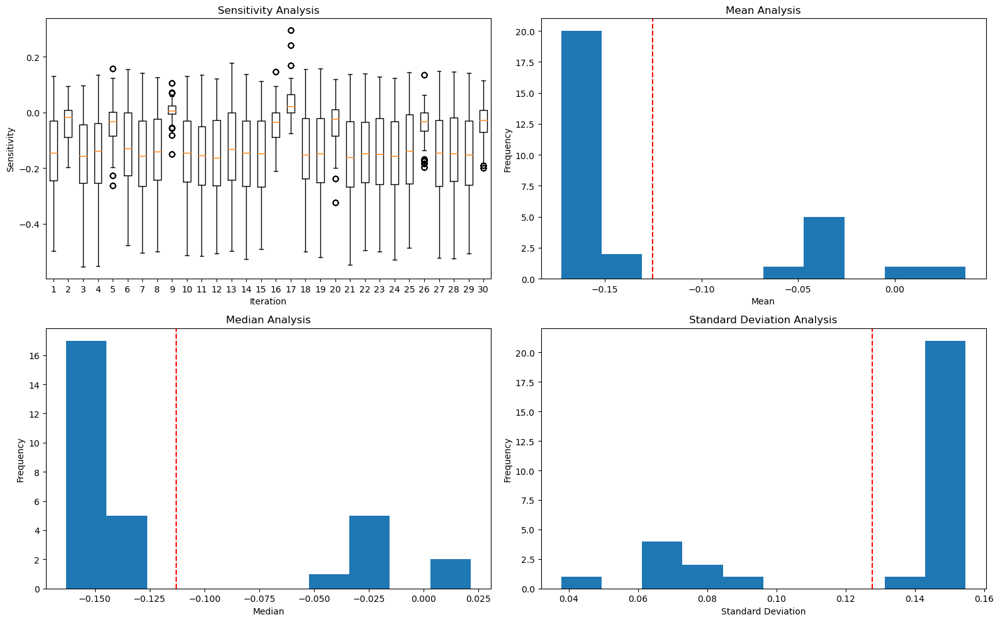

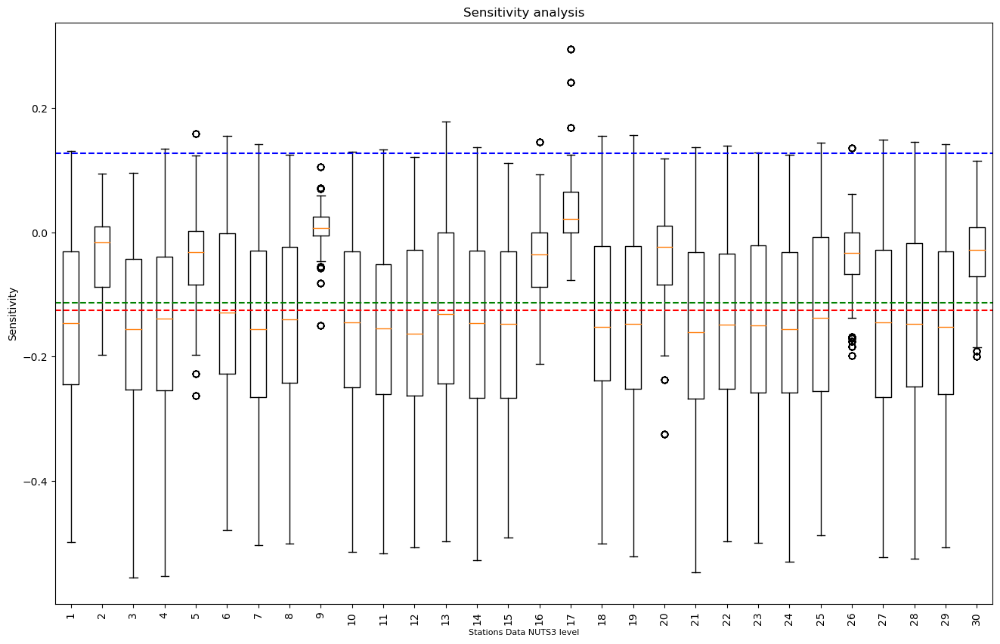

In [81]:
# Load the data
X = train_data_NUTS3_DE[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
y = train_data_NUTS3_DE[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=111)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Stations Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Freight traffic Flow data NUTS3

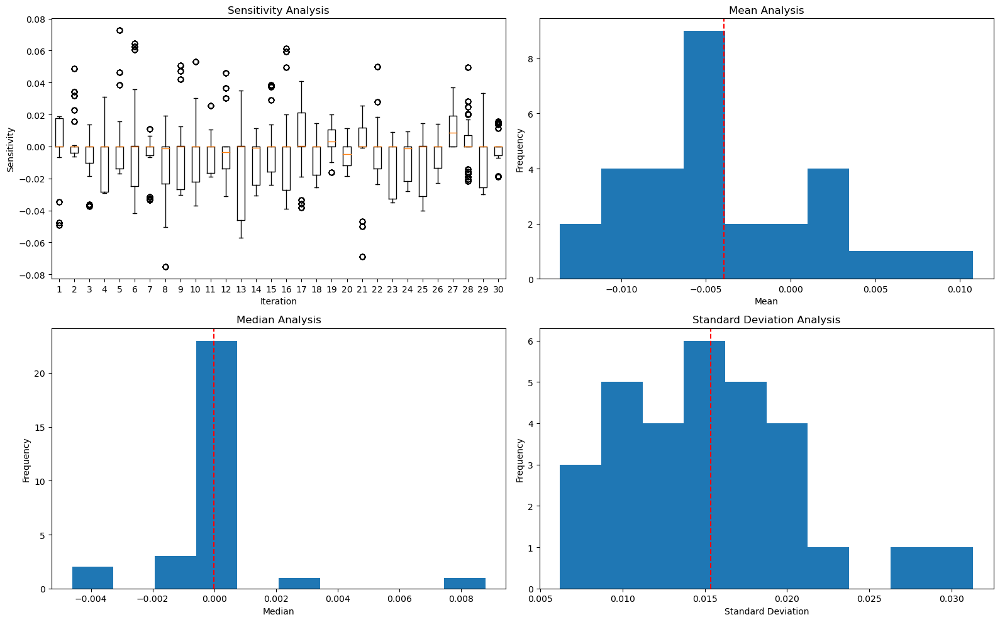

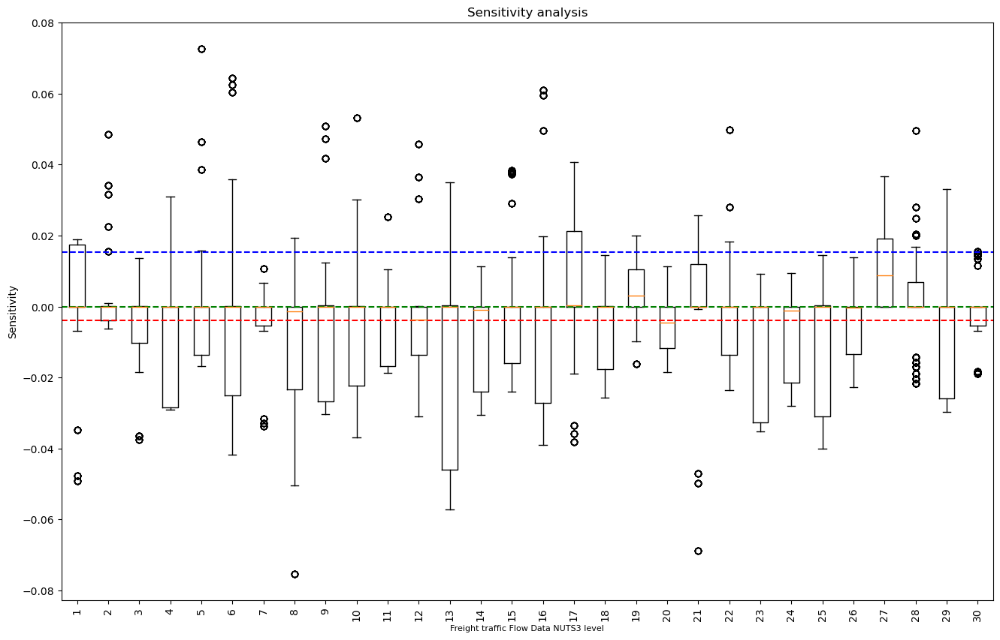

In [82]:
# Load the data
X = train_data_NUTS3_DE[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']]
y = train_data_NUTS3_DE[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=112)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Freight traffic Flow Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Vehicle Stock data Germany

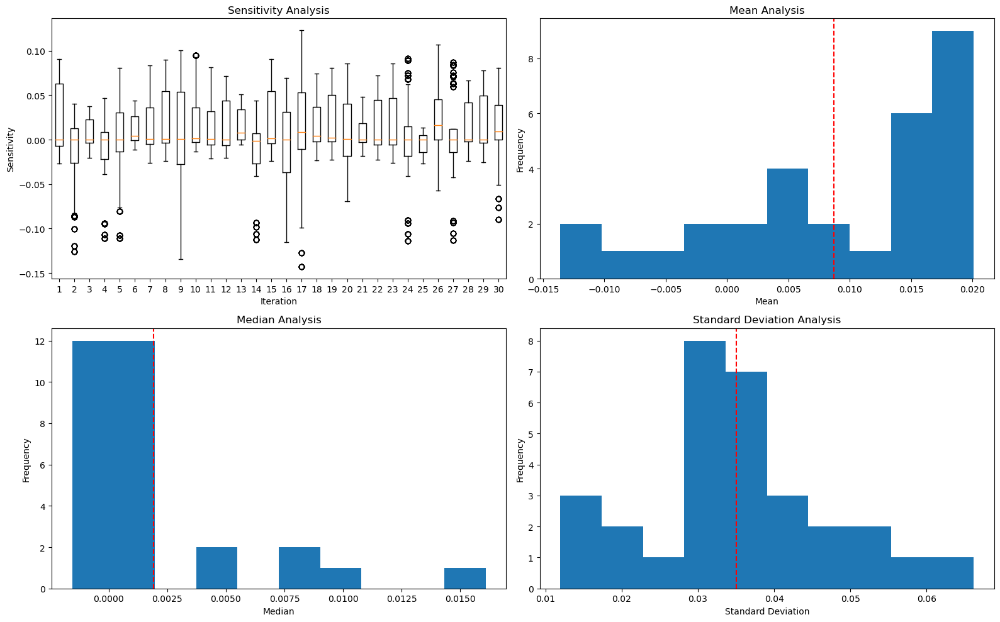

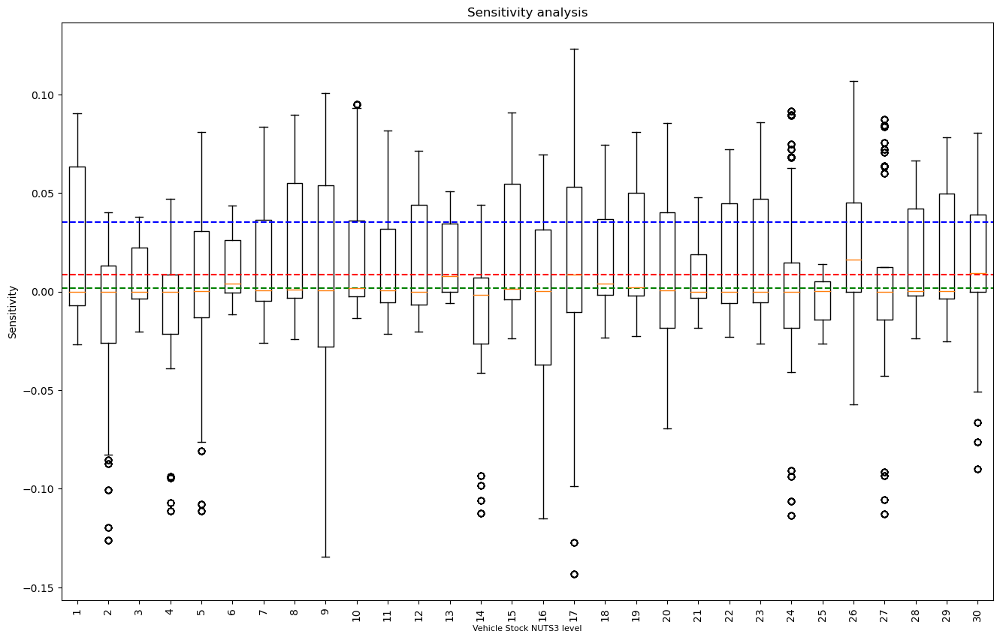

In [83]:
# Load the data
X = train_data_NUTS3_DE[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']]
y = train_data_NUTS3_DE[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=113)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Vehicle Stock NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### GVA 

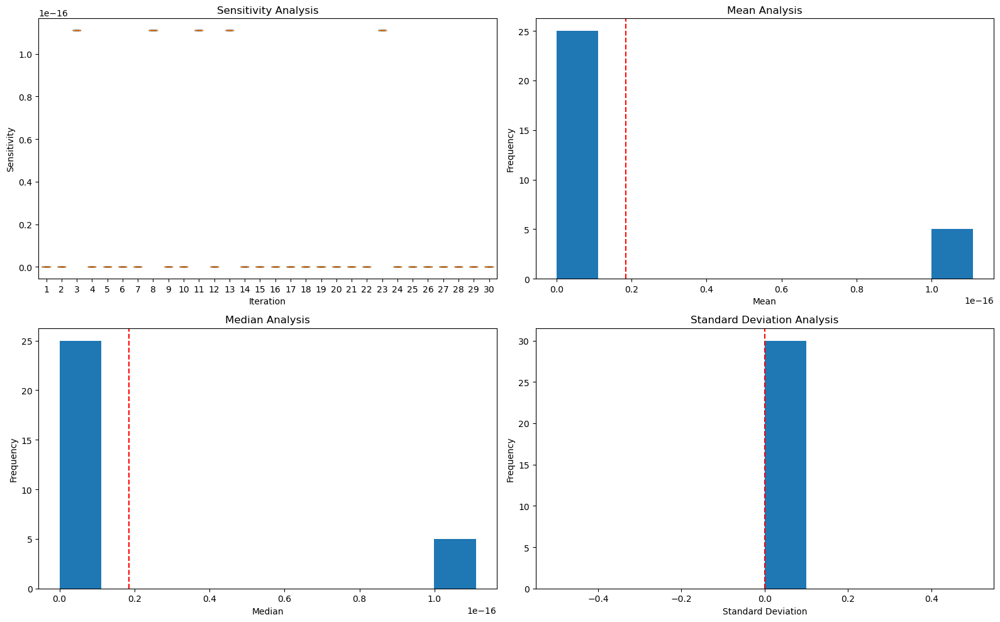

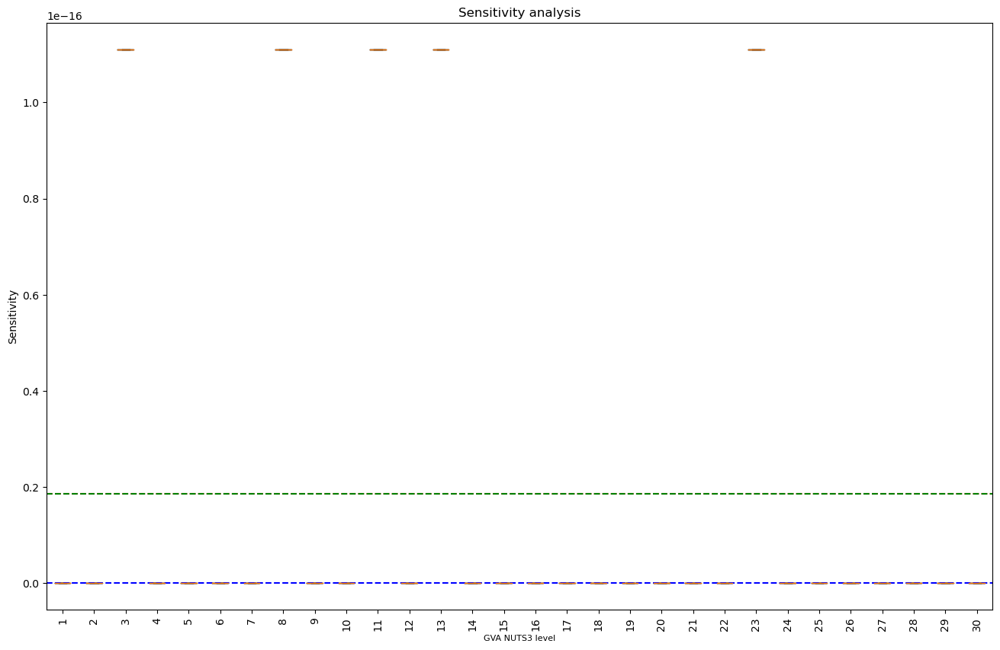

In [84]:
# Load the data
X = train_data_NUTS3_DE[['gva_value', 
                        #  'population_value', 
                     #     'business_value'
                         ]]
y = train_data_NUTS3_DE[['gva_value', 
                        #  'population_value', 
                     #     'business_value'
                         ]]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=114)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("GVA NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Population

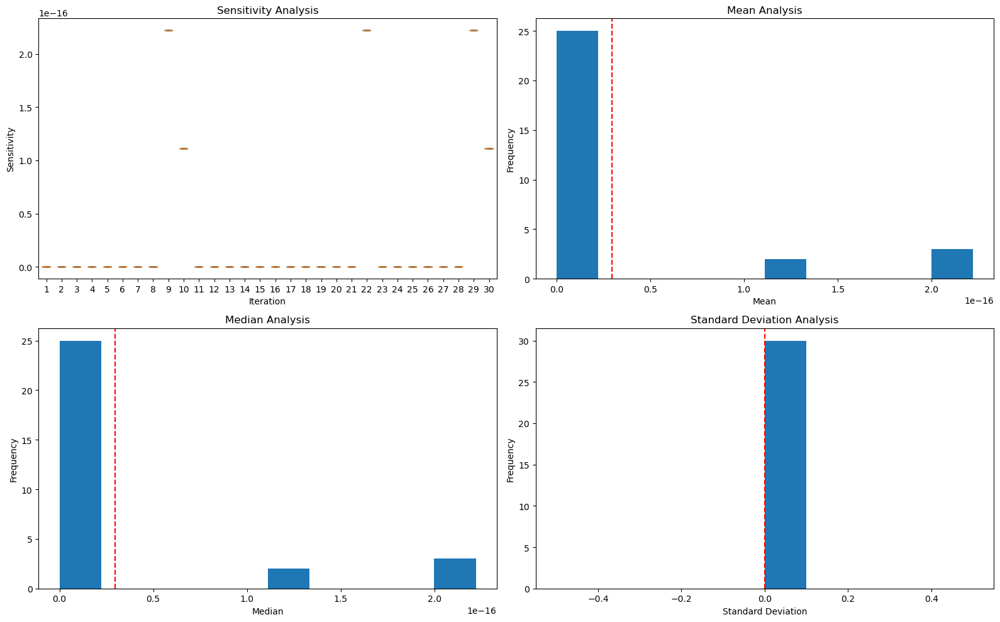

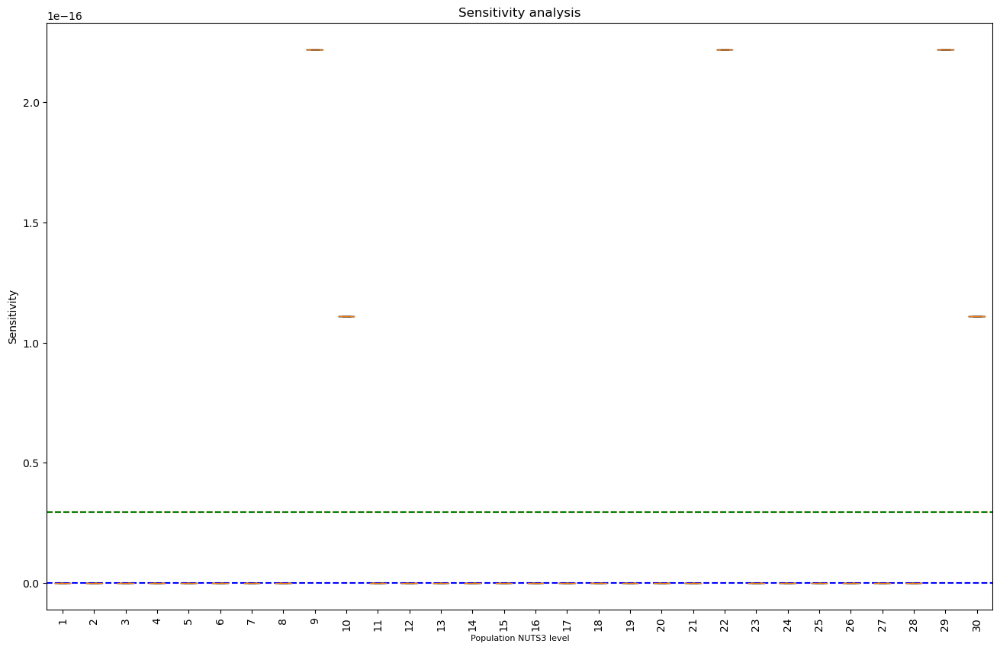

In [85]:
# Load the data
X = train_data_NUTS3_DE[[
# 'gva_value', 
'population_value', 
#     'business_value'
]]
y = train_data_NUTS3_DE[[
# 'gva_value', 
'population_value', 
#     'business_value'
]]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=115)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("Population NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### GVA and population 

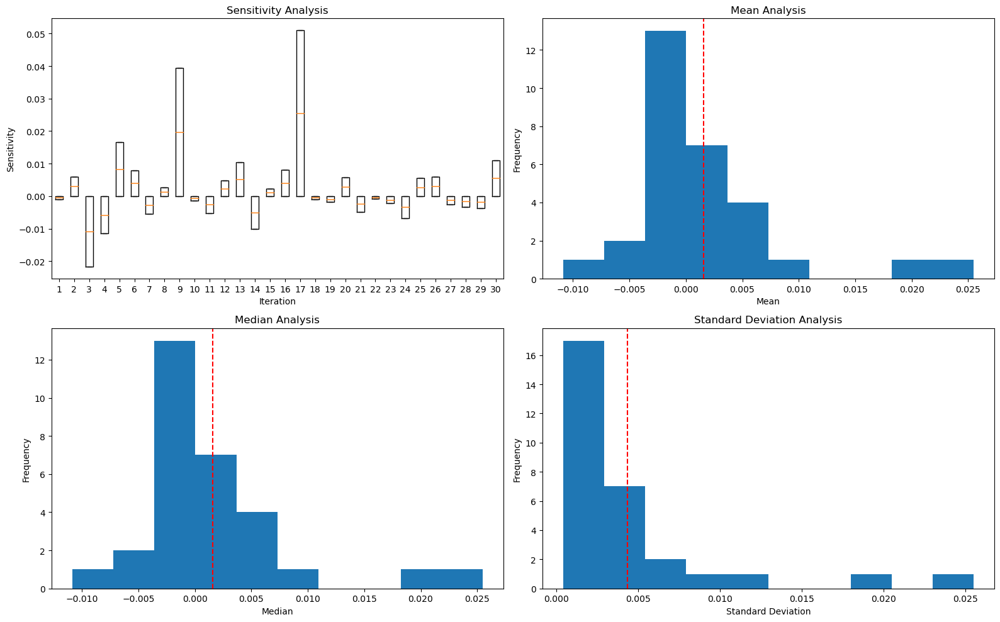

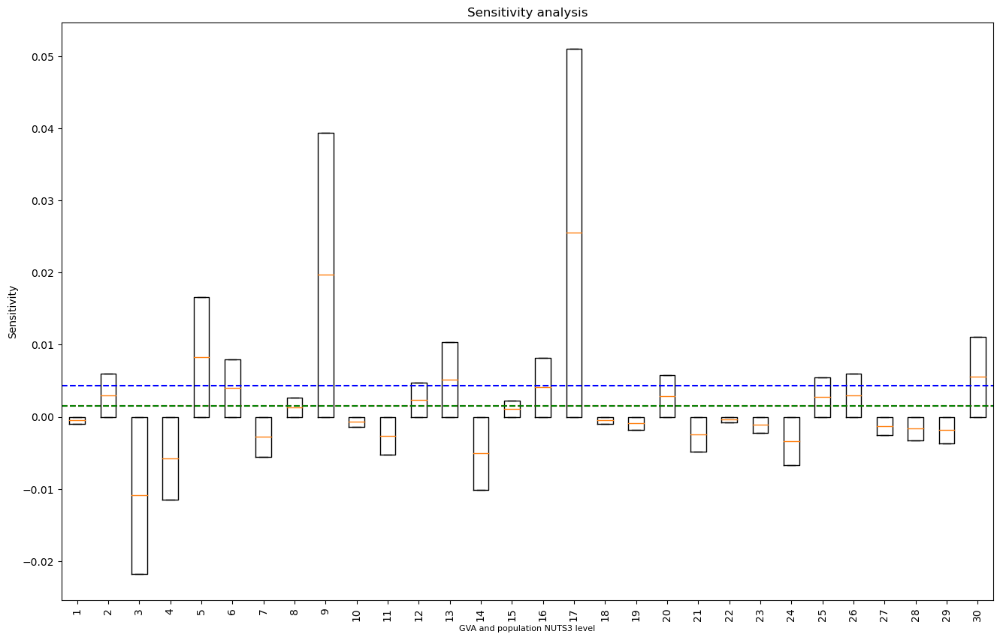

In [86]:
# Load the data
X = train_data_NUTS3_DE[[
'gva_value', 
'population_value', 
#     'business_value'
]]
y = train_data_NUTS3_DE[[
'gva_value', 
'population_value', 
#     'business_value'
]]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=117)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=True)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("GVA and population NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Train Data NUTS3

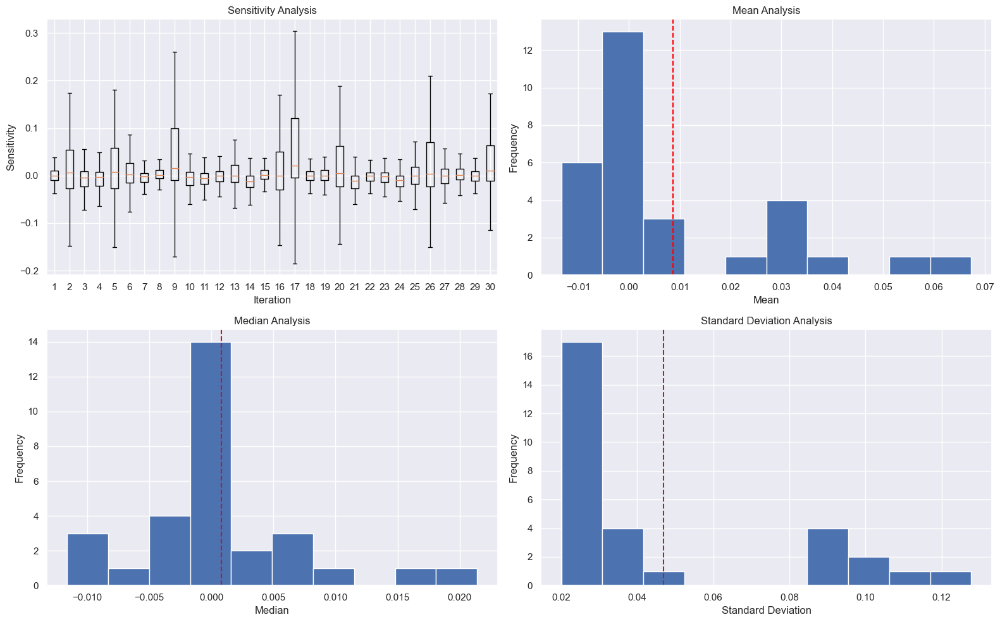

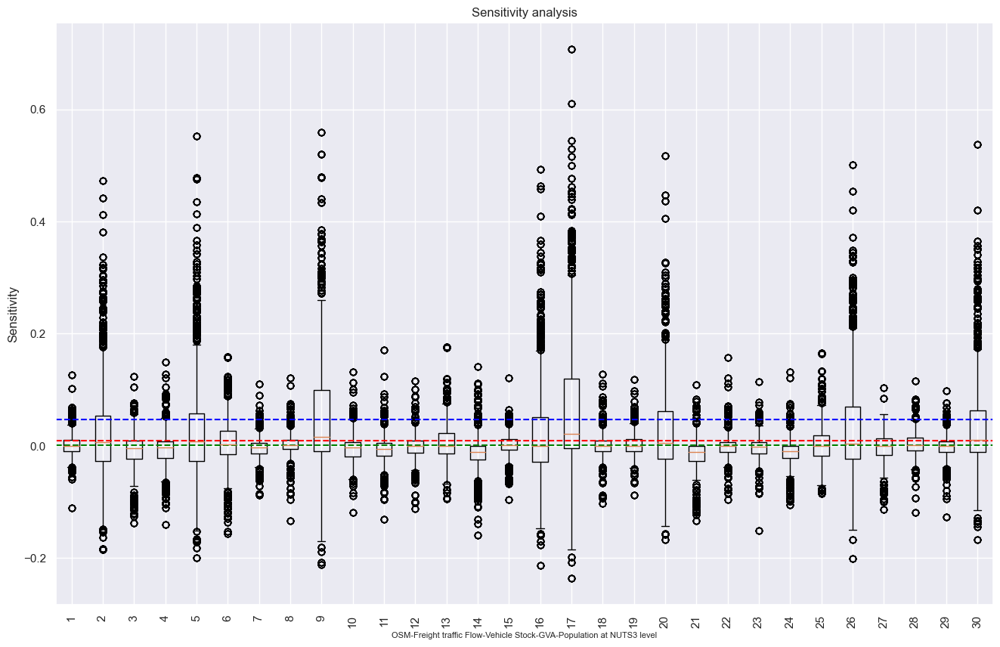

In [373]:
# Load the data
X = train_data_NUTS3_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total',        
       'Trailers Total', 
       'gva_value', 
       'population_value', 
       # 'business_value'
       ]]
y = train_data_NUTS3_DE[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 
       'gva_value', 
       'population_value', 
       # 'business_value'
       ]]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=117)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list) 
       
# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("OSM-Freight traffic Flow-Vehicle Stock-GVA-Population at NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

#### Whisker plot EU level

##### Network data LAU

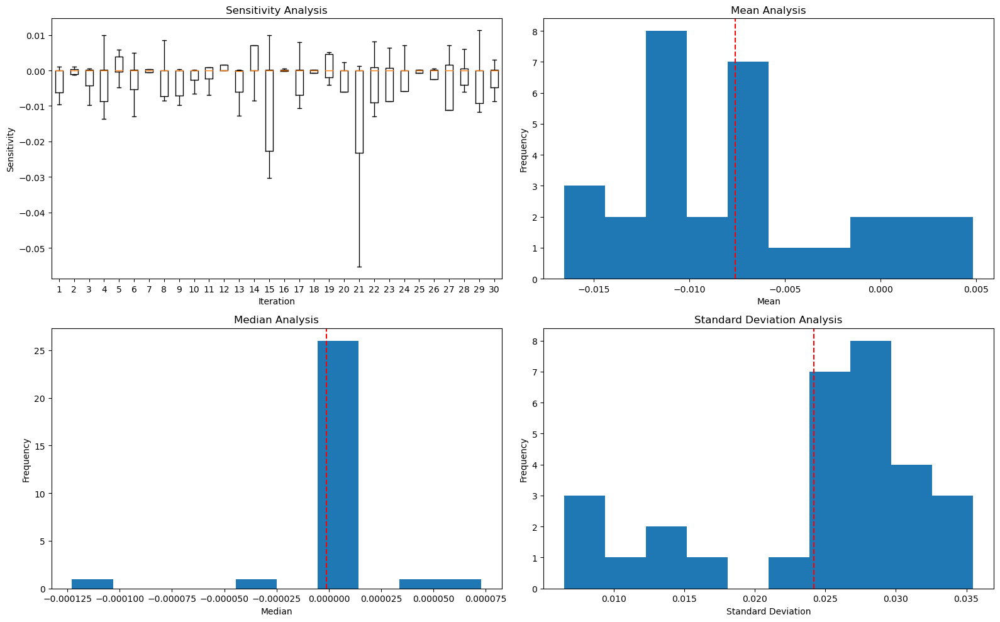

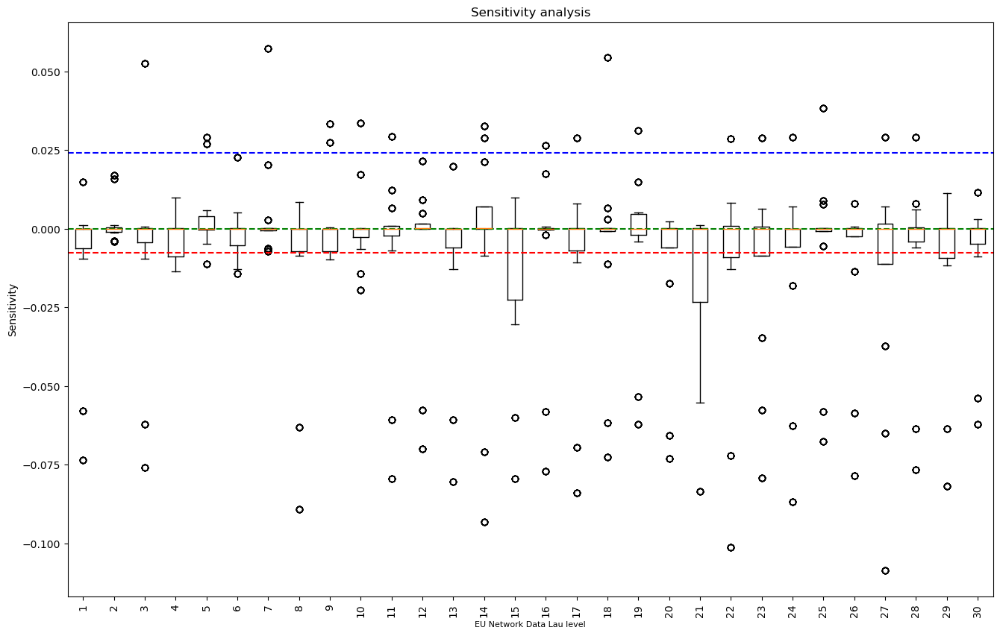

In [88]:
# Load the data
X = data_network_LAU[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
# dependent_variable = 'road_major_network_value'
y = data_network_LAU[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=118)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation # np. substract element by element ##################
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Network Data Lau level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Network dadta NUTS3

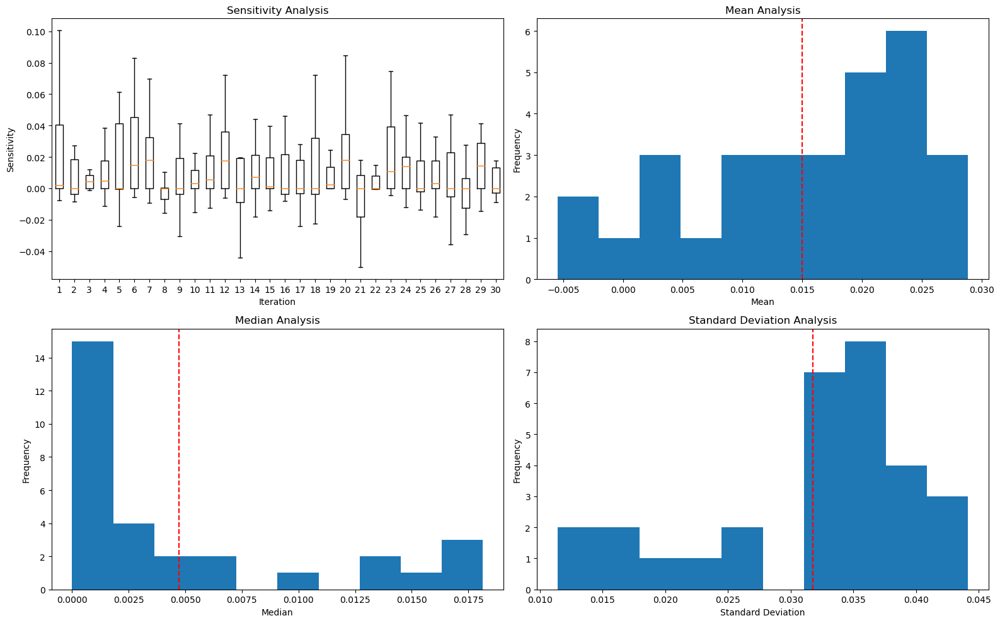

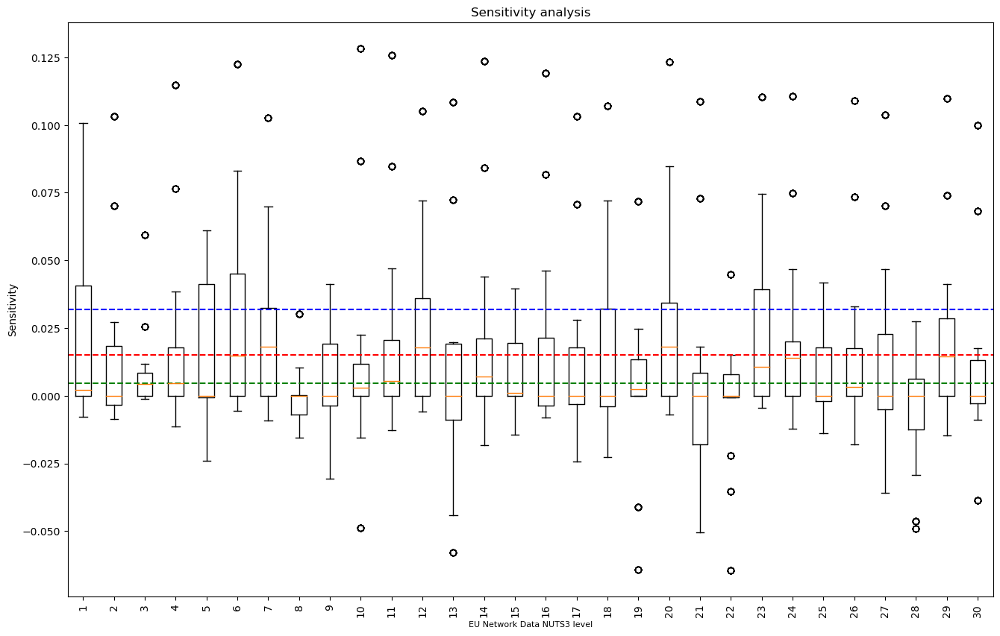

In [89]:
X = train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]
# dependent_variable = 'road_major_network_value'
y = train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=119)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Network Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Stations Data LAU

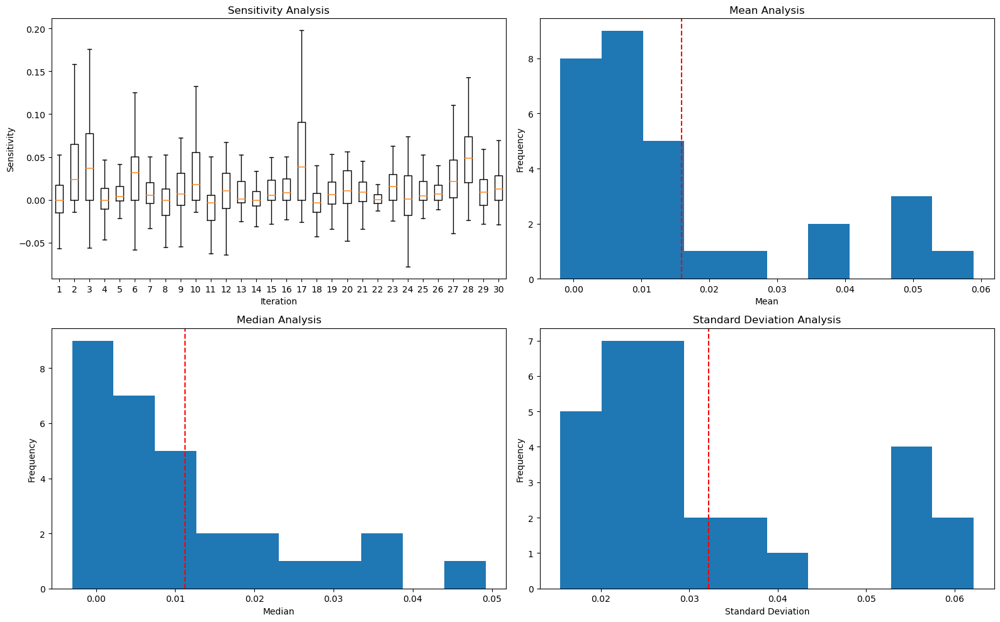

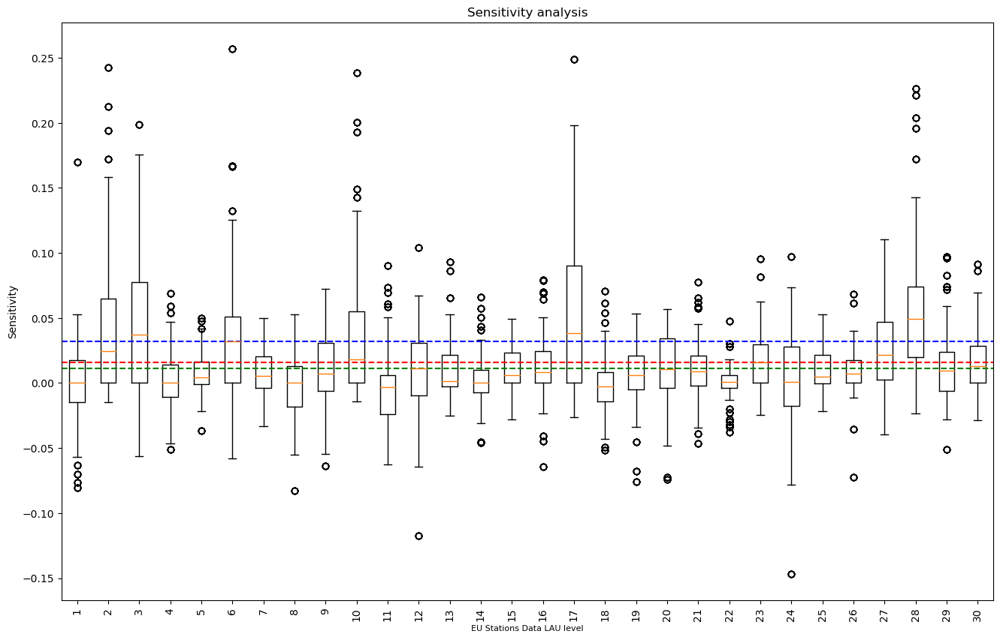

In [90]:
# Load the data
data_stations_LAU_clean = data_stations_LAU.dropna()
X = data_stations_LAU_clean[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
y = data_stations_LAU_clean[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=120)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Stations Data LAU level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Stations Data NUTS3

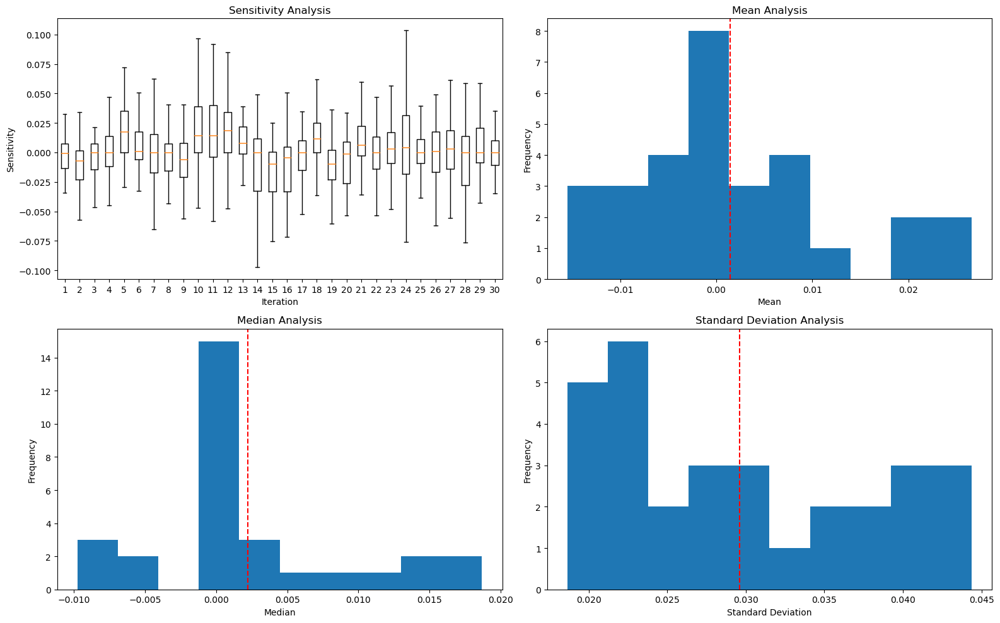

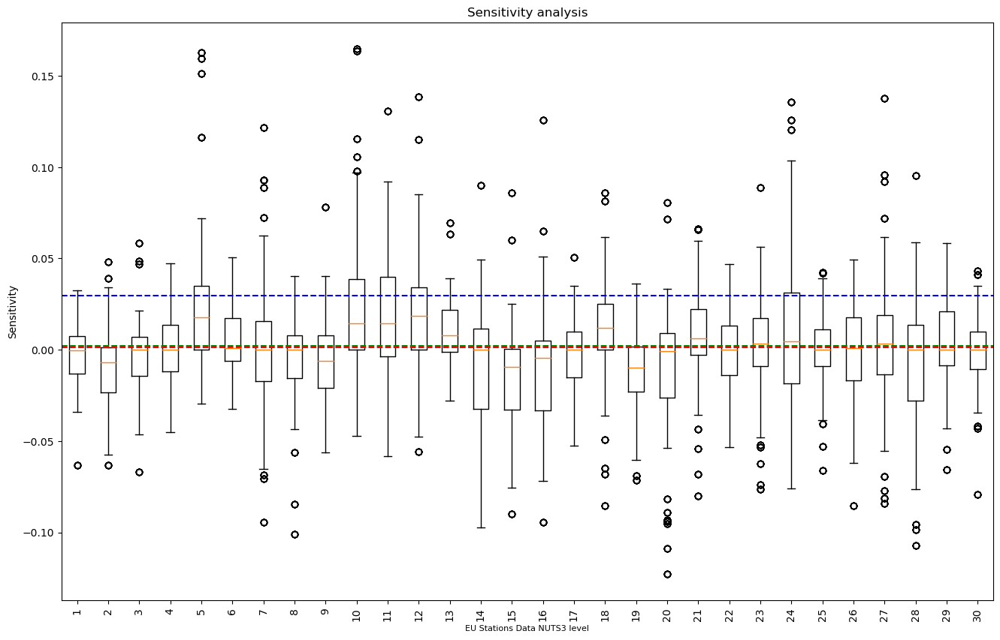

In [91]:
# Load the data
X = train_data_NUTS3[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]
y = train_data_NUTS3[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=121)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Stations Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Freight traffic Flow data NUTS3

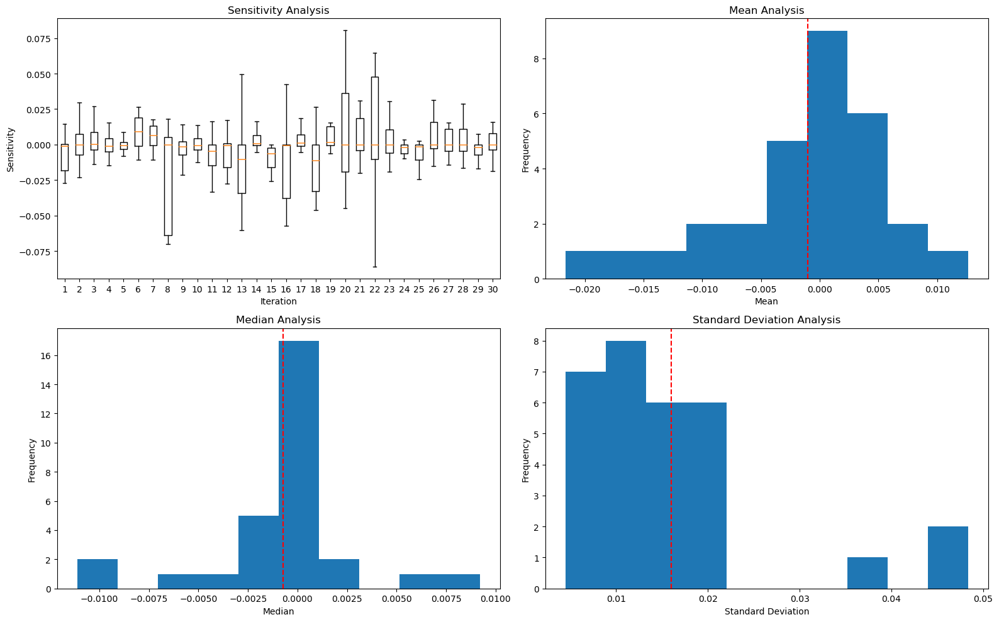

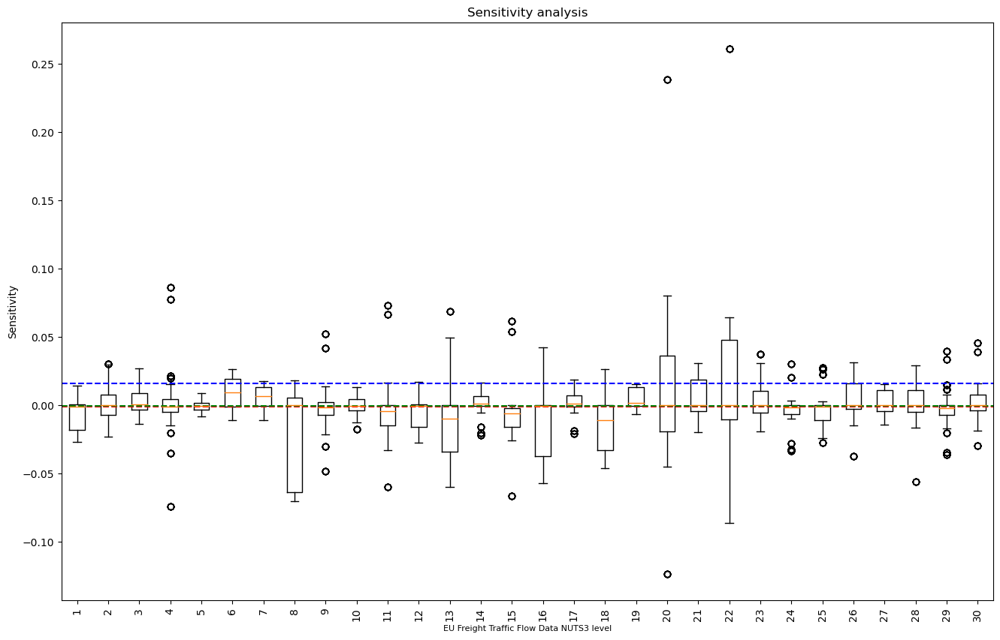

In [92]:
# Load the data
X = train_data_NUTS3[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']]
y = train_data_NUTS3[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=122)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Freight Traffic Flow Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Vehicle Stock data Germany

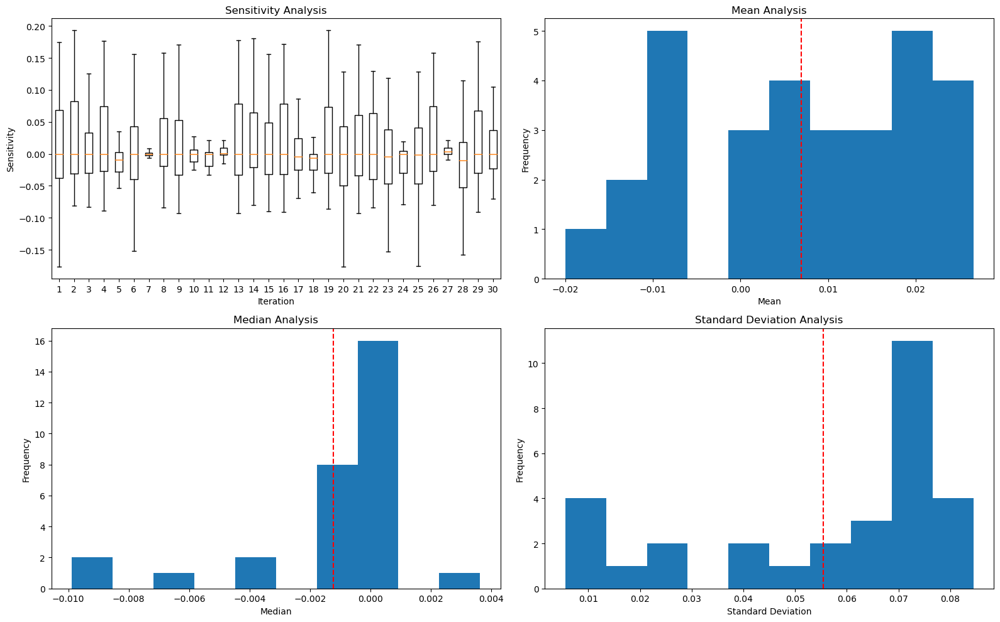

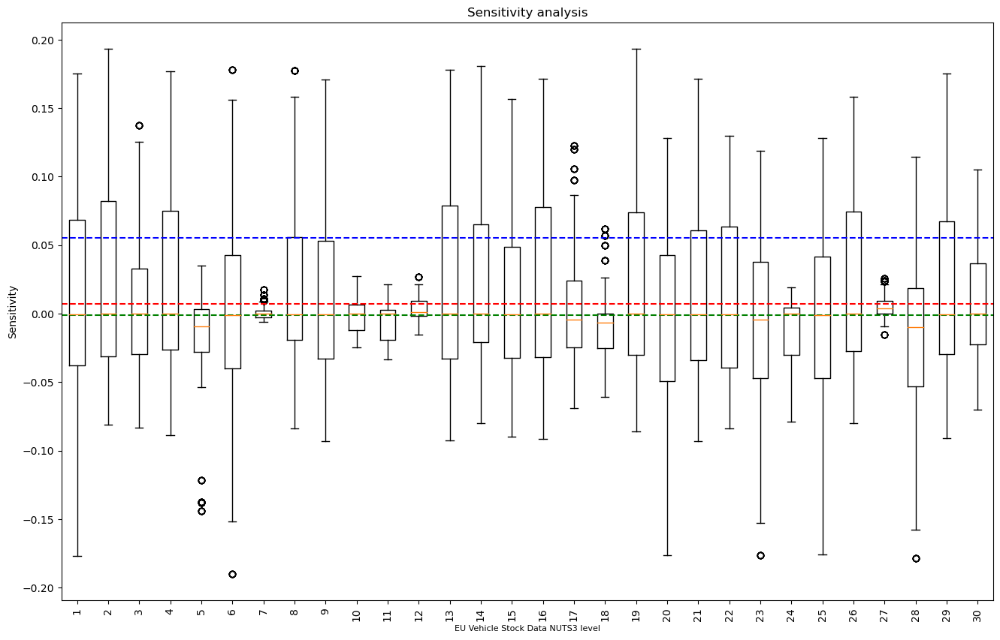

In [93]:
# Load the data
X = train_data_NUTS3[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']]
y = train_data_NUTS3[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=123)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU Vehicle Stock Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Population - GVA - Business nuber data 

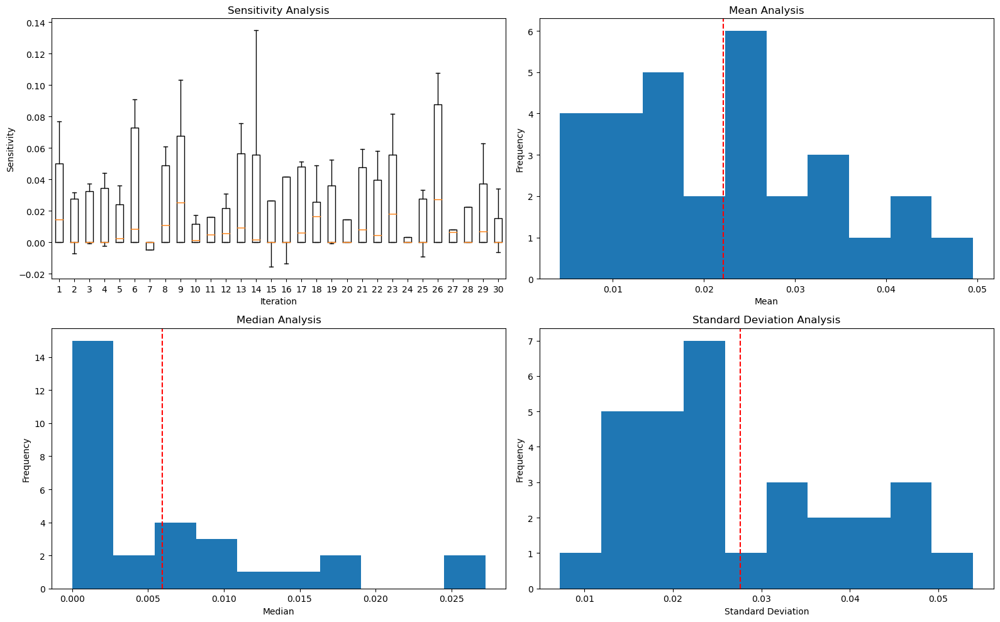

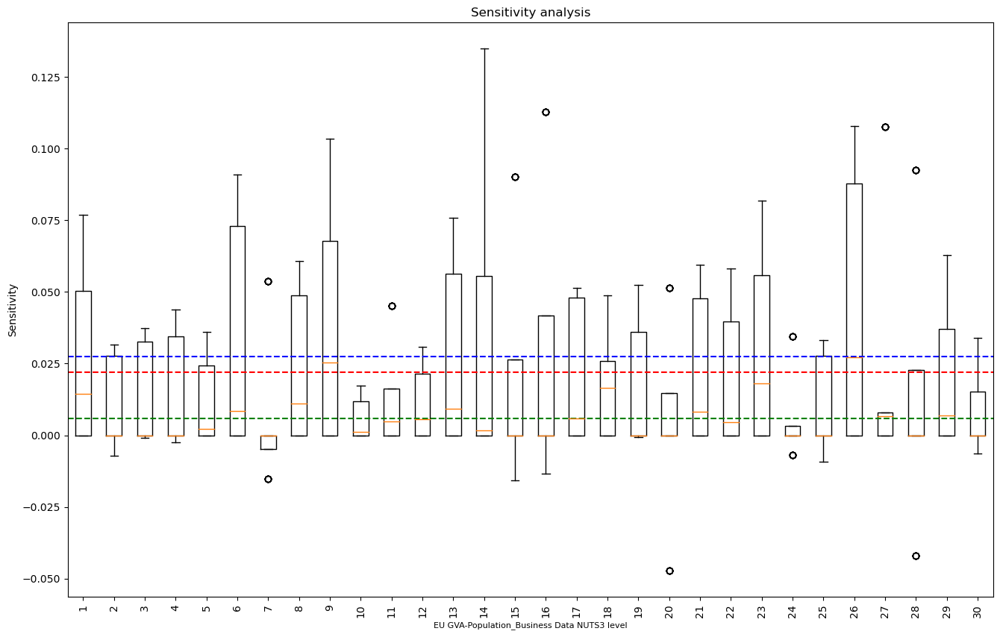

In [94]:
# Load the data
X = train_data_NUTS3[['gva_value', 'population_value', 'business_value']]
y = train_data_NUTS3[['gva_value', 'population_value', 'business_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=124)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU GVA-Population_Business Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

##### Train Data NUTS3

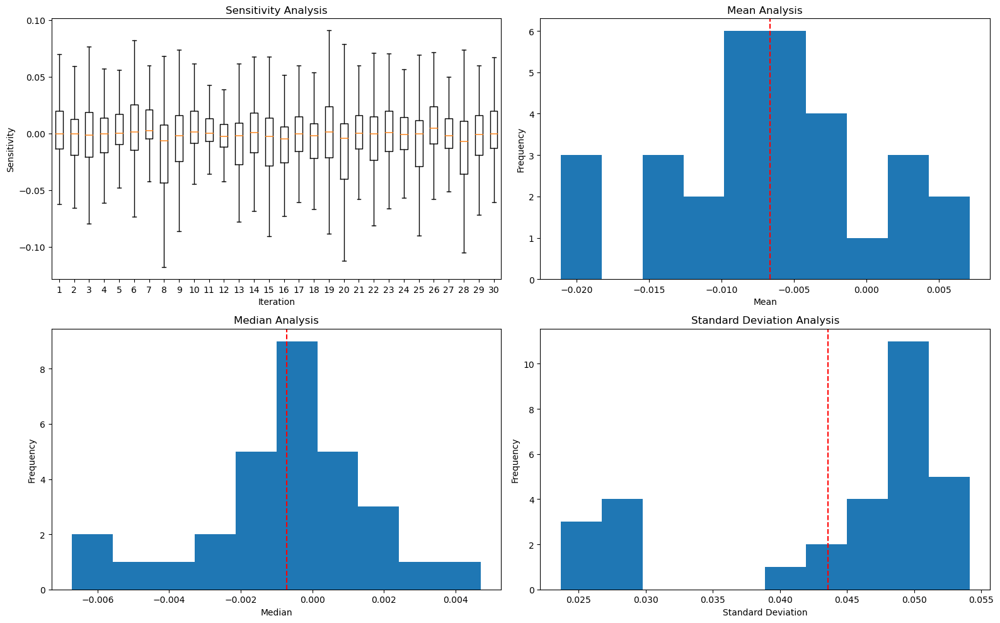

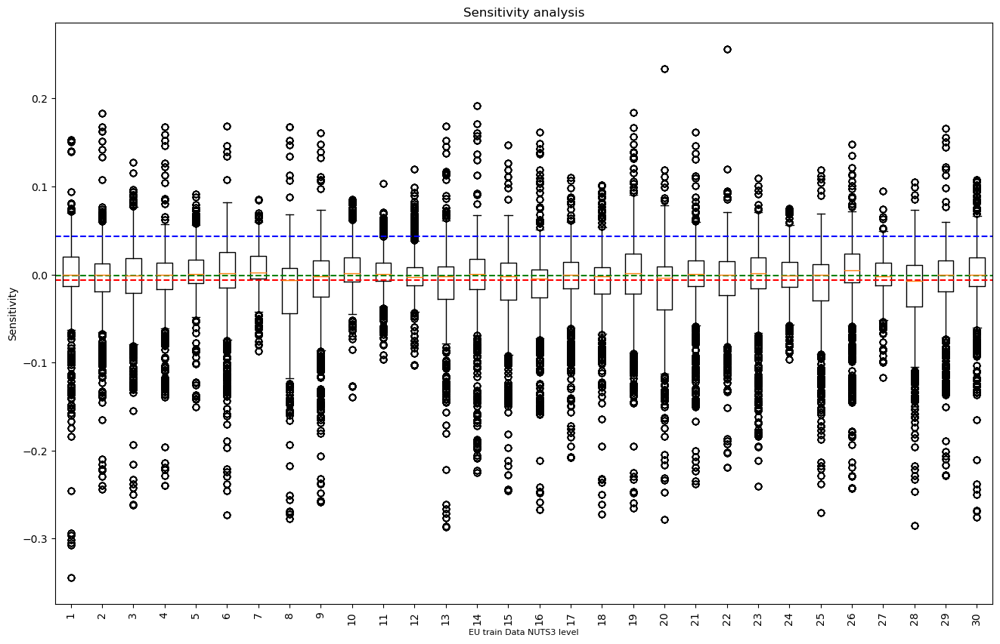

In [95]:
# Load the data
X = train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 'gva_value', 'population_value', 'business_value']]
y = train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 'gva_value', 'population_value', 'business_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=125)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(30):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU train Data NUTS3 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

#  we will see how the correlation of the data is falling, if the variartion is too high, the EU model will fail. 
#  Look at the similiraty in the NUTS3 level correlations. We can do it for different features. How can succesfull a single model could be? Single way to test. 
#  There is no way that a single model will not work for all counrties. There will be an upper accuraccy limit. It depends on the difussion. 
#  The model should be very complex, and we can not accomplish that because we only have very few examples. 
#  It looks like to have a few simple models to have higher accuraccy for a cluster of countries. 
#  Find similarities with the sensitive analysis and the not accurate simple model results. 
#  Cluster the countries itself.  

##### Train Data NUTS0

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\numpy\lib\function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\numpy\lib\function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


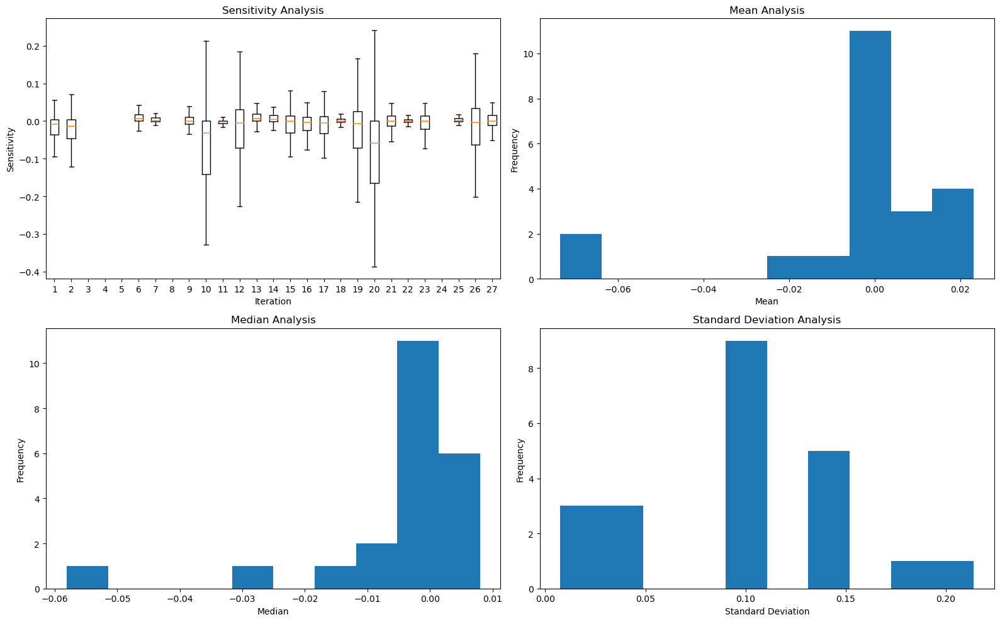

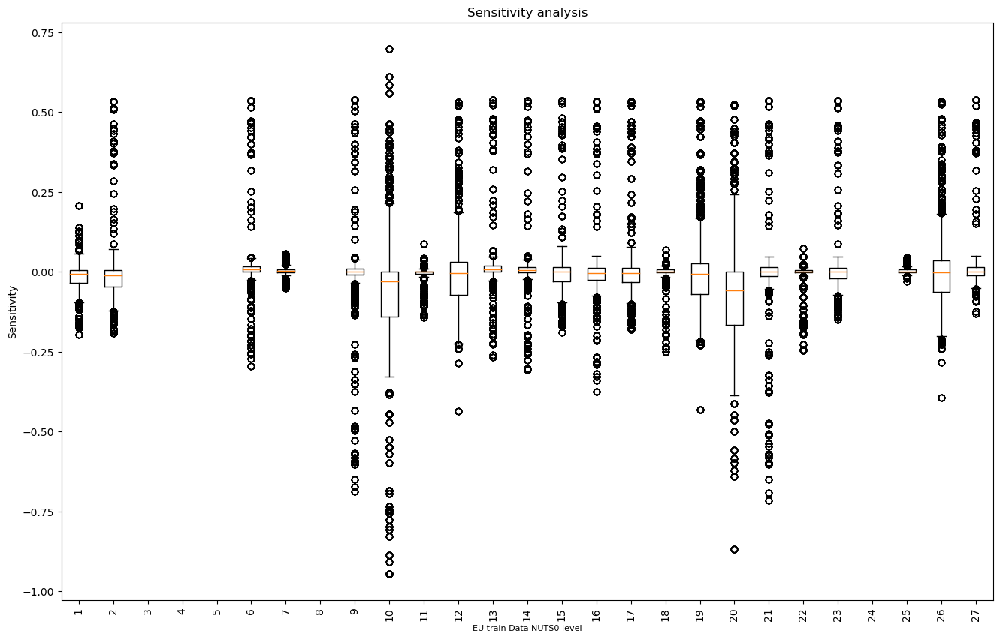

In [96]:
# Load the data
X = train_data_NUTS0[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total','gva_value', 'population_value', 'business_value']]
y = train_data_NUTS0[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value', 'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 'Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total', 'gva_value', 'population_value', 'business_value']]

# Initialize lists to store results
mean_list = []
median_list = []
stddev_list = []
sensitivity_list = []

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=126)
correlation_base = np.corrcoef(X_train.T, y_train.T)
# Loop for multiple iterations
for i in range(27):
       X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=i)

       # Calculate sensitivity
       correlation = np.corrcoef(X_train.T, y_train.T)           
       correlation_difference = correlation_base - correlation 
       # reshaping the numpy array to 1D array of (100,):
       correlation_difference = correlation_difference.reshape(-1)    
          
       # Calculate mean, median, and standard deviation
       mean = np.mean(correlation_difference)
       median = np.median(correlation_difference)
       stddev = np.std(correlation_difference)
       
       # Append results to the lists
       mean_list.append(mean)
       median_list.append(median)
       stddev_list.append(stddev)
       sensitivity_list.append(correlation_difference)
       
# Calculate the mean, median, and standard deviation for all the iterations:
mean_total = np.mean(mean_list)
median_total = np.mean(median_list)
stddev_total = np.mean(stddev_list)  

# Plot the results
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
axs[0, 0].boxplot(sensitivity_list, showfliers=False)
axs[0, 0].set_title("Sensitivity Analysis")
axs[0, 0].set_ylabel("Sensitivity")
axs[0, 0].set_xlabel("Iteration")

axs[0, 1].hist(mean_list)
axs[0, 1].axvline(x=np.mean(mean_list), color='red', linestyle='--')
axs[0, 1].set_title("Mean Analysis")
axs[0, 1].set_ylabel("Frequency")
axs[0, 1].set_xlabel("Mean")

axs[1, 0].hist(median_list)
axs[1, 0].axvline(x=np.mean(median_list), color='red', linestyle='--')
axs[1, 0].set_title("Median Analysis")
axs[1, 0].set_ylabel("Frequency")
axs[1, 0].set_xlabel("Median")

axs[1, 1].hist(stddev_list)
axs[1, 1].axvline(x=np.mean(stddev_list), color='red', linestyle='--')
axs[1, 1].set_title("Standard Deviation Analysis")
axs[1, 1].set_ylabel("Frequency")
axs[1, 1].set_xlabel("Standard Deviation")

plt.tight_layout()

# Plot the results
fig_1 = plt.figure(figsize=(16, 10))  # Adjust the size of the figure
plt.boxplot(sensitivity_list, showfliers=True)
plt.axhline(y=mean_total, color='red', linestyle='--')
plt.axhline(y=median_total, color='green', linestyle='--')
plt.axhline(y=stddev_total, color='blue', linestyle='--')
plt.xticks(rotation=90) # Rotate the names of the independent variables by 90 degrees
plt.xlabel("EU train Data NUTS0 level", fontsize = 8)
plt.ylabel("Sensitivity")
plt.title(f"Sensitivity analysis")
plt.show()

### Pairplot 

    It enables us to visualize pairwise relationships in a dataset. Note that we have kernel density estimate (KDE) plots on the diagonal. Similar to to a histogram, KDE can produce a plot that is less cluttered and more interpretable, especially when drawing multiple distributions.

    https://seaborn.pydata.org/generated/seaborn.pairplot.html

    https://seaborn.pydata.org/generated/seaborn.kdeplot.html

##### Stations Data NUTS3

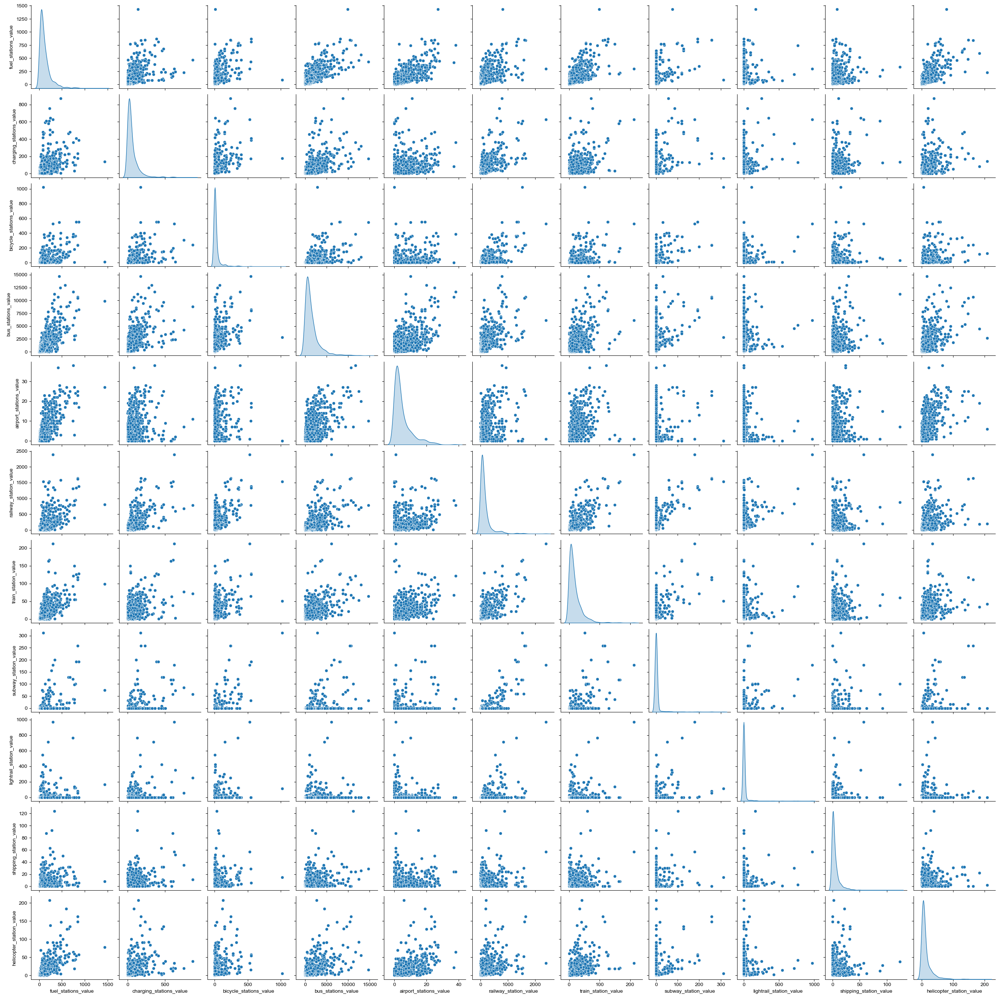

In [97]:
sns.pairplot(train_data_NUTS3[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Network Data NUTS3

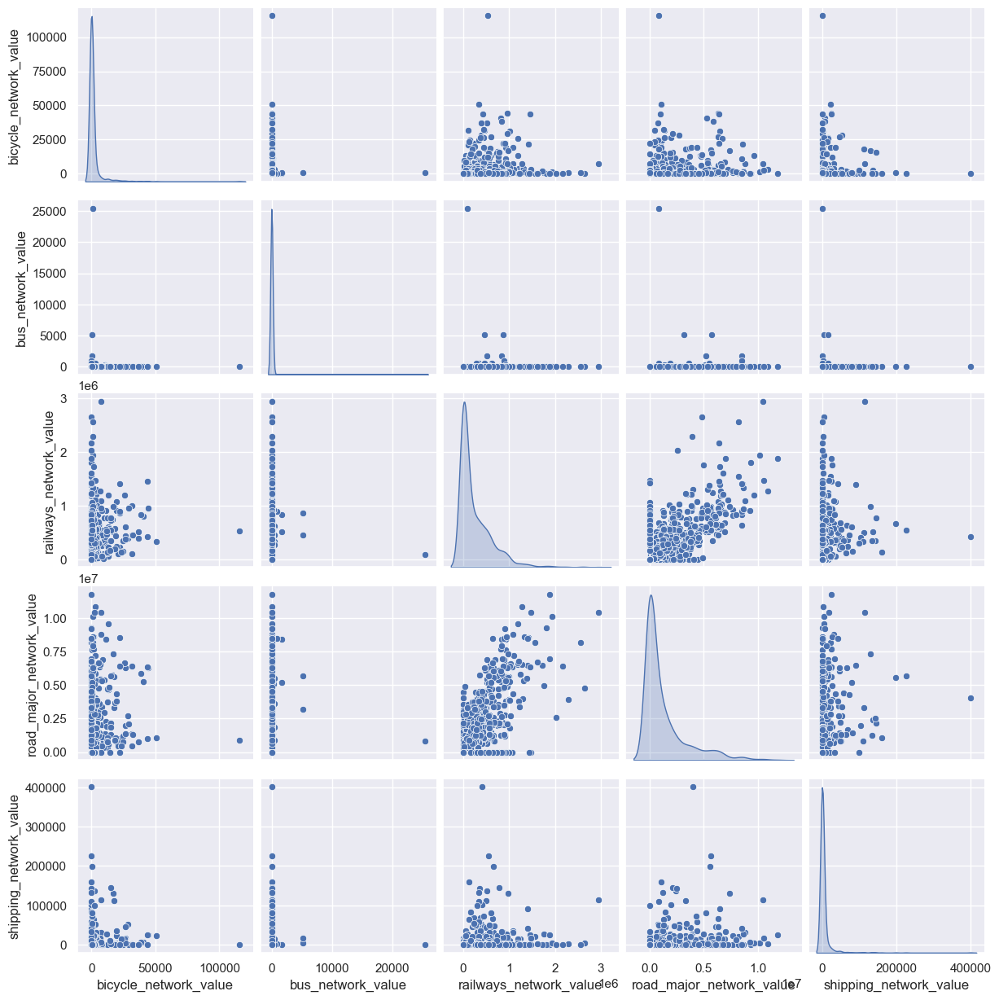

In [98]:
sns.pairplot(train_data_NUTS3[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Freight traffic flow data NUTS3

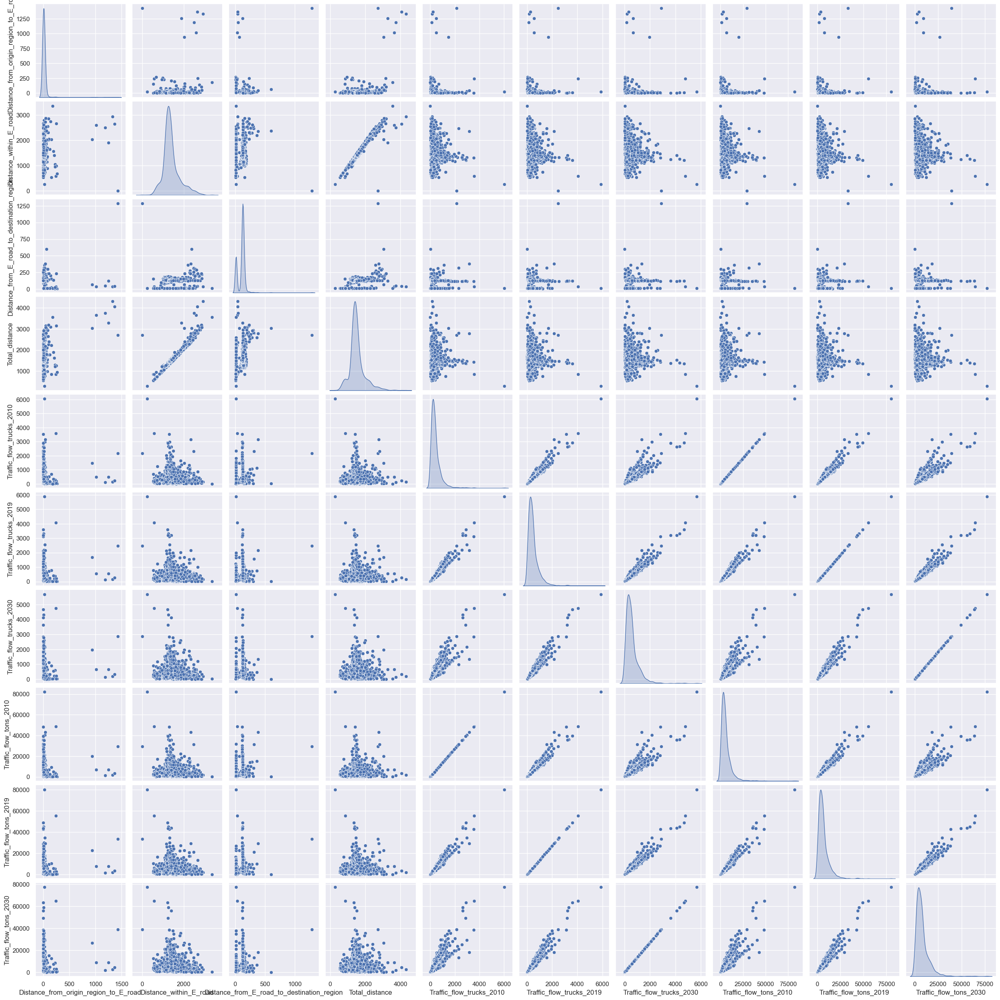

In [99]:
sns.pairplot(train_data_NUTS3[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Vehicle Stock data NUTS3

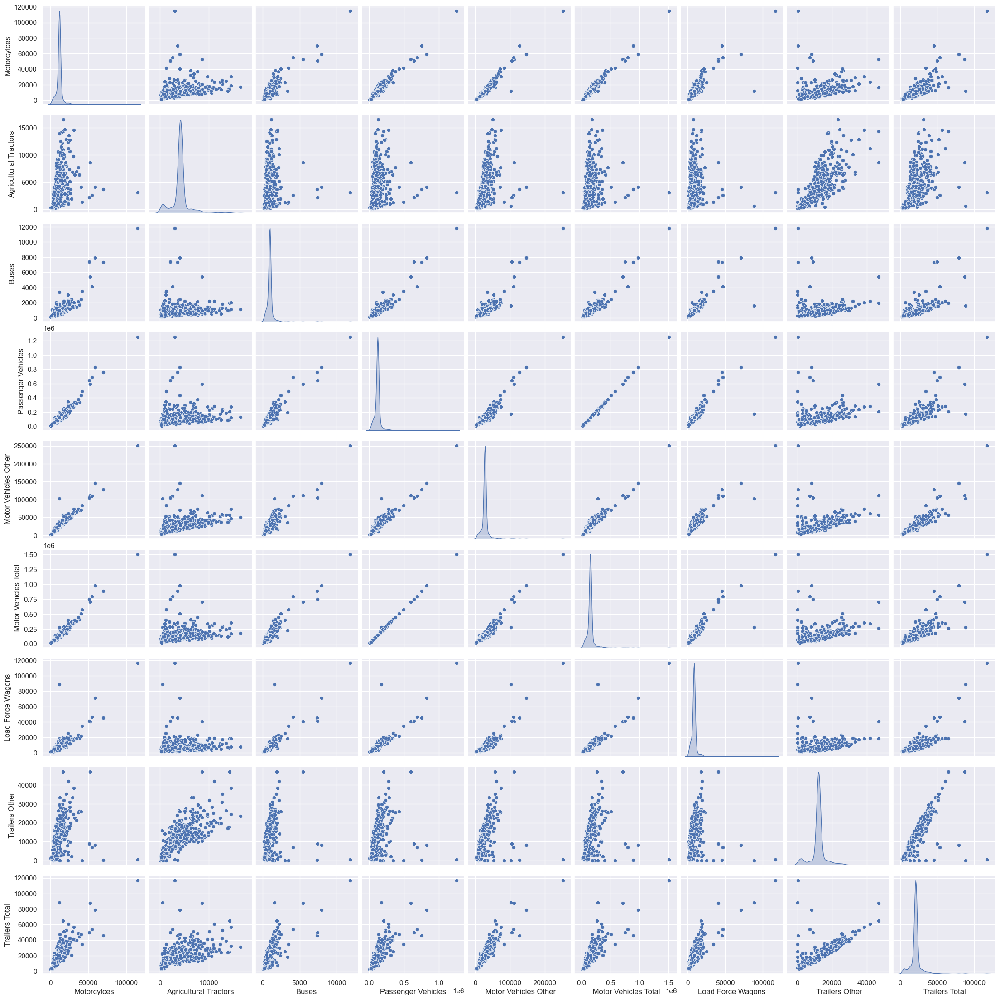

In [100]:
sns.pairplot(train_data_NUTS3[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})
#  This support the hypothises that we would need to cluster the countries. 

#### GVA - Population - Business - data NUTS3

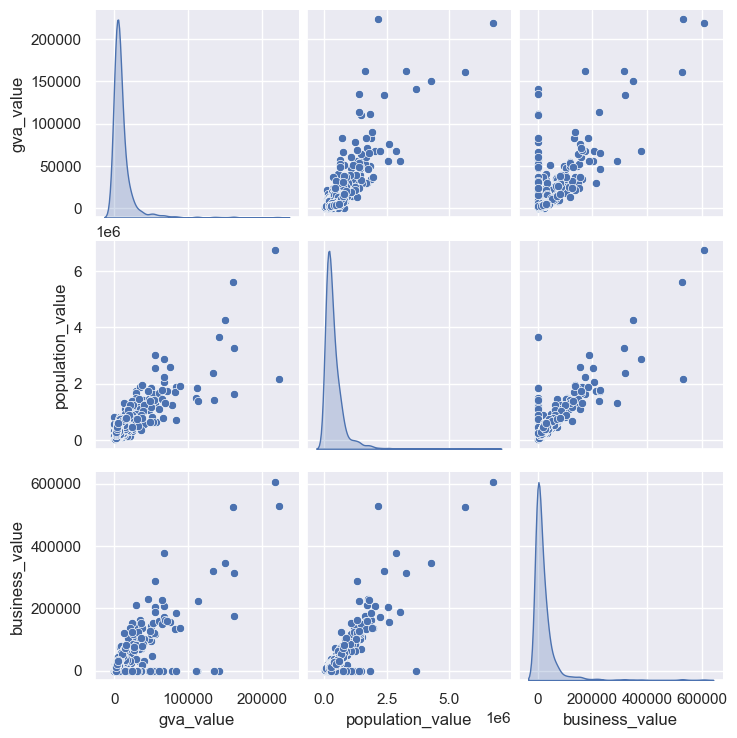

In [101]:
sns.pairplot(train_data_NUTS3[['gva_value', 'population_value', 'business_value']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Stations Data at Country level

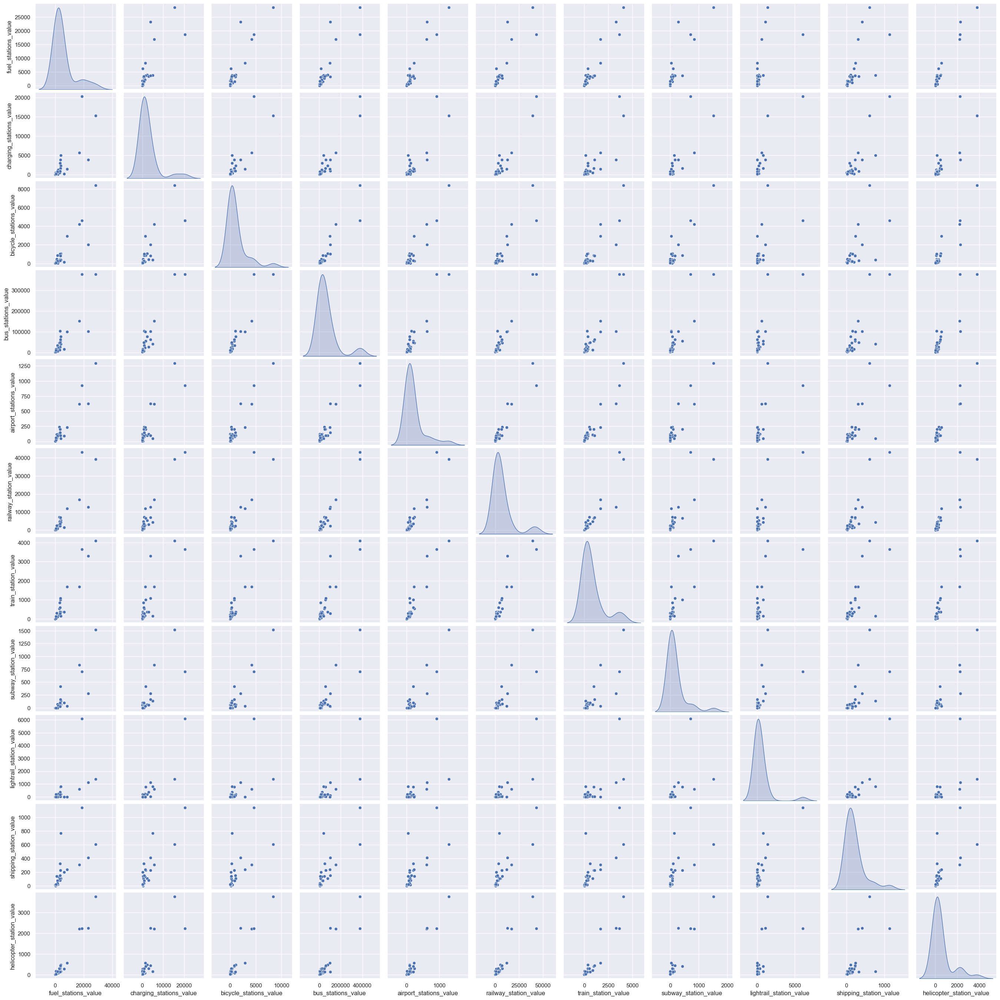

In [102]:
sns.pairplot(train_data_NUTS0[['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Network Data at Country level

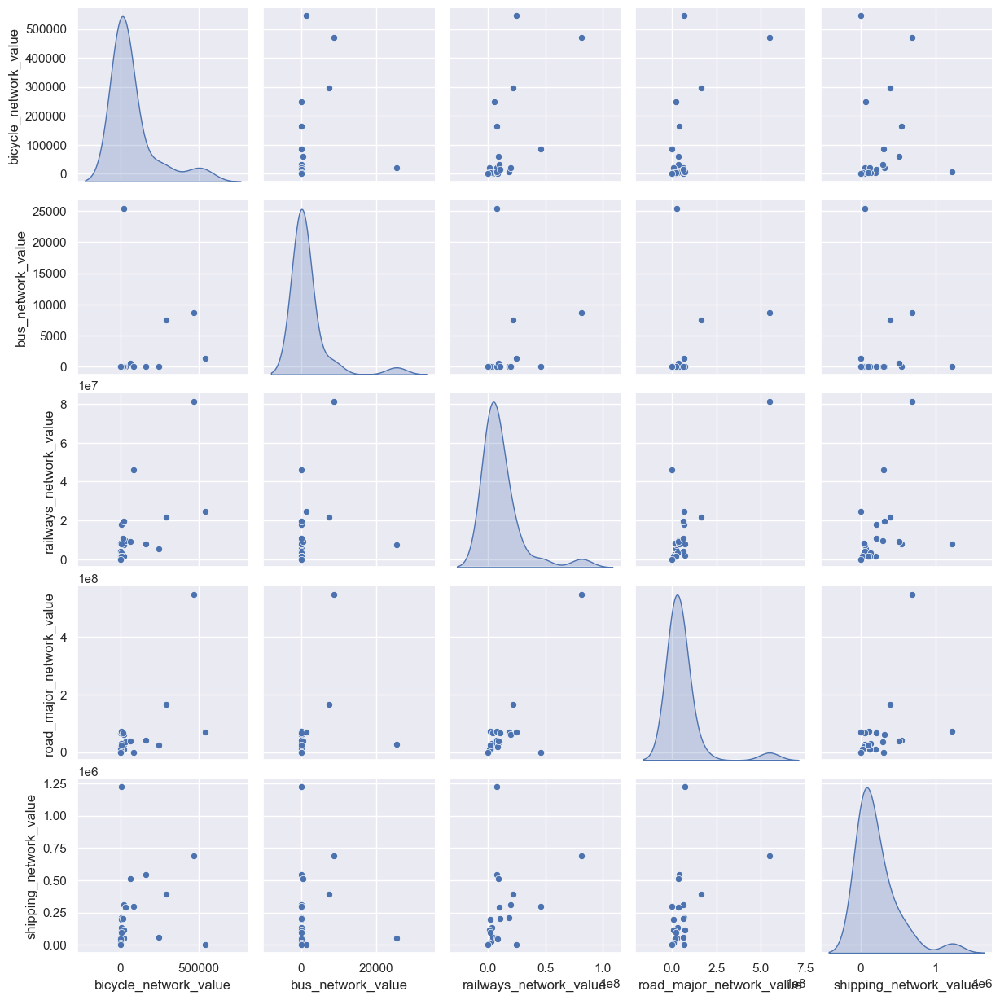

In [103]:
sns.pairplot(train_data_NUTS0[['bicycle_network_value',
       'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Freight traffic flow at Country level

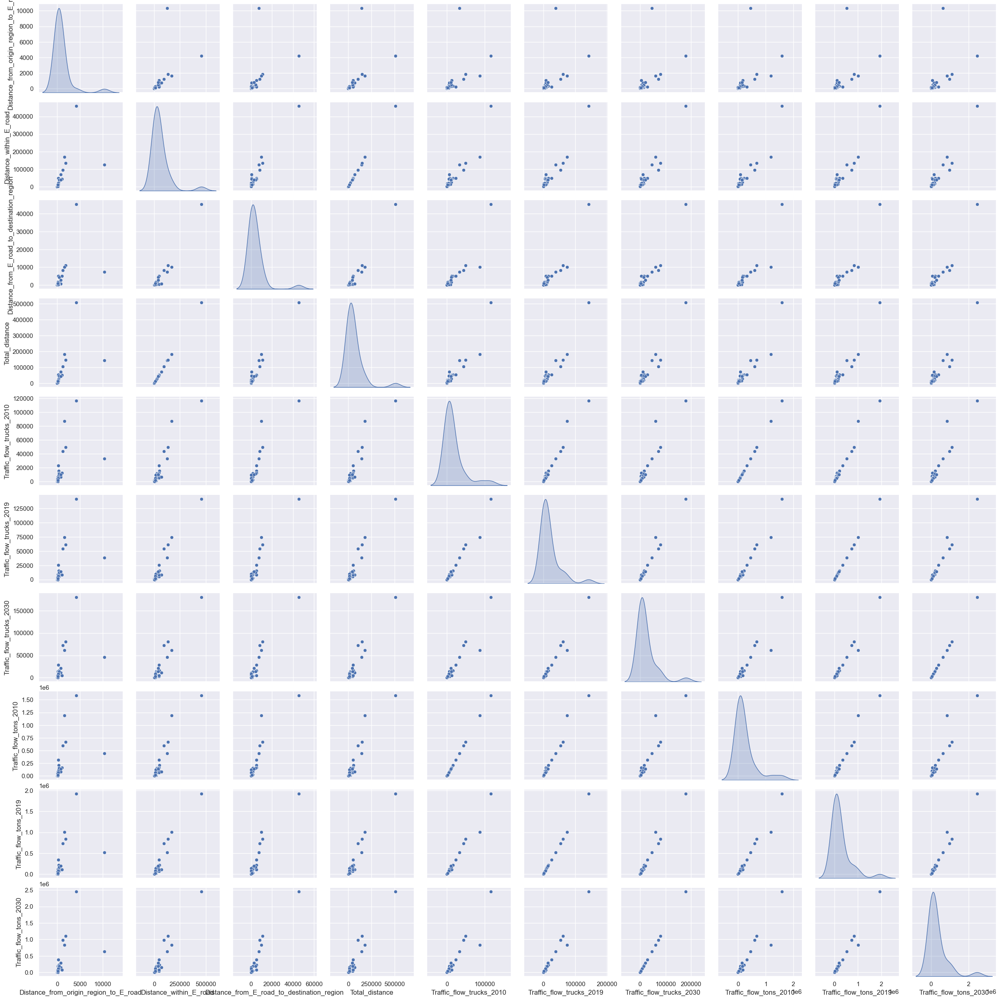

In [104]:
sns.pairplot(train_data_NUTS0[['Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

#### Vehicle Stock data at Country level

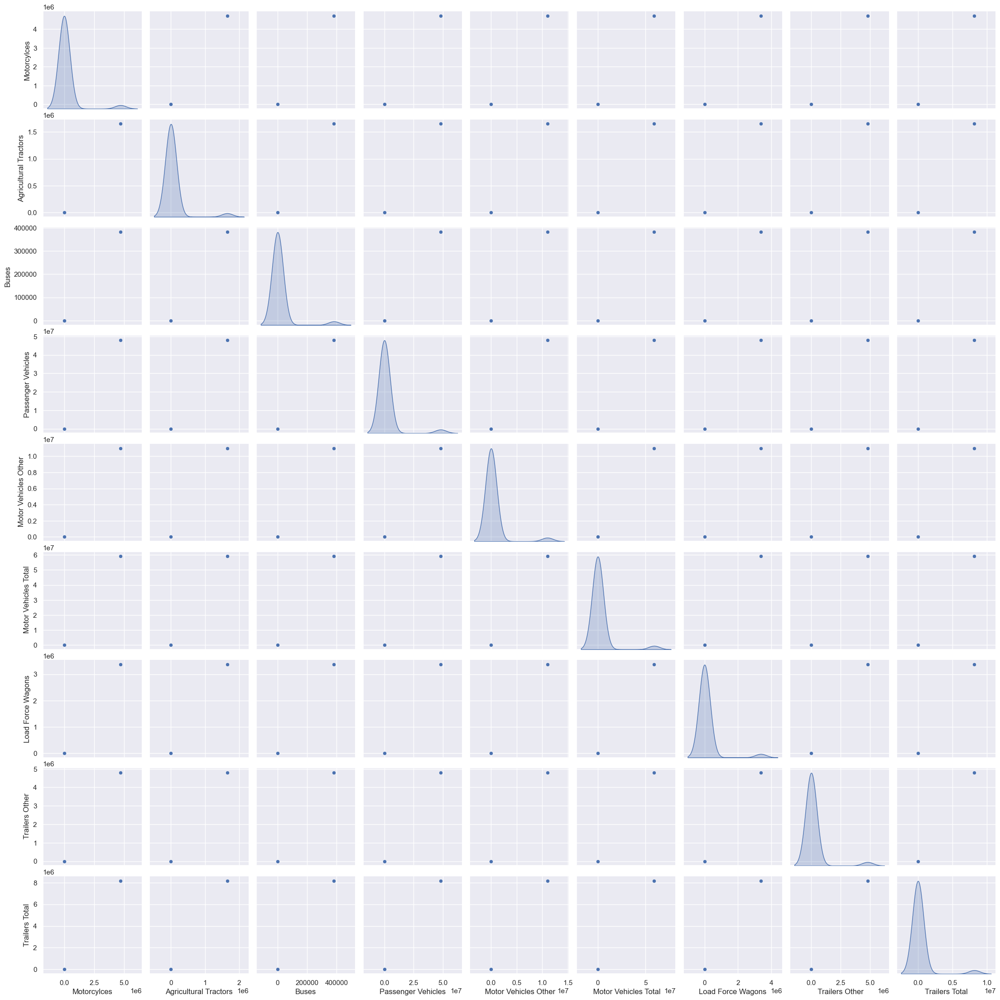

In [105]:
sns.pairplot(train_data_NUTS0[['Motorcylces', 'Agricultural Tractors',
       'Buses', 'Passenger Vehicles', ' Motor Vehicles Other',
       ' Motor Vehicles Total', 'Load Force Wagons', ' Trailers Other',
       'Trailers Total']],diag_kind='kde')
sns.set(rc={'figure.figsize':(8,6)})

# Supervised Algorithms: Preparing the Labels

        Supervised approach requires labelled data for the training. In these datasets, the objective function is each of the NUTS3 features prediction (regression), depending on the question. 
        
        We need to create a feature matrix say X and and label vector Y. 
        
        The X label could be the disaggregated variable at NUTS3 level using:

        1) Mass-preserving areal weighting, whereby the known variable of source administrative regions 
        is divided uniformly across their area, in order to estimate the source variable at target regions 
        of higher spatial resolution.

        2) Then will be applyed Pycnophylactic interpolation which is a refinement of mass-preserving areal 
        weighting that assumes a degree of spatial auto-correlation in the variable distribution. 
        This method starts by applying the mass-preserving areal weighting procedure, afterward smoothing 
        the values for the resulting regions by replacing them with the average of their neighbors.

        3) Disaggregate the data from Country level directly to NUTS3 without any inference of pre-disaggregation with the help of any other ancilliary data.  

        The Y label will be used to train and test our model.

# Multioutput regression

    Multioutput regression predicts multiple numerical properties for each sample. Each property is a numerical variable and the number of properties to be predicted for each sample is greater than or equal to 2. Some estimators that support multioutput regression are faster than just running n_output estimators.

##  MultiOutputRegressor

    Multioutput regression support can be added to any regressor with MultiOutputRegressor(https://scikit-learn.org/stable/modules/generated/sklearn.multioutput.MultiOutputRegressor.html#sklearn.multioutput.MultiOutputRegressor). This strategy consists of fitting one regressor per target. Since each target is represented by exactly one regressor it is possible to gain knowledge about the target by inspecting its corresponding regressor. As MultiOutputRegressor fits one regressor per target it can not take advantage of correlations between targets.

## RegressorChain

    Regressor chains (see RegressorChain --> https://scikit-learn.org/stable/modules/generated/sklearn.multioutput.RegressorChain.html) is analogous to ClassifierChain as a way of combining a number of regressions into a single multi-target model that is capable of exploiting correlations among targets.

    A multi-label model that arranges regressions into a chain.

    Each model makes a prediction in the order specified by the chain using all of the available features provided to the model plus the predictions of models that are earlier in the chain.
    

# Regularized Linear Models

## Lasso

        Overfitting is a common problem in supervised learning. One way to reduce overfitting is to regularize the model by deploying constraints.

        Least Absolute Shrinkage and Selection Operator Regression -- Lasso Regression -- is a regularized version of the Linear Regression approach. In this model, we add a regularization term (alpha) to the cost function (i.e. mean square error). It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent.

        https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html#sklearn.linear_model.Lasso

### Hypothesis I --> Spatial Disaggregation of OSM Stations for all EU level 

        Disaggregation of OSM fuel stations from Country Level to NUTS3 level using OSM Network data and Freight traffic Flow at NUTS3 level. We know beforehand the NUTS3 level OSM fuel stations target variable, it means, we know the value of the traffic flow at each NUTS3 level. So we will be able to compute de accurracy of the model by the error based learning.  

        - Input data:

                * OSM data Stations NUTSO:
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'
        
                * OSM data Network NUTS3:
                        'bicycle_network_value'
                        'bus_network_value'
                        'railways_network_value'
                        'road_major_network_value'
                        'shipping_network_value',

                * Freight traffic Flow at NUTS3 level:
                        'Distance_from_origin_region_to_E_road', 
                        'Distance_within_E_road', 
                        'Distance_from_E_road_to_destination_region', 
                        'Total_distance'
                        'Traffic_flow_trucks_2010',
                        'Traffic_flow_trucks_2019', 
                        'Traffic_flow_trucks_2030',
                        'Traffic_flow_tons_2010', 
                        'Traffic_flow_tons_2019',
                        'Traffic_flow_tons_2030'

        - Output Data (target data):

                * OSM data Stations NUTS3 "Disaggregated data":
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'





#### Prepearing the data set for the model 

In [374]:
df_nuts3 = train_data_NUTS3[[
       'NUTS0_region_code', 'NUTS3_region_code', 
              'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
]]

df_country = train_data_NUTS0[[
       'NUTS0_region_code', 
              'fuel_stations_value', 'charging_stations_value',
              'bicycle_stations_value', 'bus_stations_value',
              'airport_stations_value', 'railway_station_value',
              'train_station_value', 'subway_station_value',
              'lightrail_station_value', 'shipping_station_value',
              'helicopter_station_value'
              ]]

df = pd.merge(df_nuts3, df_country, how='left', on='NUTS0_region_code')

In [375]:
df.head(30)

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
0,BE,BE353,2766.775250,0.000000,66025.602186,5.042336e+05,0.000000,7.0,833.545238,15.561905,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
1,BE,BE100,102.433127,0.000000,175338.022604,5.478029e+05,5261.286110,5.0,1130.588785,131.744548,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
2,BE,BE334,0.000000,0.000000,56779.484441,2.801894e+05,0.000000,5.0,826.866157,15.296367,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
3,BE,BE335,0.000000,0.000000,156497.817229,7.330995e+05,1385.527294,1.0,1105.896346,127.798658,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
4,BE,BE336,0.000000,0.000000,38434.091345,2.861128e+05,0.000000,10.0,1094.505255,126.722973,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
5,BE,BE211,50748.877699,0.000000,333961.392871,1.055556e+06,23114.512137,4.0,1165.943107,125.765135,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
6,BE,BE212,31934.154881,0.000000,109875.858115,4.554187e+05,370.177494,6.0,1156.476831,126.439462,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
7,BE,BE213,19204.596921,0.000000,186247.855096,1.030797e+06,4019.195952,5.0,1151.583578,125.774927,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
8,BE,BE221,21921.058187,0.000000,222109.676776,9.874742e+05,0.000000,1.0,1140.939015,125.788391,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
9,BE,BE222,8196.019927,0.000000,104166.088592,7.199539e+05,53.609067,18.0,1125.899254,126.302985,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0


In [612]:
len(df_nuts3)

1170

In [613]:
len(df)

1170

##### check again NaN values

###### input Data

In [614]:
nan_values = np.isnan(df[[
       'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'fuel_stations_value', 'charging_stations_value',
                            'bicycle_stations_value', 'bus_stations_value',
                            'airport_stations_value', 'railway_station_value',
                            'train_station_value', 'subway_station_value',
                            'lightrail_station_value', 'shipping_station_value',
                            'helicopter_station_value' 
       ]]).sum()

In [615]:
nan_values

bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
Distance_from_origin_region_to_E_road         0
Distance_within_E_road                        0
Distance_from_E_road_to_destination_region    0
Total_distance                                0
Traffic_flow_trucks_2010                      0
Traffic_flow_trucks_2019                      0
Traffic_flow_trucks_2030                      0
Traffic_flow_tons_2010                        0
Traffic_flow_tons_2019                        0
Traffic_flow_tons_2030                        0
fuel_stations_value                           0
charging_stations_value                       0
bicycle_stations_value                        0
bus_stations_value                            0
airport_stations_value                        0
railway_station_value                   

In [616]:
len(df)

1170

In [127]:
# df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
96,NaN,ELZZZ,0.0,0.0,0.0,0.0,0.0,23.371486,1394.893219,105.587393,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
# df['NUTS0_region_code'].fillna('EL',inplace=True)

In [609]:
df.head()

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
0,BE,BE353,2766.775250,0.0,66025.602186,504233.552677,0.000000,7.0,833.545238,15.561905,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
1,BE,BE100,102.433127,0.0,175338.022604,547802.929254,5261.286110,5.0,1130.588785,131.744548,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
2,BE,BE334,0.000000,0.0,56779.484441,280189.354101,0.000000,5.0,826.866157,15.296367,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
3,BE,BE335,0.000000,0.0,156497.817229,733099.496205,1385.527294,1.0,1105.896346,127.798658,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
4,BE,BE336,0.000000,0.0,38434.091345,286112.836550,0.000000,10.0,1094.505255,126.722973,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0


In [610]:
# replacement = df.mean()
# df = df.apply(lambda x: x.fillna(replacement[x.name]) if x.dtype == np.dtype('float64') else x)

C:\Users\rofer\AppData\Local\Temp\ipykernel_11112\4160189447.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  replacement = df.mean()


In [131]:
# df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [132]:
# df = df.dropna(axis='rows')

In [617]:
len(df)

1170

###### Target data

In [618]:
nan_values = np.isnan(train_data_NUTS3[[
                     'fuel_stations_value', 'charging_stations_value',
                     'bicycle_stations_value', 'bus_stations_value',
                     'airport_stations_value', 'railway_station_value',
                     'train_station_value', 'subway_station_value',
                     'lightrail_station_value', 'shipping_station_value',
                     'helicopter_station_value'  
       ]]).sum()

In [619]:
nan_values

fuel_stations_value         0
charging_stations_value     0
bicycle_stations_value      0
bus_stations_value          0
airport_stations_value      0
railway_station_value       0
train_station_value         0
subway_station_value        0
lightrail_station_value     0
shipping_station_value      0
helicopter_station_value    0
dtype: int64

In [620]:
len(train_data_NUTS3)

1170

##### Defining the input and target variable

In [621]:
#  Prepearing data input
dataX = df[[ 
              'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'fuel_stations_value', 'charging_stations_value',
                            'bicycle_stations_value', 'bus_stations_value',
                            'airport_stations_value', 'railway_station_value',
                            'train_station_value', 'subway_station_value',
                            'lightrail_station_value', 'shipping_station_value',
                            'helicopter_station_value'
                            ]].copy()
dataY = train_data_NUTS3[[
              'fuel_stations_value', 'charging_stations_value',
              'bicycle_stations_value', 'bus_stations_value',
              'airport_stations_value', 'railway_station_value',
              'train_station_value', 'subway_station_value',
              'lightrail_station_value', 'shipping_station_value',
              'helicopter_station_value'
              ]].copy()

        Divide the entire dataset into fractions to have a training set from which the machine learning algorithm learns. Also it is needed another set to test the predictions of the ML algorithm. There is no golden rule here: need to consider the size of the entire dataset. Sometimes 5% is more than enough, sometimes it is needed to divide 1/3 to have enough test samples.

In [622]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [623]:
X_train.columns

Index(['bicycle_network_value', 'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030',
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

In [624]:
y_train.columns

Index(['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

#### Normalization

In [625]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
count,1.170000e+03,1.170000e+03,1.170000e+03,1170.000000,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,...,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1170.000000,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03
mean,-2.429206e-17,1.214603e-17,1.214603e-17,0.000000,-1.973730e-17,1.214603e-17,2.550666e-16,4.858412e-17,1.578984e-16,4.858412e-17,...,-1.214603e-16,4.858412e-17,-1.943365e-16,-1.214603e-16,0.000000,-2.429206e-17,4.858412e-17,4.858412e-17,7.287618e-17,2.429206e-17
std,1.000428e+00,1.000428e+00,1.000428e+00,1.000428,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,...,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00
min,-2.705981e-01,-4.773559e-02,-6.836004e-01,-0.635725,-2.270785e-01,-2.418152e-01,-3.522961e+00,-1.431933e+00,-2.829072e+00,-9.592815e-01,...,-1.107769e+00,-1.245851e+00,-1.245755e+00,-1.360228e+00,-1.244934,-1.493174e+00,-1.092518e+00,-8.954745e-01,-1.334838e+00,-1.320289e+00
25%,-2.705981e-01,-4.773559e-02,-6.836004e-01,-0.635725,-2.270785e-01,-1.900822e-01,-5.419197e-01,2.134685e-16,-4.800441e-01,-5.692106e-01,...,-9.484599e-01,-1.055119e+00,-9.432939e-01,-1.093199e+00,-0.979112,-1.251341e+00,-9.413455e-01,-8.750207e-01,-8.835435e-01,-1.068901e+00
50%,-2.705981e-01,-4.773559e-02,-4.704656e-01,-0.484889,-2.270785e-01,-1.383493e-01,-1.959595e-01,2.962512e-01,-1.667001e-01,-2.524767e-01,...,-5.306920e-01,-5.356993e-02,-6.055845e-01,1.251209e-01,-0.533727,6.806917e-01,-4.443086e-01,-4.808191e-01,-3.908033e-01,6.021429e-01
75%,-2.301921e-01,-4.773559e-02,4.205601e-01,0.203859,-2.031035e-01,-1.419020e-02,3.154743e-01,4.164754e-01,2.561965e-01,1.973117e-01,...,1.241264e+00,6.369134e-01,1.125738e+00,8.427614e-01,1.168867,9.060516e-01,5.245698e-01,1.367466e+00,1.278527e+00,6.021429e-01
max,1.797646e+01,3.267603e+01,7.260034e+00,5.306434,1.880531e+01,1.451242e+01,4.979592e+00,1.769402e+01,6.394636e+00,1.275191e+01,...,1.241264e+00,2.184873e+00,1.130911e+00,1.729679e+00,1.168867,1.197306e+00,2.384450e+00,1.367466e+00,1.278527e+00,1.921071e+00


#### Cross-Validation
        Another rule of thumb is to split the training set into a sub-training sets and a validation set before seeing its true performance on the test set (25% of the dataset reserved above). This policy is called k-fold cross-validation. The training data is divided into k fractions, trained over (k-1) fractions and tested on the k_th. Here the idea is to increase the generalization of the model as much as possible.
        
        https://scikit-learn.org/stable/modules/cross_validation.html

In [626]:
k_fold = KFold(n_splits=5, shuffle=True, random_state=2020)

#### How to calculate the performance?
        In any supervised approach, it is needed to select a cost function to compare ML predictions with the true values (labels). The ML algorithm will minimize the cost function by changing its fitting parameters. Some time should be spent to define what might be the best cost function for the data set and the objective.

        In this case, as it is been dealed with regression, it can be used with built-in error functions:

        https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

#### Model Development

In [668]:
# Hyperparameters:
alpha=30 #alpha = 0 is equivalent to an ordinary least square but it is not recommended to put zero here!
# normalize=False #
max_iter=20000
tol=0.0001
random_state = 2020
selection='cyclic' # (setting to ‘random’) often leads to significantly faster convergence especially when tol is higher than 1e-4.

lasso_MultiOutputRegressor = MultiOutputRegressor(Lasso(alpha=alpha, max_iter = max_iter, tol = tol, random_state = random_state, selection = selection))

In [669]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])
# print(predictionsBasedOnKFolds)
# print("X_train shape:", predictionsBasedOnKFolds.shape)
model = lasso_MultiOutputRegressor

#kfold.split will generate indices to split data into training and test set (cv):
# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.values):
# k_fold.split gives as the number of iterations (in this case 1169 are going to be splited into 5 kfolds 
# and the 20 % rest is going to the cross validation check)

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)
scoreLasso = model.score(X_train,y_train)
print('-----------------------------------')
print('Lasso Score: ', scoreLasso)
print('-----------------------------------')

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.417e+08, tolerance: 2.279e+05
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.37477417268362245
CV Score:  0.3136302105148865


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.145e+08, tolerance: 2.148e+05
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.3749299730869844
CV Score:  0.3126747890300422


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.392e+08, tolerance: 2.244e+05
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.3750515633718503
CV Score:  0.3066902529296242


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.117e+08, tolerance: 2.035e+05
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.3810180451646483
CV Score:  0.3230947920739147


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.067e+08, tolerance: 2.226e+05
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.3783169534501019
CV Score:  0.27950290608289646
-----------------------------------
Lasso Score:  0.36288453067356147
-----------------------------------


In [145]:
# Test Problem:
test_data = df.sample(1,random_state=11).copy()
test_data

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
1022,EE,EE006,0.0,0.0,0.0,0.0,0.0,16.0,2117.998062,157.587209,...,234.0,184.0,17738.0,27.0,621.0,60.0,6.0,187.0,19.0,50.0


In [146]:
# Preparing the input data:
x_testing = test_data.drop(['NUTS0_region_code', 'NUTS3_region_code'],axis=1)

In [147]:
x_testing.head()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
1022,0.0,0.0,0.0,0.0,0.0,16.0,2117.998062,157.587209,2291.585271,265.112645,...,234.0,184.0,17738.0,27.0,621.0,60.0,6.0,187.0,19.0,50.0


In [148]:
# Calling model for the prediction:
lasso_MultiOutputRegressor.predict(x_testing)

array([[  80.08532809,   44.48146421,   31.01766105, 1297.38137577,
           2.78826579,   67.45027213,   12.00162755,    4.27881717,
          18.75035036,    3.92409114,    8.08334151]])

#### Accurracy Visualization

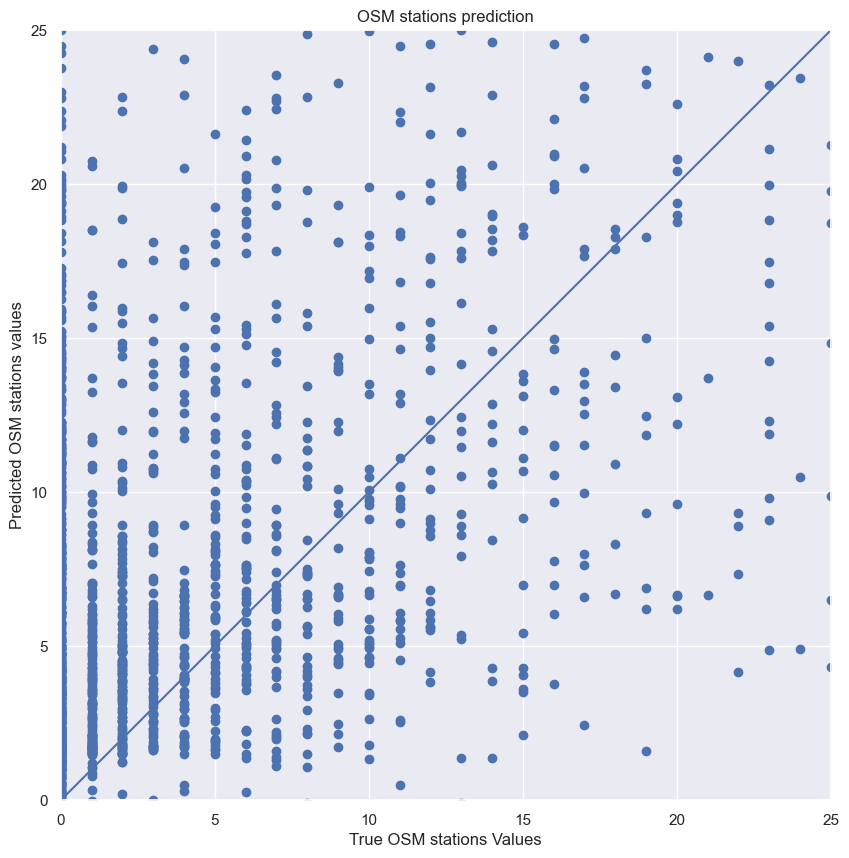

In [646]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations Values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM stations prediction')
lims = [0, 25]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

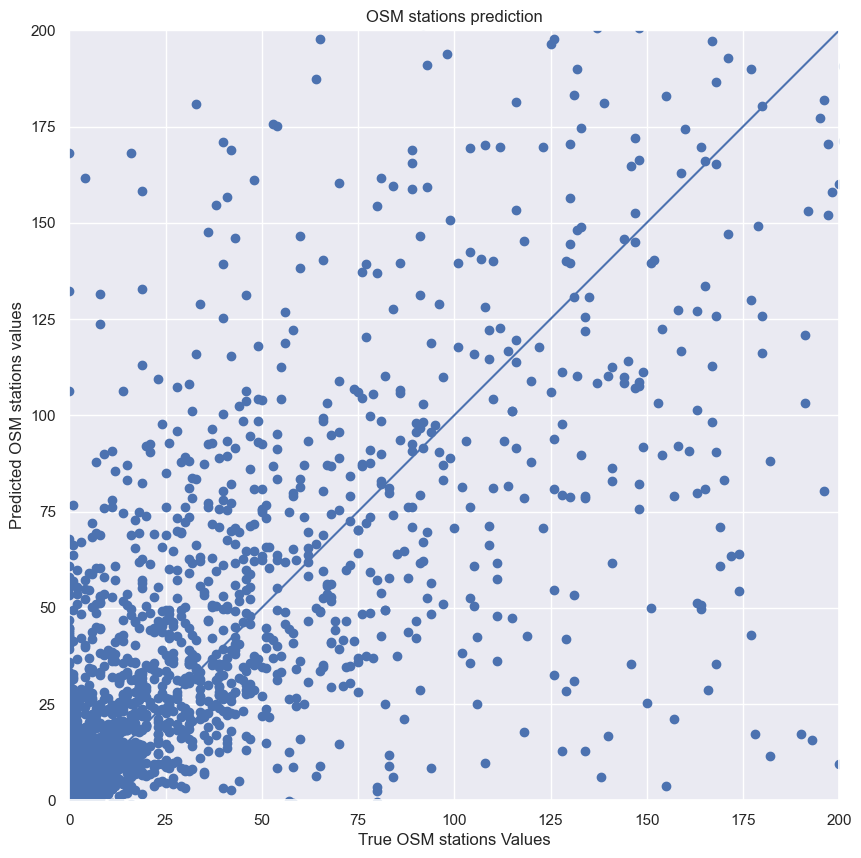

In [670]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations Values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM stations prediction')
lims = [0, 200]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

#### Error Distribution Calculation

Text(0, 0.5, 'count')

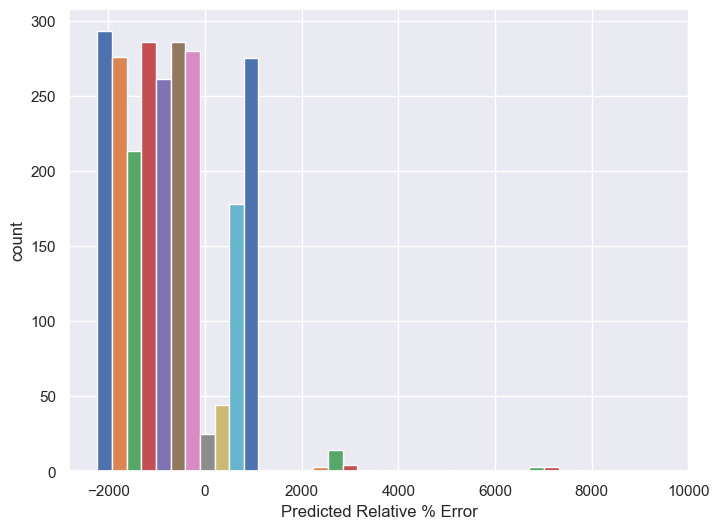

In [649]:
# Calculating the error distribution

# The error you are encountering is because the error_lasso variable contains some inf values (infinity). 
# When plotting with matplotlib's hist function, you need to supply a finite range for the x-axis, 
# but the range of error_lasso is not finite because of the inf values.
# To resolve this issue, you need to remove or replace the inf values in error_lasso. 
# For example, you could replace them with NaN values, which can be ignored in the plot:

error_lasso = (Y_test_predictions - y_test)/y_test*100
error_lasso[np.isinf(error_lasso)] = np.nan
plt.hist(error_lasso, bins=3)
plt.xlabel('Predicted Relative % Error')
plt.ylabel('count')

#### Tuning Hyperparameters

        Here it can be seen that the model fails! So, is it possible to improve the model outcome? We can tune the hyperparameter alpha and use grid search to sweep possible values.

        For that purpose, we will use GridSearchCV of scikit learn: we will give the list of hyperparameters and it will use CV to test possible combinations. Here we only have one parameter to play with.

In [663]:
# create a Lasso regressor object
lasso_reg = Lasso(max_iter = max_iter, tol = tol, random_state = random_state, selection = selection)

# create a MultiOutputRegressor object
multi_regressor = MultiOutputRegressor(lasso_reg)

# define a grid of hyperparameters to search
param_grid = {'estimator__alpha': [-4, 0, 1.0, 2.0, 5.0, 10, 15, 20, 25, 30, 35, 40, 45, 50]}

# create a GridSearchCV object
grid_search = GridSearchCV(multi_regressor, param_grid, scoring='r2', cv=k_fold, refit=True)

# fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# get the results 
results = grid_search.cv_results_
# get the best hyperparameters from the grid search
print("Best Hyperparameters: ", grid_search.best_params_)
# Perform the grid search
print('Best R^2 obtained:', grid_search.best_score_)

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\multioutput.py:49: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X, y, **fit_params)
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.905e+06, tolerance: 1.387e+03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  m

Best Hyperparameters:  {'estimator__alpha': 30}
Best R^2 obtained: 0.3071185901262728


AttributeError: 'MultiOutputRegressor' object has no attribute 'estimator__alpha'

In [655]:
#Lets check the keys to plot them:
results.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_estimator__alpha', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

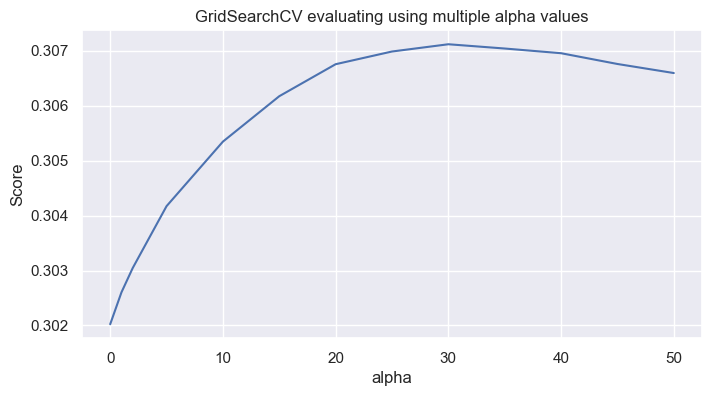

In [664]:
# Plotting the results
plt.figure(figsize=(8, 4))
plt.title("GridSearchCV evaluating using multiple alpha values",
          fontsize=12)
plt.xlabel("alpha")
plt.ylabel("Score")
# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_estimator__alpha'].data, dtype=float)
Y_axis = np.array(results['mean_test_score'].data, dtype=float)
plt.plot(X_axis,Y_axis)
plt.show()

#### Learning Curve

        In previous exercises, we have used cross-validation to get an idea about the generalization performance of the model. If the performance is much worse for CV, then it is overfitting. If they are both bad, then it is probably underfitting the data and we need more complex models.

        We can also visualize how the model is learning via 'Learning Plots'. The idea is simple: you need to train the model with growing size of training data and see its performance. Let's do that by defining a function for us:

In [667]:
# # Defining our function to run the model and see the evolution of error>
# def plot_learning_curves(model, X_train, X_test, y_train, y_test):
#   #Empty lists for data storage:
#   train_errors, val_errors = [], []
#   # Remember, we will look at the error as model is trained with more data.
#   # So we will make predictions with increasing instance sizes for both the training set and test set.
#   for m in range(1, len(X_train)):
#     #Model fitting:
#     model.fit(X_train[:m], y_train[:m])
#     #Predicting for the training data:
#     y_train_predict = model.predict(X_train[:m])
#     #Predicting for the test data:
#     y_test_predict = model.predict(X_test)
#     #Saving the errors for the plot for a given data size:
#     train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
#     val_errors.append(mean_squared_error(y_test, y_test_predict))
  
#   # Plotting the results:
#   plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
#   plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
#   plt.legend()
#   plt.xlim(0, 50),  plt.ylim(0.01,50)
#   plt.yscale("log")
#   plt.xlabel("Instances"),  plt.ylabel("MSE")
  
# # Calling our function to draw the learning curve for elastic net:
# plot_learning_curves(model,X_train, X_test, y_train, y_test) 

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisati

KeyboardInterrupt: 

### Hypothesis II --> Spatial Disaggregation of OSM Stations for all EU level

        Disaggregation of OSM fuel stations from Country Level to NUTS3 level using OSM Network data, Freight traffic Flow and adding the population, gva and number of business at NUTS3 level.  

        - Input data:

                * OSM data Stations NUTSO:
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'
        
                * OSM data Network NUTS3:
                        'bicycle_network_value'
                        'bus_network_value'
                        'railways_network_value'
                        'road_major_network_value'
                        'shipping_network_value',

                * Freight traffic Flow at NUTS3 level:
                        'Distance_from_origin_region_to_E_road', 
                        'Distance_within_E_road', 
                        'Distance_from_E_road_to_destination_region', 
                        'Total_distance'
                        'Traffic_flow_trucks_2010',
                        'Traffic_flow_trucks_2019', 
                        'Traffic_flow_trucks_2030',
                        'Traffic_flow_tons_2010', 
                        'Traffic_flow_tons_2019',
                        'Traffic_flow_tons_2030'

                * Socio-Economic Data at NUTS3 level:        
                        'gva_value', 
                        'population_value', 
                        'business_value'

        - Output Data (target data):

                * OSM data Stations NUTSO "Disaggregated data":
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'



#### Prepearing the data set for the model 

In [377]:
df_nuts3 = train_data_NUTS3[[
              'NUTS0_region_code', 'NUTS3_region_code', 
              'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'gva_value', 
                            'population_value', 
                            'business_value'
]]
df_country = train_data_NUTS0[[
              'NUTS0_region_code', 
                     'fuel_stations_value', 'charging_stations_value',
                     'bicycle_stations_value', 'bus_stations_value',
                     'airport_stations_value', 'railway_station_value',
                     'train_station_value', 'subway_station_value',
                     'lightrail_station_value', 'shipping_station_value',
                     'helicopter_station_value'
]]
df = pd.merge(df_nuts3, df_country, how='left', on='NUTS0_region_code')

In [242]:
len(df_nuts3)

1170

In [243]:
len(df)

1170

##### check again NaN values

###### input Data

In [244]:
nan_values = np.isnan(df[[
       'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'gva_value', 
                            'population_value', 
                            'business_value',
                                   'fuel_stations_value', 'charging_stations_value',
                                   'bicycle_stations_value', 'bus_stations_value',
                                   'airport_stations_value', 'railway_station_value',
                                   'train_station_value', 'subway_station_value',
                                   'lightrail_station_value', 'shipping_station_value',
                                   'helicopter_station_value' 
       ]]).sum()

In [245]:
nan_values

bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
Distance_from_origin_region_to_E_road         0
Distance_within_E_road                        0
Distance_from_E_road_to_destination_region    0
Total_distance                                0
Traffic_flow_trucks_2010                      0
Traffic_flow_trucks_2019                      0
Traffic_flow_trucks_2030                      0
Traffic_flow_tons_2010                        0
Traffic_flow_tons_2019                        0
Traffic_flow_tons_2030                        0
gva_value                                     0
population_value                              0
business_value                                0
fuel_stations_value                           0
charging_stations_value                       0
bicycle_stations_value                  

In [179]:
len(df)

1170

In [394]:
# df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [181]:
# df['NUTS0_region_code'].fillna('EL',inplace=True)

In [182]:
# df.head()

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
0,BE,BE353,2766.775250,0.0,66025.602186,504233.552677,0.000000,7.0,833.545238,15.561905,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
1,BE,BE100,102.433127,0.0,175338.022604,547802.929254,5261.286110,5.0,1130.588785,131.744548,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
2,BE,BE334,0.000000,0.0,56779.484441,280189.354101,0.000000,5.0,826.866157,15.296367,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
3,BE,BE335,0.000000,0.0,156497.817229,733099.496205,1385.527294,1.0,1105.896346,127.798658,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0
4,BE,BE336,0.000000,0.0,38434.091345,286112.836550,0.000000,10.0,1094.505255,126.722973,...,2285.0,1081.0,77018.0,94.0,5450.0,368.0,66.0,201.0,111.0,480.0


In [676]:
# replacement = df.mean()
# df = df.apply(lambda x: x.fillna(replacement[x.name]) if x.dtype == np.dtype('float64') else x)

C:\Users\rofer\AppData\Local\Temp\ipykernel_11112\4160189447.py:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  replacement = df.mean()


In [184]:
# df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [185]:
# df = df.dropna(axis='rows')

In [186]:
len(df)

1170

###### Target data

In [246]:
nan_values = np.isnan(train_data_NUTS3[[
                     'fuel_stations_value', 'charging_stations_value',
                     'bicycle_stations_value', 'bus_stations_value',
                     'airport_stations_value', 'railway_station_value',
                     'train_station_value', 'subway_station_value',
                     'lightrail_station_value', 'shipping_station_value',
                     'helicopter_station_value'  
       ]]).sum()

In [247]:
nan_values

fuel_stations_value         0
charging_stations_value     0
bicycle_stations_value      0
bus_stations_value          0
airport_stations_value      0
railway_station_value       0
train_station_value         0
subway_station_value        0
lightrail_station_value     0
shipping_station_value      0
helicopter_station_value    0
dtype: int64

In [190]:
len(train_data_NUTS3)

1170

##### Defining the input and target variable

In [378]:
#  Prepearing data input
dataX = df[[ 
              'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'gva_value', 
                            'population_value', 
                            'business_value',
                                   'fuel_stations_value', 'charging_stations_value',
                                   'bicycle_stations_value', 'bus_stations_value',
                                   'airport_stations_value', 'railway_station_value',
                                   'train_station_value', 'subway_station_value',
                                   'lightrail_station_value', 'shipping_station_value',
                                   'helicopter_station_value'
                                   ]].copy()
dataY = train_data_NUTS3[[
              'fuel_stations_value', 'charging_stations_value',
              'bicycle_stations_value', 'bus_stations_value',
              'airport_stations_value', 'railway_station_value',
              'train_station_value', 'subway_station_value',
              'lightrail_station_value', 'shipping_station_value',
              'helicopter_station_value'
              ]].copy()

        Divide the entire dataset into fractions to have a training set from which the machine learning algorithm learns. Also it is needed another set to test the predictions of the ML algorithm. There is no golden rule here: need to consider the size of the entire dataset. Sometimes 5% is more than enough, sometimes it is needed to divide 1/3 to have enough test samples.

In [379]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [250]:
X_train.columns

Index(['bicycle_network_value', 'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030', 'gva_value',
       'population_value', 'business_value', 'fuel_stations_value',
       'charging_stations_value', 'bicycle_stations_value',
       'bus_stations_value', 'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

In [196]:
y_train.columns

Index(['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

#### Normalization

In [380]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
count,1.170000e+03,1.170000e+03,1.170000e+03,1170.000000,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,...,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1170.000000,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03,1.170000e+03
mean,-2.429206e-17,1.214603e-17,1.214603e-17,0.000000,-1.973730e-17,1.214603e-17,2.550666e-16,4.858412e-17,1.578984e-16,4.858412e-17,...,-1.214603e-16,4.858412e-17,-1.943365e-16,-1.214603e-16,0.000000,-2.429206e-17,4.858412e-17,4.858412e-17,7.287618e-17,2.429206e-17
std,1.000428e+00,1.000428e+00,1.000428e+00,1.000428,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,...,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00,1.000428e+00
min,-2.705981e-01,-4.773559e-02,-6.836004e-01,-0.635725,-2.270785e-01,-2.418152e-01,-3.522961e+00,-1.431933e+00,-2.829072e+00,-9.592815e-01,...,-1.107769e+00,-1.245851e+00,-1.245755e+00,-1.360228e+00,-1.244934,-1.493174e+00,-1.092518e+00,-8.954745e-01,-1.334838e+00,-1.320289e+00
25%,-2.705981e-01,-4.773559e-02,-6.836004e-01,-0.635725,-2.270785e-01,-1.900822e-01,-5.419197e-01,2.134685e-16,-4.800441e-01,-5.692106e-01,...,-9.484599e-01,-1.055119e+00,-9.432939e-01,-1.093199e+00,-0.979112,-1.251341e+00,-9.413455e-01,-8.750207e-01,-8.835435e-01,-1.068901e+00
50%,-2.705981e-01,-4.773559e-02,-4.704656e-01,-0.484889,-2.270785e-01,-1.383493e-01,-1.959595e-01,2.962512e-01,-1.667001e-01,-2.524767e-01,...,-5.306920e-01,-5.356993e-02,-6.055845e-01,1.251209e-01,-0.533727,6.806917e-01,-4.443086e-01,-4.808191e-01,-3.908033e-01,6.021429e-01
75%,-2.301921e-01,-4.773559e-02,4.205601e-01,0.203859,-2.031035e-01,-1.419020e-02,3.154743e-01,4.164754e-01,2.561965e-01,1.973117e-01,...,1.241264e+00,6.369134e-01,1.125738e+00,8.427614e-01,1.168867,9.060516e-01,5.245698e-01,1.367466e+00,1.278527e+00,6.021429e-01
max,1.797646e+01,3.267603e+01,7.260034e+00,5.306434,1.880531e+01,1.451242e+01,4.979592e+00,1.769402e+01,6.394636e+00,1.275191e+01,...,1.241264e+00,2.184873e+00,1.130911e+00,1.729679e+00,1.168867,1.197306e+00,2.384450e+00,1.367466e+00,1.278527e+00,1.921071e+00


In [381]:
dataX.sample(15)

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
529,-0.270598,-0.047736,-0.683600,-0.635725,-0.227079,-0.138349,-0.866889,0.541204,-0.735432,-0.557363,...,1.241264,0.636913,1.125738,0.842761,1.168867,0.906052,0.524570,1.367466,1.278527,0.602143
671,-0.270598,-0.047736,-0.683600,-0.635725,-0.227079,-0.231469,-0.531757,0.424564,-0.469486,-0.495446,...,1.241264,0.636913,1.125738,0.842761,1.168867,0.906052,0.524570,1.367466,1.278527,0.602143
157,-0.270598,-0.047736,-0.132841,-0.339159,-0.227079,-0.107310,0.245967,-1.321304,-0.002164,-0.249404,...,-1.101753,-1.239711,-1.218678,-1.076510,-1.152472,-1.343594,-0.971122,-0.895475,-1.295695,-1.235058
959,-0.270598,-0.047736,-0.683600,-0.635725,-0.227079,-0.148696,-0.003339,0.191154,-0.006809,1.365664,...,-0.665475,-0.423165,-0.605585,0.125121,-0.533727,0.680692,-0.444309,-0.480819,-0.390803,0.618500
821,-0.270598,-0.047736,-0.274660,-0.359005,-0.227079,-0.179736,-0.671511,0.222213,-0.615859,-0.483012,...,1.241264,0.636913,1.125738,0.842761,1.168867,0.906052,0.524570,1.367466,1.278527,0.602143
260,-0.270598,-0.047736,0.272851,0.173060,-0.227079,-0.138349,-0.147913,-1.410379,-0.380417,-0.655080,...,-1.051774,-1.143527,-1.170616,-1.112272,-0.979112,-0.927139,-0.941346,-0.887293,-1.097678,-1.147244
658,-0.270598,-0.047736,-0.683600,-0.635725,-0.227079,-0.179736,-0.249374,0.190815,-0.237220,0.687762,...,1.241264,0.636913,1.125738,0.842761,1.168867,0.906052,0.524570,1.367466,1.278527,0.602143
993,3.898432,-0.047736,0.323760,0.067385,0.010934,-0.221122,-0.524858,0.274037,-0.483914,0.854309,...,-0.530692,-1.095639,-0.996815,-1.257708,-1.002856,-1.393015,-0.774140,-0.593501,0.421988,-1.193734
906,-0.270598,-0.047736,-0.683600,-0.635725,-0.227079,-0.096963,0.814986,0.321466,0.767859,0.471074,...,-0.665475,-0.423165,-0.605585,0.125121,-0.533727,0.680692,-0.444309,-0.480819,-0.390803,0.618500
429,-0.270598,-0.047736,-0.606939,-0.550206,-0.227079,-0.086616,-1.321736,-1.403645,-1.434119,-0.488859,...,-1.073061,-1.156624,-1.198755,-1.257708,-1.169679,-1.303398,-1.092518,-0.894731,-1.014787,-1.241084


#### Cross-Validation
        Another rule of thumb is to split the training set into a sub-training sets and a validation set before seeing its true performance on the test set (25% of the dataset reserved above). This policy is called k-fold cross-validation. The training data is divided into k fractions, trained over (k-1) fractions and tested on the k_th. Here the idea is to increase the generalization of the model as much as possible.
        
        https://scikit-learn.org/stable/modules/cross_validation.html

In [252]:
k_fold = KFold(n_splits=5, shuffle=True, random_state=2020)

#### How to calculate the performance?
        In any supervised approach, it is needed to select a cost function to compare ML predictions with the true values (labels). The ML algorithm will minimize the cost function by changing its fitting parameters. Some time should be spent to define what might be the best cost function for the data set and the objective.

        In this case, as it is been dealed with regression, it can be used with built-in error functions:

        https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

#### Model Development

In [253]:
# Hyperparameters:
alpha=25 #alpha = 0 is equivalent to an ordinary least square but it is not recommended to put zero here!
# normalize=False #
max_iter=20000
tol=0.00001
random_state = 2020
selection='cyclic' # (setting to ‘random’) often leads to significantly faster convergence especially when tol is higher than 1e-4.

lasso_MultiOutputRegressor = MultiOutputRegressor(Lasso(alpha=alpha, max_iter = max_iter, tol = tol, random_state = random_state, selection = selection))

In [254]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])
# print(predictionsBasedOnKFolds)
# print("X_train shape:", predictionsBasedOnKFolds.shape)
model = lasso_MultiOutputRegressor

#kfold.split will generate indices to split data into training and test set (cv):
# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.values):
# k_fold.split gives as the number of iterations (in this case 1169 are going to be splited into 5 kfolds 
# and the 20 % rest is going to the cross validation check)

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)
scoreLasso = model.score(X_train,y_train)
print('-----------------------------------')
print('Lasso Score: ', scoreLasso)
print('-----------------------------------')

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.262e+07, tolerance: 2.279e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5511745423189109
CV Score:  0.47083858113497973


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.930e+08, tolerance: 2.148e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5427151084924194
CV Score:  0.50364122862851


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.980e+08, tolerance: 2.244e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5495508592343146
CV Score:  0.4989330844065945


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+08, tolerance: 2.035e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5557690295414158
CV Score:  0.41209590119596606


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.675e+08, tolerance: 2.226e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5591842058688313
CV Score:  0.39051845735284707
-----------------------------------
Lasso Score:  0.5357693992676176
-----------------------------------


In [401]:
# Test Problem:
test_data = df.sample(1,random_state=11).copy()
test_data

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
1022,EE,EE006,0.0,0.0,0.0,0.0,0.0,16.0,2117.998062,157.587209,...,234.0,184.0,17738.0,27.0,621.0,60.0,6.0,187.0,19.0,50.0


In [402]:
# Preparing the input data:
x_testing = test_data.drop(['NUTS0_region_code', 'NUTS3_region_code'],axis=1)

In [403]:
x_testing.head()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
1022,0.0,0.0,0.0,0.0,0.0,16.0,2117.998062,157.587209,2291.585271,265.112645,...,234.0,184.0,17738.0,27.0,621.0,60.0,6.0,187.0,19.0,50.0


In [404]:
# Calling model for the prediction:
lasso_MultiOutputRegressor.predict(x_testing)

array([[ 30.40821384,  27.6711982 ,   4.97231885, 755.78705419,
          2.46913816, -16.7800016 ,   5.32878587,  -4.63837743,
         10.64606858,   1.97047666,   5.13975498]])

#### Accurracy Visualization

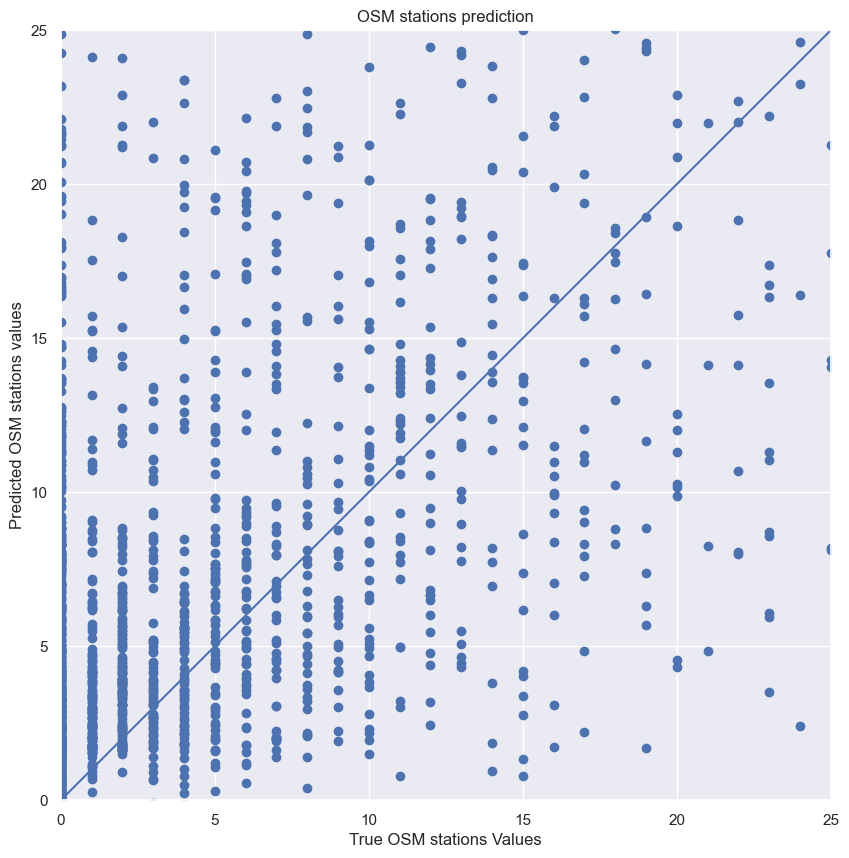

In [707]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations Values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM stations prediction')
lims = [0, 25]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

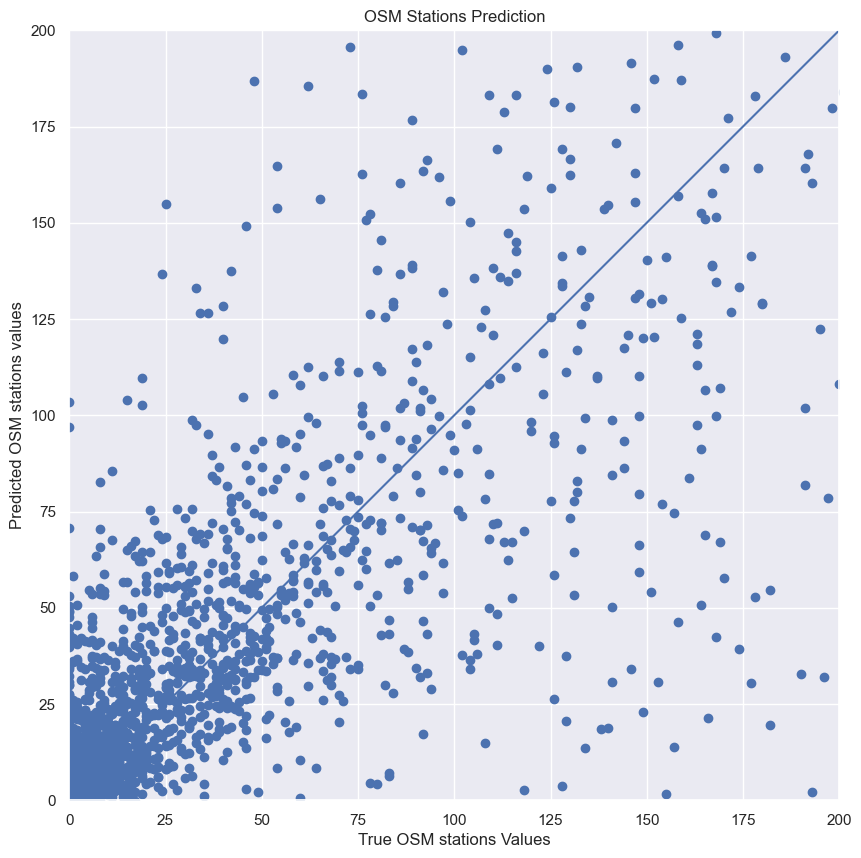

In [255]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations Values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM Stations Prediction')
lims = [0, 200]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

In [407]:
Y_test_predictions.head()

,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
23,47.478303,11.955376,18.940801,1540.917690,2.049671,65.680135,3.114737,-1.063754,-15.891227,-0.155376,7.409724
704,79.139167,80.764569,4.135116,1302.683489,2.475564,138.204796,12.502895,2.035745,21.856160,3.693732,7.273774
825,59.959773,47.679889,22.081855,947.536187,3.224623,120.047952,9.682704,1.459656,9.714222,3.381197,6.679055
401,96.667760,83.711861,33.315527,1900.625939,6.128366,137.872852,20.399203,-0.622826,18.746270,8.543357,5.041121
411,67.746400,30.044169,7.226364,359.789450,4.243221,88.209316,5.676300,2.429577,7.025669,5.474897,3.486364


#### Error Distribution Calculation

Text(0, 0.5, 'count')

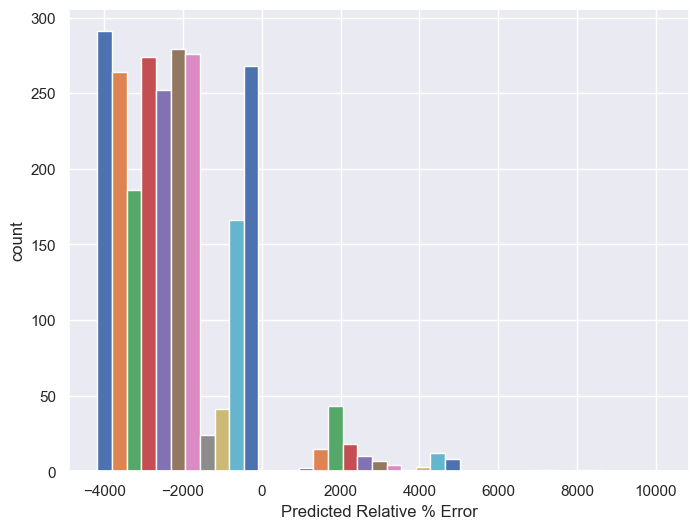

In [711]:
# Calculating the error distribution

# The error you are encountering is because the error_lasso variable contains some inf values (infinity). 
# When plotting with matplotlib's hist function, you need to supply a finite range for the x-axis, 
# but the range of error_lasso is not finite because of the inf values.
# To resolve this issue, you need to remove or replace the inf values in error_lasso. 
# For example, you could replace them with NaN values, which can be ignored in the plot:

error_lasso = (Y_test_predictions - y_test)/y_test*100
error_lasso[np.isinf(error_lasso)] = np.nan
plt.hist(error_lasso, bins=3)
plt.xlabel('Predicted Relative % Error')
plt.ylabel('count')

#### Tuning Hyperparameters

        Here it can be seen that the model fails! So, is it possible to improve the model outcome? We can tune the hyperparameter alpha and use grid search to sweep possible values.

        For that purpose, we will use GridSearchCV of scikit learn: we will give the list of hyperparameters and it will use CV to test possible combinations. Here we only have one parameter to play with.

In [701]:
# create a Lasso regressor object
lasso_reg = Lasso(max_iter = max_iter, tol = tol, random_state = random_state, selection = selection)

# create a MultiOutputRegressor object
multi_regressor = MultiOutputRegressor(lasso_reg)

# define a grid of hyperparameters to search
param_grid = {'estimator__alpha': [-4, 0, 1.0, 2.0, 5.0, 10, 15, 20, 25, 30, 35, 40, 45, 50]}

# create a GridSearchCV object
grid_search = GridSearchCV(multi_regressor, param_grid, scoring='r2', cv=k_fold, refit=True)

# fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# get the results 
results = grid_search.cv_results_
# get the best hyperparameters from the grid search
print("Best Hyperparameters: ", grid_search.best_params_)
# Perform the grid search
print('Best R^2 obtained:', grid_search.best_score_)

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\multioutput.py:49: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X, y, **fit_params)
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.596e+06, tolerance: 1.387e+02 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  m

Best Hyperparameters:  {'estimator__alpha': 25}
Best R^2 obtained: 0.4552054505437795


In [702]:
#Lets check the keys to plot them:
results.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_estimator__alpha', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

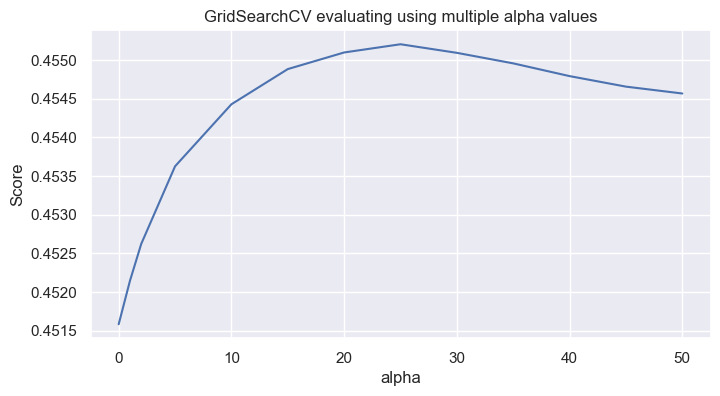

In [704]:
# Plotting the results
plt.figure(figsize=(8, 4))
plt.title("GridSearchCV evaluating using multiple alpha values",
          fontsize=12)
plt.xlabel("alpha")
plt.ylabel("Score")
# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_estimator__alpha'].data, dtype=float)
Y_axis = np.array(results['mean_test_score'].data, dtype=float)
plt.plot(X_axis,Y_axis)
plt.show()

#### Learning curve

In [712]:
# # Defining our function to run the model and see the evolution of error>
# def plot_learning_curves(model, X_train, X_test, y_train, y_test):
#   #Empty lists for data storage:
#   train_errors, val_errors = [], []
#   # Remember, we will look at the error as model is trained with more data.
#   # So we will make predictions with increasing instance sizes for both the training set and test set.
#   for m in range(1, len(X_train)):
#     #Model fitting:
#     model.fit(X_train[:m], y_train[:m])
#     #Predicting for the training data:
#     y_train_predict = model.predict(X_train[:m])
#     #Predicting for the test data:
#     y_test_predict = model.predict(X_test)
#     #Saving the errors for the plot for a given data size:
#     train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
#     val_errors.append(mean_squared_error(y_test, y_test_predict))
  
#   # Plotting the results:
#   plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
#   plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
#   plt.legend()
#   plt.xlim(0, 50),  plt.ylim(0.01,50)
#   plt.yscale("log")
#   plt.xlabel("Instances"),  plt.ylabel("MSE")
  
# # Calling our function to draw the learning curve for elastic net:
# plot_learning_curves(model,X_train, X_test, y_train, y_test) 

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisati

### Hypothesis III --> Spatial Disaggregation of OSM Stations for  Germany

        Disaggregation of OSM fuel stations from Country Level to NUTS3 level using OSM Network data, Freight traffic Flow, Vehicle Stock, population, GVA and number of business at NUTS3 level for Germany.  

        - Input data:

                * OSM data Stations NUTSO:
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'
        
                * OSM data Network NUTS3:
                        'bicycle_network_value'
                        'bus_network_value'
                        'railways_network_value'
                        'road_major_network_value'
                        'shipping_network_value',

                * Freight traffic Flow at NUTS3 level:
                        'Distance_from_origin_region_to_E_road', 
                        'Distance_within_E_road', 
                        'Distance_from_E_road_to_destination_region', 
                        'Total_distance'
                        'Traffic_flow_trucks_2010',
                        'Traffic_flow_trucks_2019', 
                        'Traffic_flow_trucks_2030',
                        'Traffic_flow_tons_2010', 
                        'Traffic_flow_tons_2019',
                        'Traffic_flow_tons_2030'

                * Vehicle Stock at NUTS3 level:
                        'Motorcylces', 
                        'Agricultural Tractors',
                        'Buses', 
                        'Passenger Vehicles', 
                        ' Motor Vehicles Other',
                        ' Motor Vehicles Total', 
                        'Load Force Wagons', 
                        ' Trailers Other',
                        'Trailers Total'
                
                * Socio-Economic Data at NUTS3 level:        
                        'gva_value', 
                        'population_value', 
                        'business_value'

        - Output Data (target data):

                * OSM data Stations NUTSO "Disaggregated data":
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'

#### Prepearing the data set for the model 

In [344]:
df_nuts3 = train_data_NUTS3_DE[[
'NUTS0_region_code', 'NUTS3_region_code', 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value'
]]
df_country = train_data_NUTS0_DE[[
'NUTS0_region_code', 
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'
]]
df = pd.merge(df_nuts3, df_country, how='left', on='NUTS0_region_code')

In [292]:
len(df_nuts3)

401

##### check again NaN values

###### input Data

In [294]:
nan_values = np.isnan(df[[
       'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'Motorcylces', 'Agricultural Tractors', 'Buses', 
                            'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
                            'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                                   'gva_value', 
                                   'population_value', 
                                   'business_value',
                                          'fuel_stations_value', 'charging_stations_value',
                                          'bicycle_stations_value', 'bus_stations_value',
                                          'airport_stations_value', 'railway_station_value',
                                          'train_station_value', 'subway_station_value',
                                          'lightrail_station_value', 'shipping_station_value',
                                          'helicopter_station_value' 
       ]]).sum()

In [295]:
nan_values

bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
Distance_from_origin_region_to_E_road         0
Distance_within_E_road                        0
Distance_from_E_road_to_destination_region    0
Total_distance                                0
Traffic_flow_trucks_2010                      0
Traffic_flow_trucks_2019                      0
Traffic_flow_trucks_2030                      0
Traffic_flow_tons_2010                        0
Traffic_flow_tons_2019                        0
Traffic_flow_tons_2030                        0
Motorcylces                                   0
Agricultural Tractors                         0
Buses                                         0
Passenger Vehicles                            0
 Motor Vehicles Other                         0
 Motor Vehicles Total                   

In [272]:
df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [273]:
df.sample(5)

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
328,DE,DEC02,0.0,0.0,97110.607492,436837.773251,0.0,7.0,1277.268215,133.622098,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
45,DE,DE949,0.0,0.0,0.000000,0.000000,0.0,9.0,1410.612526,121.734343,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
129,DE,DE22A,0.0,0.0,0.000000,0.000000,0.0,18.0,1271.935843,141.777588,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
194,DE,DE916,0.0,0.0,0.000000,0.000000,0.0,23.0,1171.209828,129.141186,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
229,DE,DE113,0.0,0.0,0.000000,0.000000,0.0,3.0,1262.011445,123.685980,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


###### Target data

In [306]:
nan_values = np.isnan(train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'  
]]).sum()

In [297]:
nan_values

fuel_stations_value         0
charging_stations_value     0
bicycle_stations_value      0
bus_stations_value          0
airport_stations_value      0
railway_station_value       0
train_station_value         0
subway_station_value        0
lightrail_station_value     0
shipping_station_value      0
helicopter_station_value    0
dtype: int64

In [298]:
len(train_data_NUTS3_DE)

401

##### Defining the input and target variable

In [345]:
#  Prepearing data input
dataX = df[[ 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value',
                            'fuel_stations_value', 'charging_stations_value',
                            'bicycle_stations_value', 'bus_stations_value',
                            'airport_stations_value', 'railway_station_value',
                            'train_station_value', 'subway_station_value',
                            'lightrail_station_value', 'shipping_station_value',
                            'helicopter_station_value'
]].copy()
dataY = train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'
]].copy()

        Divide the entire dataset into fractions to have a training set from which the machine learning algorithm learns. Also it is needed another set to test the predictions of the ML algorithm. There is no golden rule here: need to consider the size of the entire dataset. Sometimes 5% is more than enough, sometimes it is needed to divide 1/3 to have enough test samples.

In [346]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [347]:
X_train.columns

Index(['bicycle_network_value', 'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030', 'Motorcylces',
       'Agricultural Tractors', 'Buses', 'Passenger Vehicles',
       ' Motor Vehicles Other', ' Motor Vehicles Total', 'Load Force Wagons',
       ' Trailers Other', 'Trailers Total', 'gva_value', 'population_value',
       'business_value', 'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value

In [301]:
y_train.columns

Index(['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

#### Normalization

In [348]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
count,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,...,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0
mean,7.087708e-17,-2.214909e-18,-5.315781e-17,1.151753e-16,-1.328945e-17,7.087708e-17,2.281356e-16,-1.107454e-16,2.170611e-16,-1.373243e-16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-1.021628e+00,-2.956462e+00,-2.099951e+00,-2.913685e+00,-1.095747e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-6.347679e-01,-3.291813e-01,1.067024e-01,-1.432554e-01,-5.949253e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-3.446226e-01,2.688071e-01,3.179313e-01,3.006220e-01,-2.425328e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,3.323833e-01,6.664594e-01,5.707941e-01,6.186400e-01,2.194994e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.520168e+01,1.546343e+01,6.203096e+00,5.216320e+00,1.123521e+01,6.909012e+00,2.080656e+00,1.520826e+00,2.014643e+00,9.998414e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Cross-Validation
        Another rule of thumb is to split the training set into a sub-training sets and a validation set before seeing its true performance on the test set (25% of the dataset reserved above). This policy is called k-fold cross-validation. The training data is divided into k fractions, trained over (k-1) fractions and tested on the k_th. Here the idea is to increase the generalization of the model as much as possible.
        
        https://scikit-learn.org/stable/modules/cross_validation.html

In [349]:
k_fold = KFold(n_splits=5, shuffle=True, random_state=2020)

#### How to calculate the performance?
        In any supervised approach, it is needed to select a cost function to compare ML predictions with the true values (labels). The ML algorithm will minimize the cost function by changing its fitting parameters. Some time should be spent to define what might be the best cost function for the data set and the objective.

        In this case, as it is been dealed with regression, it can be used with built-in error functions:

        https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

#### Model Development

In [350]:
# Hyperparameters:
alpha=600 #alpha = 0 is equivalent to an ordinary least square but it is not recommended to put zero here!
# normalize=False #
max_iter=40000
tol=0.0001
random_state = 2020 # to make the results reproduceble. 
selection='cyclic' # (setting to ‘random’) often leads to significantly faster convergence especially when tol is higher than 1e-4.

lasso_MultiOutputRegressor = MultiOutputRegressor(Lasso(alpha=alpha, max_iter = max_iter, tol = tol, random_state = random_state, selection = selection))

In [351]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])
# print(predictionsBasedOnKFolds)
# print("X_train shape:", predictionsBasedOnKFolds.shape)
model = lasso_MultiOutputRegressor

#kfold.split will generate indices to split data into training and test set (cv):
# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.values):
# k_fold.split gives as the number of iterations (in this case 1169 are going to be splited into 5 kfolds 
# and the 20 % rest is going to the cross validation check)

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)
scoreLasso = model.score(X_train,y_train)
print('-----------------------------------')
print('Lasso Score: ', scoreLasso)
print('-----------------------------------')

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.392e+06, tolerance: 1.018e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5815010333013301
CV Score:  0.5577654442678383


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.297e+06, tolerance: 1.208e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.724901546744706
CV Score:  -87.05775197634992


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.201e+06, tolerance: 1.190e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.728615821478309
CV Score:  -0.12160410293206407


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.268e+06, tolerance: 1.203e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7393225211136898
CV Score:  -3.4138126146684558


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.217e+06, tolerance: 1.108e+04
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7126162120417227
CV Score:  0.08805120828750836
-----------------------------------
Lasso Score:  0.6832128810751507
-----------------------------------


        If the performance is much worse for CV, then it is overfitting. If they are both bad, then it is probably underfitting the data and we need more complex models.

In [313]:
# Test Problem:
test_data = df.sample(1,random_state=11).copy()
test_data

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,DE,DE26C,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [314]:
# Preparing the input data:
x_testing = test_data.drop(['NUTS0_region_code', 'NUTS3_region_code'],axis=1)

In [315]:
x_testing.head()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,787.343496,259.833587,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [316]:
# Calling model for the prediction:
lasso_MultiOutputRegressor.predict(x_testing)

array([[ 41.30854428,  37.25452487,  -2.54620547, 600.83380064,
          2.56894481,  64.82679821,   6.4981098 ,  -1.36577209,
         -1.86673774,   1.95241498,   4.66756841]])

#### Accurracy Visualization

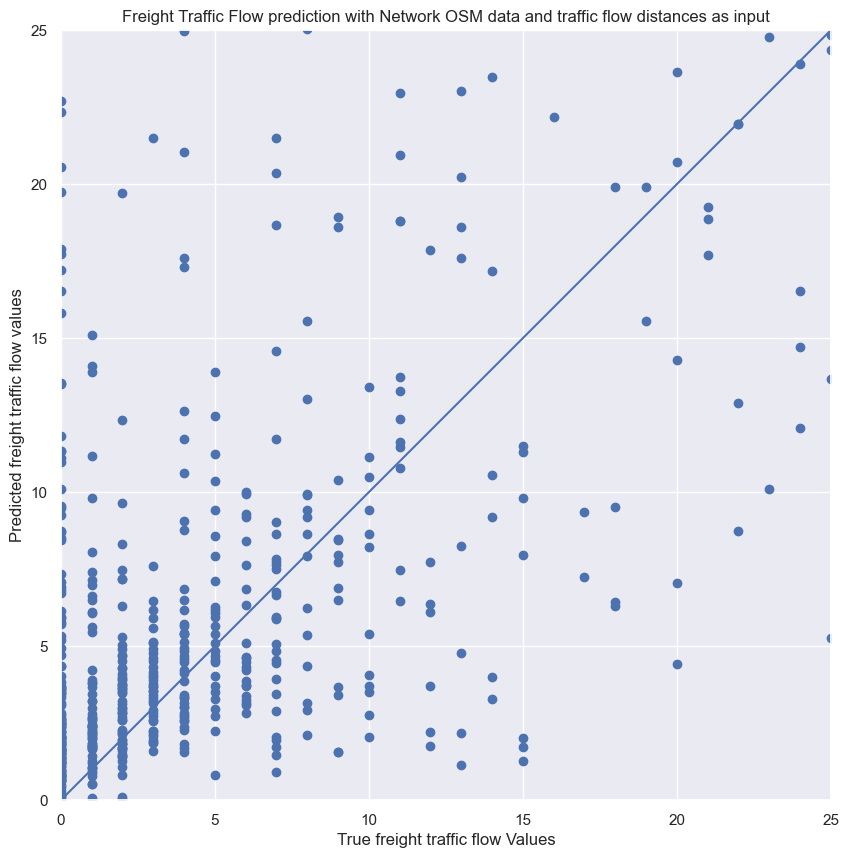

In [317]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True freight traffic flow Values')
plt.ylabel('Predicted freight traffic flow values')
plt.title('Freight Traffic Flow prediction with Network OSM data and traffic flow distances as input')
lims = [0, 25]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

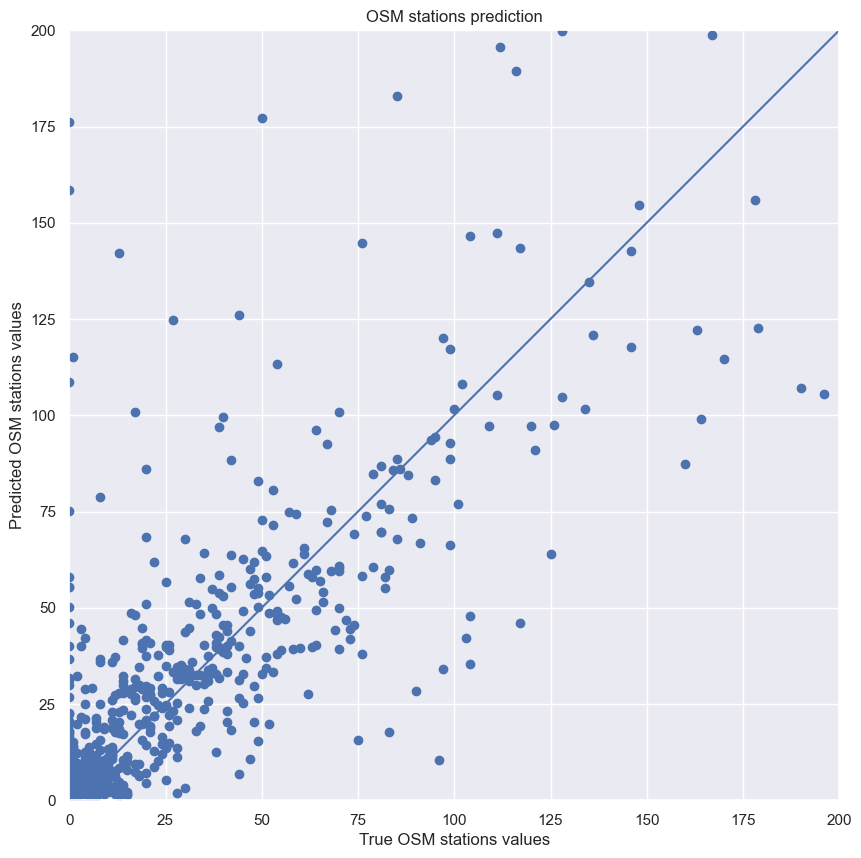

In [352]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(lasso_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM stations values')
plt.ylabel('Predicted OSM stations values')
plt.title('OSM stations prediction')
lims = [0, 200]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

In [388]:
Y_test_predictions.head()

,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
2,90.837569,231.416827,135.863679,1428.328604,0.626690,637.354477,30.373684,29.705491,237.665824,3.397169,13.009920
190,73.783465,51.110299,17.224536,1014.118560,3.652173,306.000506,15.902984,7.748899,79.072870,10.731867,10.457243
302,57.265283,75.486579,26.280268,1037.938478,1.853243,180.832352,10.791546,3.940352,52.740105,0.969925,6.041467
257,54.767178,47.960992,9.607300,1200.602437,2.103537,24.376120,6.945861,-2.091973,-11.187129,3.352093,5.763476
208,39.163558,35.593772,6.252520,650.828193,0.983010,115.680454,5.409870,-0.592089,33.711505,3.242904,4.659845


#### Error Distribution Calculation

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6709: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6710: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

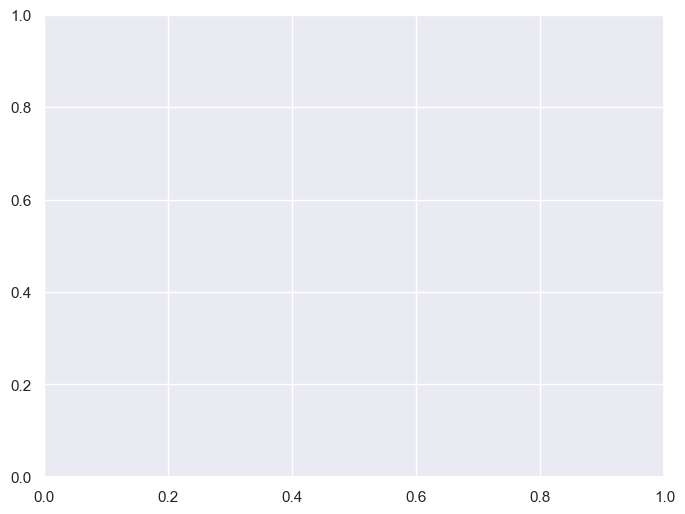

In [163]:
# Calculating the error distribution

# The error you are encountering is because the error_lasso variable contains some inf values (infinity). 
# When plotting with matplotlib's hist function, you need to supply a finite range for the x-axis, 
# but the range of error_lasso is not finite because of the inf values.
# To resolve this issue, you need to remove or replace the inf values in error_lasso. 
# For example, you could replace them with NaN values, which can be ignored in the plot:

error_lasso = (Y_test_predictions - y_test)/y_test*100
error_lasso[np.isinf(error_lasso)] = np.nan
plt.hist(error_lasso, bins=3)
plt.xlabel('Predicted Relative % Error')
plt.ylabel('count')

#### Tuning Hyperparameters

        Here it can be seen that the model fails! So, is it possible to improve the model outcome? We can tune the hyperparameter alpha and use grid search to sweep possible values.

        For that purpose, we will use GridSearchCV of scikit learn: we will give the list of hyperparameters and it will use CV to test possible combinations. Here we only have one parameter to play with.

In [145]:
# create a Lasso regressor object
lasso_reg = Lasso(max_iter = max_iter, tol = tol, random_state = random_state, selection = selection)

# create a MultiOutputRegressor object
multi_regressor = MultiOutputRegressor(lasso_reg)

# define a grid of hyperparameters to search
param_grid = {'estimator__alpha': [-4, 0, 1, 10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]}

# create a GridSearchCV object
grid_search = GridSearchCV(multi_regressor, param_grid, scoring='r2', cv=k_fold, refit=True)

# fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# get the results 
results = grid_search.cv_results_
# get the best hyperparameters from the grid search
print("Best Hyperparameters: ", grid_search.best_params_)
# Perform the grid search
print('Best R^2 obtained:', grid_search.best_score_)

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\multioutput.py:49: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X, y, **fit_params)
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.113e+04, tolerance: 1.815e+01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  m

Best Hyperparameters:  {'estimator__alpha': 600}
Best R^2 obtained: -17.98947040827902


In [139]:
#Lets check the keys to plot them:
results.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_estimator__alpha', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

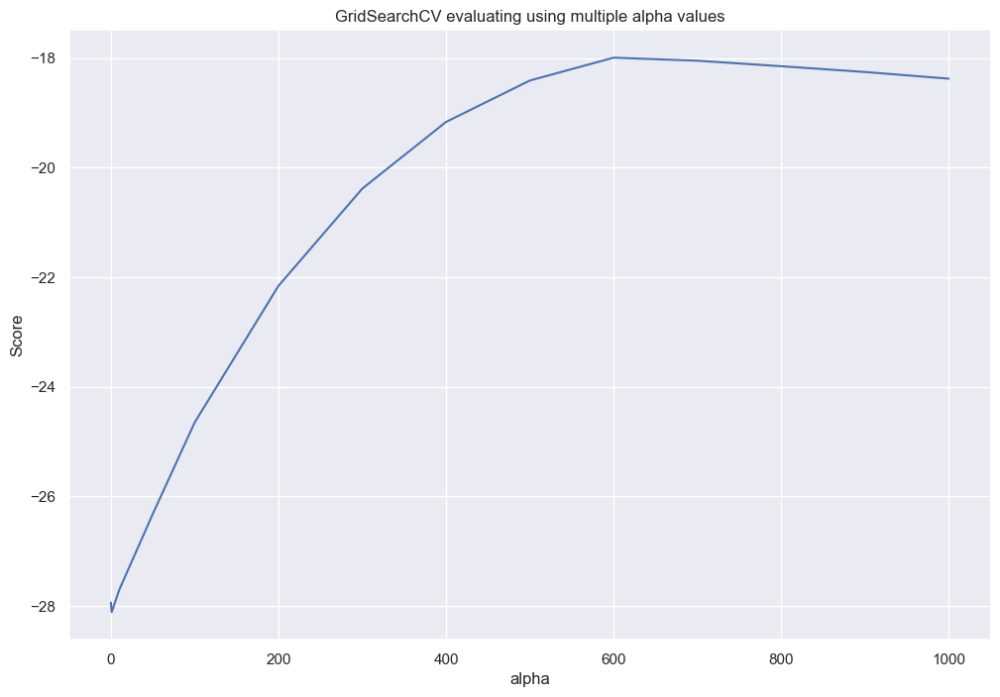

In [147]:
# Plotting the results
plt.figure(figsize=(12, 8))
plt.title("GridSearchCV evaluating using multiple alpha values",
          fontsize=12)
plt.xlabel("alpha")
plt.ylabel("Score")
# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_estimator__alpha'].data, dtype=float)
Y_axis = np.array(results['mean_test_score'].data, dtype=float)
plt.plot(X_axis,Y_axis)
plt.show()

#### Learning curve

In [ ]:
# # Defining our function to run the model and see the evolution of error>
# def plot_learning_curves(model, X_train, X_test, y_train, y_test):
#   #Empty lists for data storage:
#   train_errors, val_errors = [], []
#   # Remember, we will look at the error as model is trained with more data.
#   # So we will make predictions with increasing instance sizes for both the training set and test set.
#   for m in range(1, len(X_train)):
#     #Model fitting:
#     model.fit(X_train[:m], y_train[:m])
#     #Predicting for the training data:
#     y_train_predict = model.predict(X_train[:m])
#     #Predicting for the test data:
#     y_test_predict = model.predict(X_test)
#     #Saving the errors for the plot for a given data size:
#     train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
#     val_errors.append(mean_squared_error(y_test, y_test_predict))
  
#   # Plotting the results:
#   plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
#   plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
#   plt.legend()
#   plt.xlim(0, 50),  plt.ylim(0.01,50)
#   plt.yscale("log")
#   plt.xlabel("Instances"),  plt.ylabel("MSE")
  
# # Calling our function to draw the learning curve for elastic net:
# plot_learning_curves(model,X_train, X_test, y_train, y_test) 

## Elastic Net

        Elastic Net is another linear regression model that can be used with regularization. In this case, we have two terms for the job: the model is trained with both l1 and l2-norm regularization of the coefficients. It allows to train a sparse model similar to Lasso, while still maintaining the properties of an older approach called Ridge

        The hyperparameters of the model are the 'alpha' and 'l1_ratio'.

### Hypothesis III --> Spatial Disaggregation of OSM Stations for  Germany

        Disaggregation of OSM fuel stations from Country Level to NUTS3 level using OSM Network data, Freight traffic Flow, Vehicle Stock, population, GVA and number of business at NUTS3 level for Germany.  

        - Input data:

                * OSM data Stations NUTSO:
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'
        
                * OSM data Network NUTS3:
                        'bicycle_network_value'
                        'bus_network_value'
                        'railways_network_value'
                        'road_major_network_value'
                        'shipping_network_value',

                * Freight traffic Flow at NUTS3 level:
                        'Distance_from_origin_region_to_E_road', 
                        'Distance_within_E_road', 
                        'Distance_from_E_road_to_destination_region', 
                        'Total_distance'
                        'Traffic_flow_trucks_2010',
                        'Traffic_flow_trucks_2019', 
                        'Traffic_flow_trucks_2030',
                        'Traffic_flow_tons_2010', 
                        'Traffic_flow_tons_2019',
                        'Traffic_flow_tons_2030'

                * Vehicle Stock at NUTS3 level:
                        'Motorcylces', 
                        'Agricultural Tractors',
                        'Buses', 
                        'Passenger Vehicles', 
                        ' Motor Vehicles Other',
                        ' Motor Vehicles Total', 
                        'Load Force Wagons', 
                        ' Trailers Other',
                        'Trailers Total'
                
                * Socio-Economic Data at NUTS3 level:        
                        'gva_value', 
                        'population_value', 
                        'business_value'

        - Output Data (target data):

                * OSM data Stations NUTSO "Disaggregated data":
                        'fuel_stations_value'
                        'charging_stations_value'
                        'bicycle_stations_value'
                        'bus_stations_value',
                        'airport_stations_value'
                        'railway_station_value'
                        'train_station_value'
                        'subway_station_value',
                        'lightrail_station_value'
                        'shipping_station_value',
                        'helicopter_station_value'

#### Prepearing the data set for the model 

In [353]:
df_nuts3 = train_data_NUTS3_DE[[
'NUTS0_region_code', 'NUTS3_region_code', 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value'
]]
df_country = train_data_NUTS0_DE[[
'NUTS0_region_code', 
       'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'
]]
df = pd.merge(df_nuts3, df_country, how='left', on='NUTS0_region_code')

In [178]:
len(df_nuts3)

401

##### check again NaN values

###### input Data

In [341]:
nan_values = np.isnan(df[[
       'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
              'road_major_network_value', 'shipping_network_value',
                     'Distance_from_origin_region_to_E_road',
                     'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
                     'Total_distance', 'Traffic_flow_trucks_2010',
                     'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
                     'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
                     'Traffic_flow_tons_2030', 
                            'Motorcylces', 'Agricultural Tractors', 'Buses', 
                            'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
                            'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                                   'gva_value', 
                                   'population_value', 
                                   'business_value',
                                          'fuel_stations_value', 'charging_stations_value',
                                          'bicycle_stations_value', 'bus_stations_value',
                                          'airport_stations_value', 'railway_station_value',
                                          'train_station_value', 'subway_station_value',
                                          'lightrail_station_value', 'shipping_station_value',
                                          'helicopter_station_value' 
       ]]).sum()

In [167]:
nan_values

bicycle_network_value                         0
bus_network_value                             0
railways_network_value                        0
road_major_network_value                      0
shipping_network_value                        0
Distance_from_origin_region_to_E_road         0
Distance_within_E_road                        0
Distance_from_E_road_to_destination_region    0
Total_distance                                0
Traffic_flow_trucks_2010                      0
Traffic_flow_trucks_2019                      0
Traffic_flow_trucks_2030                      0
Traffic_flow_tons_2010                        0
Traffic_flow_tons_2019                        0
Traffic_flow_tons_2030                        0
Motorcylces                                   0
Agricultural Tractors                         0
Buses                                         0
Passenger Vehicles                            0
 Motor Vehicles Other                         0
 Motor Vehicles Total                   

In [168]:
df[df.isna().any(axis=1)]

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value


In [ ]:
df.sample(5)

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
56,DE,DE247,0.000000,0.0,0.000000,0.000000e+00,0.0,23.371486,1394.893219,105.587393,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
100,DE,DE238,0.000000,0.0,0.000000,0.000000e+00,0.0,3.000000,1229.222479,130.123941,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
344,DE,DEA16,0.000000,0.0,0.000000,0.000000e+00,0.0,5.000000,1219.514680,141.497409,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
186,DE,DE724,0.000000,0.0,0.000000,0.000000e+00,0.0,23.000000,1174.651311,120.677534,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0
249,DE,DED2E,15299.917114,0.0,550036.301684,1.312140e+06,0.0,15.564283,1217.983464,137.383216,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


###### Target data

In [342]:
nan_values = np.isnan(train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'  
]]).sum()

In [343]:
nan_values

fuel_stations_value         0
charging_stations_value     0
bicycle_stations_value      0
bus_stations_value          0
airport_stations_value      0
railway_station_value       0
train_station_value         0
subway_station_value        0
lightrail_station_value     0
shipping_station_value      0
helicopter_station_value    0
dtype: int64

In [ ]:
len(train_data_NUTS3_DE)

401

##### Defining the input and target variable

In [354]:
#  Prepearing data input
dataX = df[[ 
'bicycle_network_value', 'bus_network_value', 'railways_network_value', 
'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road',
       'Distance_within_E_road', 'Distance_from_E_road_to_destination_region',
       'Total_distance', 'Traffic_flow_trucks_2010',
       'Traffic_flow_trucks_2019', 'Traffic_flow_trucks_2030',
       'Traffic_flow_tons_2010', 'Traffic_flow_tons_2019',
       'Traffic_flow_tons_2030', 
              'Motorcylces', 'Agricultural Tractors', 'Buses', 
              'Passenger Vehicles', ' Motor Vehicles Other', ' Motor Vehicles Total', 
              'Load Force Wagons', ' Trailers Other', 'Trailers Total', 
                     'gva_value', 
                     'population_value', 
                     'business_value',
                            'fuel_stations_value', 'charging_stations_value',
                            'bicycle_stations_value', 'bus_stations_value',
                            'airport_stations_value', 'railway_station_value',
                            'train_station_value', 'subway_station_value',
                            'lightrail_station_value', 'shipping_station_value',
                            'helicopter_station_value'
]].copy()
dataY = train_data_NUTS3_DE[[
'fuel_stations_value', 'charging_stations_value',
'bicycle_stations_value', 'bus_stations_value',
'airport_stations_value', 'railway_station_value',
'train_station_value', 'subway_station_value',
'lightrail_station_value', 'shipping_station_value',
'helicopter_station_value'
]].copy()

        Divide the entire dataset into fractions to have a training set from which the machine learning algorithm learns. Also it is needed another set to test the predictions of the ML algorithm. There is no golden rule here: need to consider the size of the entire dataset. Sometimes 5% is more than enough, sometimes it is needed to divide 1/3 to have enough test samples.

In [355]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [181]:
X_train.columns

Index(['bicycle_network_value', 'bus_network_value', 'railways_network_value',
       'road_major_network_value', 'shipping_network_value',
       'Distance_from_origin_region_to_E_road', 'Distance_within_E_road',
       'Distance_from_E_road_to_destination_region', 'Total_distance',
       'Traffic_flow_trucks_2010', 'Traffic_flow_trucks_2019',
       'Traffic_flow_trucks_2030', 'Traffic_flow_tons_2010',
       'Traffic_flow_tons_2019', 'Traffic_flow_tons_2030', 'Motorcylces',
       'Agricultural Tractors', 'Buses', 'Passenger Vehicles',
       ' Motor Vehicles Other', ' Motor Vehicles Total', 'Load Force Wagons',
       ' Trailers Other', 'Trailers Total', 'gva_value', 'population_value',
       'business_value', 'fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value

In [ ]:
y_train.columns

Index(['fuel_stations_value', 'charging_stations_value',
       'bicycle_stations_value', 'bus_stations_value',
       'airport_stations_value', 'railway_station_value',
       'train_station_value', 'subway_station_value',
       'lightrail_station_value', 'shipping_station_value',
       'helicopter_station_value'],
      dtype='object')

#### Normalization

In [356]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
count,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,4.010000e+02,...,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0,401.0
mean,7.087708e-17,-2.214909e-18,-5.315781e-17,1.151753e-16,-1.328945e-17,7.087708e-17,2.281356e-16,-1.107454e-16,2.170611e-16,-1.373243e-16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,1.001249e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-1.021628e+00,-2.956462e+00,-2.099951e+00,-2.913685e+00,-1.095747e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-6.347679e-01,-3.291813e-01,1.067024e-01,-1.432554e-01,-5.949253e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,-3.446226e-01,2.688071e-01,3.179313e-01,3.006220e-01,-2.425328e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,-1.808551e-01,-1.035406e-01,-4.260527e-01,-4.166658e-01,-1.413040e-01,3.323833e-01,6.664594e-01,5.707941e-01,6.186400e-01,2.194994e-01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.520168e+01,1.546343e+01,6.203096e+00,5.216320e+00,1.123521e+01,6.909012e+00,2.080656e+00,1.520826e+00,2.014643e+00,9.998414e+00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Cross-Validation
        Another rule of thumb is to split the training set into a sub-training sets and a validation set before seeing its true performance on the test set (25% of the dataset reserved above). This policy is called k-fold cross-validation. The training data is divided into k fractions, trained over (k-1) fractions and tested on the k_th. Here the idea is to increase the generalization of the model as much as possible.
        
        https://scikit-learn.org/stable/modules/cross_validation.html

In [357]:
k_fold = KFold(n_splits=5, shuffle=True, random_state=2020)

#### How to calculate the performance?
        In any supervised approach, it is needed to select a cost function to compare ML predictions with the true values (labels). The ML algorithm will minimize the cost function by changing its fitting parameters. Some time should be spent to define what might be the best cost function for the data set and the objective.

        In this case, as it is been dealed with regression, it can be used with built-in error functions:

        https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

#### Model Development

In [365]:
# Hyperparameters:
#https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html
alpha=1000 #alpha = 0 is equivalent to an ordinary least square but it is not recommended to put zero here!
l1_ratio=0.66666666666666666 # This is new!!
# normalize=False #
max_iter=20000
tol=0.00001
random_state = 2020
selection='cyclic' # (setting to ‘random’) often leads to significantly faster convergence especially when tol is higher than 1e-4.

elastic_net_MultiOutputRegressor = MultiOutputRegressor(ElasticNet(alpha=alpha, l1_ratio = l1_ratio, max_iter = max_iter, tol = tol, random_state = random_state, selection = selection))

In [366]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])
# print(predictionsBasedOnKFolds)
# print("X_train shape:", predictionsBasedOnKFolds.shape)
model = elastic_net_MultiOutputRegressor

#kfold.split will generate indices to split data into training and test set (cv):
# print("X_train shape:", X_train.shape)
# print("y_train shape:", y_train.shape)
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.values):
# k_fold.split gives as the number of iterations (in this case 1169 are going to be splited into 5 kfolds 
# and the 20 % rest is going to the cross validation check)

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)
scoreElasticNet = model.score(X_train,y_train)
print('-----------------------------------')
print('Elastic Net Score: ', scoreElasticNet)
print('-----------------------------------')

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.730e+06, tolerance: 1.018e+03
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.5803317508533519
CV Score:  0.5590115388049628


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.629e+06, tolerance: 1.208e+03
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.099e+05, tolerance: 7.960e+01
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7239615998018779
CV Score:  -87.22743966071775


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.475e+06, tolerance: 1.190e+03
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7281319544191497
CV Score:  -0.11707938980450594


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.509e+06, tolerance: 1.203e+03
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7383347360857524
CV Score:  -3.4120369567521918


c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.507e+06, tolerance: 1.108e+03
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.961e+02, tolerance: 7.610e+01
  model = cd_fast.enet_coordinate_descent(


Training Score:  0.7120097499682234
CV Score:  0.08775746571550097
-----------------------------------
Elastic Net Score:  0.6825993597970191
-----------------------------------


        If the performance is much worse for CV, then it is overfitting. If they are both bad, then it is probably underfitting the data and we need more complex models.

In [188]:
# Test Problem:
test_data = df.sample(1,random_state=11).copy()
test_data

,NUTS0_region_code,NUTS3_region_code,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,DE,DE26C,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [189]:
# Preparing the input data:
x_testing = test_data.drop(['NUTS0_region_code', 'NUTS3_region_code'],axis=1)

In [190]:
x_testing.head()

,bicycle_network_value,bus_network_value,railways_network_value,road_major_network_value,shipping_network_value,Distance_from_origin_region_to_E_road,Distance_within_E_road,Distance_from_E_road_to_destination_region,Total_distance,Traffic_flow_trucks_2010,...,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
276,0.0,0.0,0.0,0.0,0.0,4.0,770.621951,12.721545,787.343496,259.833587,...,20321.0,4611.0,376987.0,926.0,43205.0,3642.0,706.0,6085.0,1138.0,2241.0


In [191]:
# Calling model for the prediction:
elastic_net_MultiOutputRegressor.predict(x_testing)

array([[ 36.48040347,  33.09087155,  -3.34319526, 634.54959383,
          2.87961764,  47.36485367,   6.43096353,  -0.80897323,
         -2.7715101 ,   1.85061546,   3.55147136]])

#### Accurracy Visualization

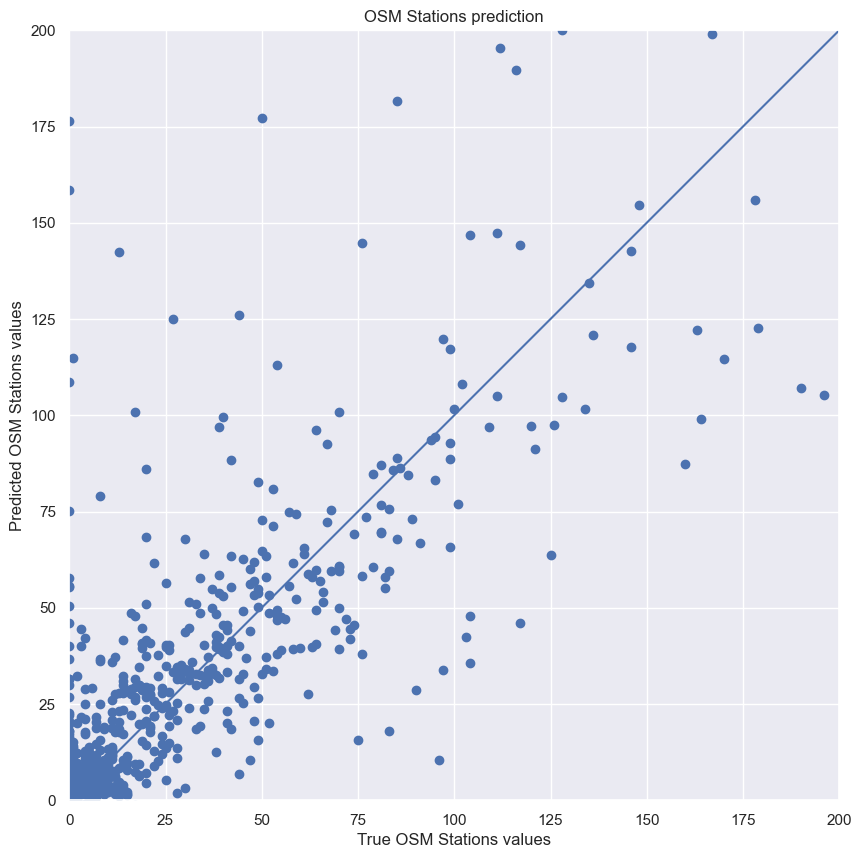

In [360]:
# Calling trained model for predictons:
Y_test_predictions = pd.DataFrame(elastic_net_MultiOutputRegressor.predict(X_test),index=X_test.index)
Y_test_predictions.columns = y_test.columns
# Visualization of the accuracy:
fig_1 = plt.figure(figsize=(16, 10)) 
a = plt.axes(aspect='equal')
plt.scatter(y_test, Y_test_predictions)
plt.xlabel('True OSM Stations values')
plt.ylabel('Predicted OSM Stations values')
plt.title('OSM Stations prediction')
lims = [0, 200]
plt.xlim(lims), plt.ylim(lims)
plt.plot(lims, lims)

In [195]:
Y_test_predictions.head()

,fuel_stations_value,charging_stations_value,bicycle_stations_value,bus_stations_value,airport_stations_value,railway_station_value,train_station_value,subway_station_value,lightrail_station_value,shipping_station_value,helicopter_station_value
2,91.073902,231.736244,135.968682,1429.068726,0.717250,637.988695,30.510138,29.716078,237.886861,3.437071,13.043379
190,73.742070,50.915896,17.165814,1016.150981,3.732615,305.266517,16.051990,7.781472,78.604907,10.791025,10.547536
302,56.652929,74.728142,26.176545,1019.129524,1.855545,181.422261,10.998754,4.143534,53.178564,1.087398,6.003643
257,55.027114,48.659526,9.893528,1195.066326,2.083112,26.725625,6.792207,-2.072008,-10.116360,3.351469,5.652955
208,38.760395,34.866599,6.107740,644.767517,0.989593,114.583927,5.521607,-0.506882,33.334990,3.262265,4.702403


#### Error Distribution Calculation

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6709: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\matplotlib\axes\_axes.py:6710: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

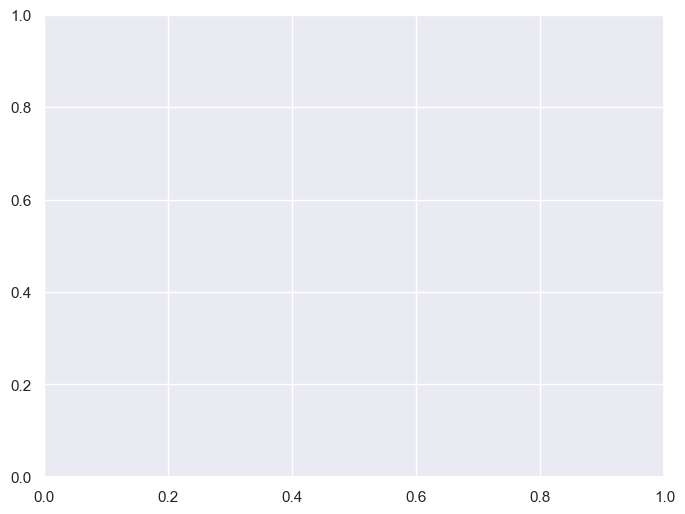

In [339]:
# Calculating the error distribution

# The error you are encountering is because the error_lasso variable contains some inf values (infinity). 
# When plotting with matplotlib's hist function, you need to supply a finite range for the x-axis, 
# but the range of error_lasso is not finite because of the inf values.
# To resolve this issue, you need to remove or replace the inf values in error_lasso. 
# For example, you could replace them with NaN values, which can be ignored in the plot:

error_elastic_net = (Y_test_predictions - y_test)/y_test*100
error_elastic_net[np.isinf(error_elastic_net)] = np.nan
plt.hist(error_elastic_net, bins=3)
plt.xlabel('Predicted Relative % Error')
plt.ylabel('count')

#### Tuning Hyperparameters

        Here it can be seen that the model fails! So, is it possible to improve the model outcome? We can tune the hyperparameter alpha and use grid search to sweep possible values.

        For that purpose, we will use GridSearchCV of scikit learn: we will give the list of hyperparameters and it will use CV to test possible combinations. Here we only have one parameter to play with:  α  and its ratio.

        Above you can see that our model is not really good! Is it possible to improve the model outcome?

In [362]:
# create a Lasso regressor object
elastic_net_reg = ElasticNet(max_iter = max_iter, tol = tol, random_state = random_state, selection = selection)
# create a MultiOutputRegressor object
multi_regressor = MultiOutputRegressor(elastic_net_reg)

# define a grid of hyperparameters to search
param_grid = {'estimator__alpha': np.logspace(-5, 5, 11),
              'estimator__l1_ratio': np.linspace(0, 1, 10)}

# create a GridSearchCV object
grid_search = GridSearchCV(multi_regressor, param_grid, scoring='r2', cv=k_fold, refit=True)

# fit the GridSearchCV object to the data
grid_search.fit(X_train, y_train)

# get the results 
results = grid_search.cv_results_
# get the best hyperparameters from the grid search
print("Best Hyperparameters: ", grid_search.best_params_)
# Perform the grid search
print('Best R^2 obtained:', grid_search.best_score_)

c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.122e+04, tolerance: 1.815e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
c:\Users\rofer\anaconda3\envs\Thesis\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.067e+05, tolerance: 8.822e+00 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers impl

Best Hyperparameters:  {'estimator__alpha': 1000.0, 'estimator__l1_ratio': 0.6666666666666666}
Best R^2 obtained: -18.021957400550797


In [ ]:
#Lets check the keys to plot them:
results.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_estimator__alpha', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

##### Heat map as a visualisation tool for grid search

        Now lets look closer to the grid search results and analyze the landscape via a heat map, as now we have 2 hyperparameters to play with.

        Heat maps are good to see the influence of hyperparameters on the error space. In our case, it is good to focus on down left corner.

        Note that our problem is nonlinear so these linear models can not describe its behaviour. That is, even if you optimize the hyperparameters, the model seems to underfit the data.

In [367]:
# It is good practice to check how data is organized.
# Lets convert the results into a dataframe first:
results_overview = pd.DataFrame(results)
# Now we can visualize the data to learn about column names and indices:
display(results_overview.head())

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__alpha,param_estimator__l1_ratio,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.105066,0.012526,0.026569,0.001713,0.00001,0.0,"{'estimator__alpha': 1e-05, 'estimator__l1_rat...",0.574447,-138.017330,-0.183714,-2.420581,-0.103066,-28.030049,55.002907,45
1,1.082935,0.087902,0.024025,0.002474,0.00001,0.111111,"{'estimator__alpha': 1e-05, 'estimator__l1_rat...",0.574447,-138.017338,-0.183714,-2.420581,-0.103065,-28.030050,55.002910,46
2,1.133141,0.062594,0.023240,0.003266,0.00001,0.222222,"{'estimator__alpha': 1e-05, 'estimator__l1_rat...",0.574447,-138.017346,-0.183714,-2.420581,-0.103065,-28.030052,55.002913,48
3,1.108213,0.045982,0.023612,0.000687,0.00001,0.333333,"{'estimator__alpha': 1e-05, 'estimator__l1_rat...",0.574447,-138.017354,-0.183714,-2.420581,-0.103065,-28.030054,55.002916,49
4,1.074878,0.026869,0.024440,0.002619,0.00001,0.444444,"{'estimator__alpha': 1e-05, 'estimator__l1_rat...",0.574447,-138.017362,-0.183714,-2.420581,-0.103065,-28.030055,55.002920,50


Text(0.5, 1.0, 'Heat Map of R2 scores as a fucntion of l1_ratio and alpha')

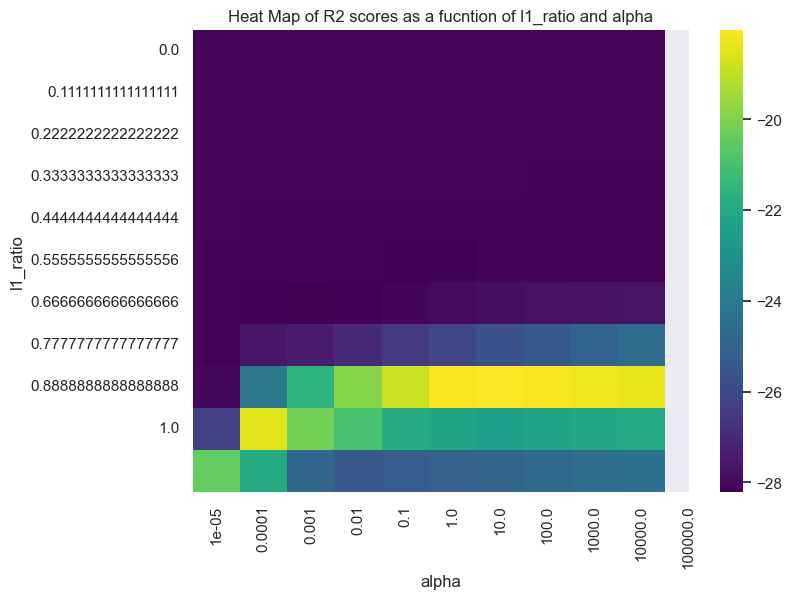

In [368]:
# plot the mean cross-validation scores:
# Since we know the column names, it is easier to read and further manuplate the data.
# Lets create an array 10 x 10, which is the # combinations we tested with hyperparameters.
scores = np.array(results_overview.mean_test_score).reshape(11, 10)

#Simple Drawing
sns.heatmap(scores,cmap='viridis',xticklabels=param_grid['estimator__alpha'],yticklabels=param_grid['estimator__l1_ratio'])

#A bit makeup:
plt.xlabel("alpha"), plt.ylabel("l1_ratio")
plt.title("Heat Map of R2 scores as a fucntion of l1_ratio and alpha")

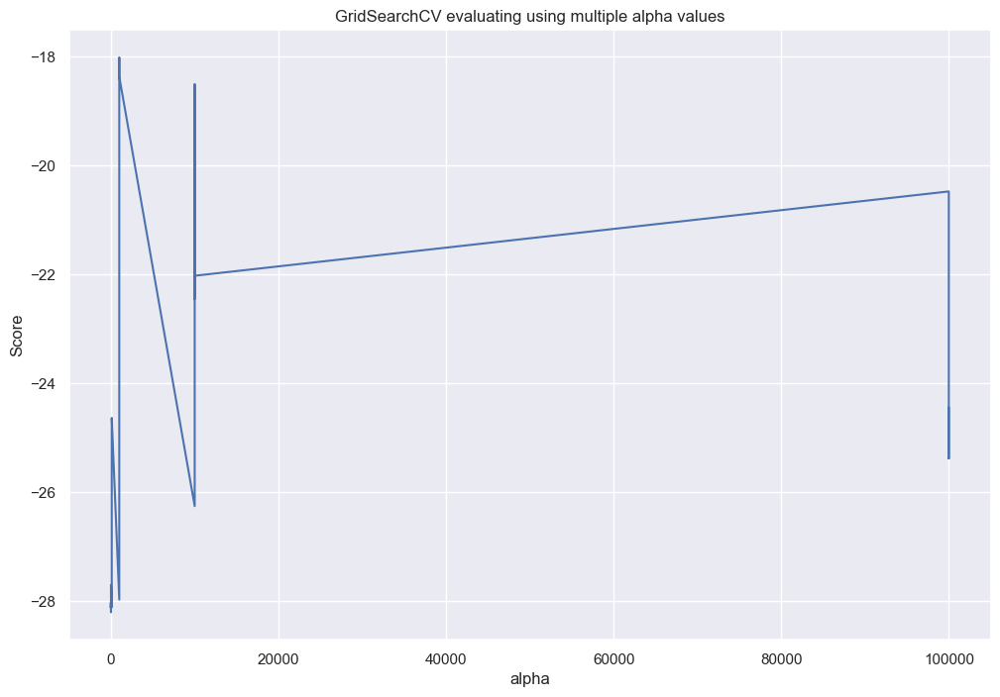

In [369]:
# Plotting the results
plt.figure(figsize=(12, 8))
plt.title("GridSearchCV evaluating using multiple alpha values",
          fontsize=12)
plt.xlabel("alpha")
plt.ylabel("Score")
# Get the regular numpy array from the MaskedArray
X_axis = np.array(results['param_estimator__alpha'].data, dtype=float)
Y_axis = np.array(results['mean_test_score'].data, dtype=float)
plt.plot(X_axis,Y_axis)
plt.show()

#### Learning curve

In [ ]:
# # Defining our function to run the model and see the evolution of error>
# def plot_learning_curves(model, X_train, X_test, y_train, y_test):
#   #Empty lists for data storage:
#   train_errors, val_errors = [], []
#   # Remember, we will look at the error as model is trained with more data.
#   # So we will make predictions with increasing instance sizes for both the training set and test set.
#   for m in range(1, len(X_train)):
#     #Model fitting:
#     model.fit(X_train[:m], y_train[:m])
#     #Predicting for the training data:
#     y_train_predict = model.predict(X_train[:m])
#     #Predicting for the test data:
#     y_test_predict = model.predict(X_test)
#     #Saving the errors for the plot for a given data size:
#     train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
#     val_errors.append(mean_squared_error(y_test, y_test_predict))
  
#   # Plotting the results:
#   plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
#   plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
#   plt.legend()
#   plt.xlim(0, 50),  plt.ylim(0.01,50)
#   plt.yscale("log")
#   plt.xlabel("Instances"),  plt.ylabel("MSE")
  
# # Calling our function to draw the learning curve for elastic net:
# plot_learning_curves(model,X_train, X_test, y_train, y_test) 

# Stochastic gradient descend algorithm to get a convergent model

## Support Vector Machines

    Model is versitile: different Kernel functions can be implemented for the decision function. In SVM, we construct a hyperplane via these Kernel functions in a higher dimensional space and we look for the optimal hyperplane that best separates the data with the highest margin. Linear approach is the fastest but performs poorer for nonlinear datasets.

    In sci-kit learn, we have three options to implement and you can check the details from here: https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#

### Normalizing the data

    We will normalize the data before feeding it into SVM as it is very critical for this model. 

In [ ]:
#Rescaling the data
featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
#Looking into the statistics again:
dataX.describe()

In [ ]:
#After the normalization, we need to update the splitted arrays again:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

### Model Training and Predictions

There are 3 important hyperparameters to decide: C, epsilon and kernel. We also need to feed the tol value as we are solving a convex optimization problem.

In [ ]:
# Hyperparameters:
# https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html#

#__________________________________________________________________________________________
#___Notes__________________________________________________________________________________
#Radial Basis Function (RBF) kernel, two parameters must be considered: C and gamma. 

#The parameter C, common to all SVM kernels, trades off misclassification of training examples 
#against simplicity of the decision surface. 
#A low C makes the decision surface smooth, while a high C aims at classifying all training examples correctly. 
#The strength of the regularization is inversely proportional to C. Large C => little regularization; Low C => higher regularization

#gamma defines how much influence a single training example has. The larger gamma is, the closer other examples must be to be affected.
#__________________________________________________________________________________________

kernel='linear' 
gamma='scale' #Kernel coefficient for ‘rbf’, ‘poly’ and ‘sigmoid’. When scaled, uses 1 / (n_features * X.var()) as value of gamma.
C=1.0
epsilon=0.1    # Default
shrinking=True # Whether to use the shrinking heuristic. 
tol=0.00001

#Setting the model:
svr = SVR(kernel= kernel, gamma=gamma, tol=tol, C=C, epsilon=epsilon, shrinking=shrinking)

In [ ]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])

####Modified###
model = svr

#kfold.split will generate indices to split data into training and test set (cv):
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.ravel()):

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)

####Modified###
scoreSVM = model.score(X_train,y_train)
print('-----------------------------------')
print('SVM Regression Score: ', scoreSVM)
print('-----------------------------------')

### Tuning SVM Hyperparameters with Grid Search
    
    The model prediction is not good. So we need to play with the hyper parameters! As an example, here we can play with the kernel and C values.

    Try yourselves with the epsilon and gamma as well.

In [ ]:
kernels = ['poly','rbf','sigmoid']
Cs = np.logspace(0, 3, 25)
#Setting up the grid:
grid = {'kernel': kernels,'C':Cs}

#Setting the search:
# For scoring: https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter

gridSearch = GridSearchCV(svr, grid, scoring='r2', cv=k_fold, refit=True)
gridSearch.fit(X_train, y_train)
results = gridSearch.cv_results_

print('Best R^2 obtained:', gridSearch.best_score_)
print('gamma value for the best case:', gridSearch.best_estimator_.gamma)
print('kernel value for the best case:', gridSearch.best_estimator_.kernel)
print('C value for the best case:', gridSearch.best_estimator_.C)

In [ ]:
#Saving the best parameters back to model:
svr = gridSearch.best_estimator_
#Alpha and l1 values of the model:
svr.kernel, svr.C, svr.gamma

In [ ]:
# Test Problem:
test_data = X_test.sample(1,random_state=11).copy()
test_data

In [ ]:
#Making a prediction with the model:
svr.predict(test_data)

In [ ]:
#Checking for the true value:
y_test[test_data.index]

In [ ]:
#Lets try a self-defined error for this instance:
relative_error = abs(model.predict(test_data)-y_test[test_data.index])/y_test[test_data.index]*100
print('Relative percentage error is:',round(relative_error.values[0],2),'%')

### Visualizing the learning curve for SVM

In [ ]:
#Note:
# The function is already defined in ElasticNet.
#  
# Calling our function to draw the learning curve for SVM:
plot_learning_curves(svr,X_train, X_test, y_train, y_test)

# Bayesian Regression

    For Spatial disaggregation what we need to know about specifically is: 

    The frequentist view of linear regression is the one that the model assumes that the response variable (y) is a linear combination of weights multiplied by a set of predictor variables (x).The goal of learning a linear model from training data is to find the coefficients, β, that best explain the data. In frequentist linear regression, the best explanation is taken to mean the coefficients, β, that minimize the residual sum of squares (RSS). RSS is the total of the squared differences between the known values (y) and the predicted model outputs (ŷ, pronounced y-hat indicating an estimate). This method of fitting the model parameters by minimizing the RSS is called Ordinary Least Squares (OLS).

    Ordinary least squares gives us a single point estimate for the output given a single input point, which we can interpret as the most likely estimate given the data. However, if we have a small dataset, or aggregated data as input as in our case, we might like to express our estimate as a distribution of possible disaggregated values. This is where Bayesian Linear Regression comes in. 

    The aim of Bayesian Linear Regression is not to find the single “best” value of the model parameters, but rather to determine the posterior distribution for the model parameters. Not only is the response generated from a probability distribution, but the model parameters are assumed to come from a distribution as well. 

    Let’s stop and think about what this means. In contrast to OLS, we have a posterior distribution for the model parameters that is proportional to the likelihood of the data multiplied by the prior probability of the parameters. Here we can observe the two primary benefits of Bayesian Linear Regression.

    1.	Priors: If we have domain knowledge, or a guess for what the model parameters should be, we can include them in our model, unlike in the frequentist approach which assumes everything there is to know about the parameters comes from the data. If we don’t have any estimates ahead of time, we can use non-informative priors for the parameters such as a normal distribution.

    2.	Posterior: The result of performing Bayesian Linear Regression is a distribution of possible model parameters based on the data and the prior. This allows us to quantify our uncertainty about the model: if we have fewer data points, the posterior distribution will be more spread out.

    As the amount of data points increases, the likelihood washes out the prior, and in the case of infinite data, the outputs for the parameters converge to the values obtained from OLS.

    The formulation of model parameters as distributions encapsulates the Bayesian worldview: we start out with an initial estimate, our prior, and as we gather more evidence, our model becomes less wrong. Bayesian reasoning is a natural extension of our intuition. Often, we have an initial hypothesis, and as we collect data that either supports or disproves our ideas, we change our model of the world (ideally this is how we would reason)!


https://scikit-learn.org/stable/modules/linear_model.html#bayesian-regression

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.BayesianRidge.html

https://scikit-learn.org/stable/auto_examples/linear_model/plot_bayesian_ridge.html

https://scikit-learn.org/stable/auto_examples/linear_model/plot_bayesian_ridge_curvefit.html

    To perform the spatial disaggregation from country level to NUTS3 level using both the country level data and the NUTS3 level data, we can use a Bayesian Hierarchical Modeling (BHM) algorithm with multiple predictors. BHM is a type of statistical modeling that can be used to make predictions based on hierarchical data structures, such as the data structure in our case where data is labeled at the country level and needs to be disaggregated to the NUTS3 level.

## Prepearing the dataset for the model

In [ ]:
train_data_NUTS0.columns


# I Bayesian Hierarchical Model (BHM) algorithm in Python using PyMC3

    Here's an example of a Bayesian Hierarchical Model (BHM) algorithm in Python using PyMC3 library, to disaggregate data from the country level to NUTS3 level:

    In this example, the Bayesian Hierarchical Model takes into account the hierarchical structure of the data by modeling the relationship between the predictors (income and education) and the target variable (target_variable) at both the country and NUTS3 levels.

In [ ]:
import pandas as pd
import numpy as np
import pymc3 as pm

# Load the country-level data into a pandas dataframe
df_country = pd.read_csv('country_data.csv')

# Load the NUTS3-level data into a pandas dataframe
df_nuts3 = pd.read_csv('nuts3_data.csv')

# Merge the two dataframes on the NUTS3 ID
df = pd.merge(df_country, df_nuts3, on='nuts3_id')

# Define the hierarchical model in PyMC3
with pm.Model() as model:
    # Define hyperpriors for the population mean and standard deviation
    mu_a = pm.Normal('mu_a', mu=0, sd=10)
    sigma_a = pm.HalfNormal('sigma_a', sd=10)
    
    # Define hyperpriors for the country-level intercept and slopes
    beta0 = pm.Normal('beta0', mu=mu_a, sd=sigma_a, shape=len(df_country['country_id'].unique()))
    beta1 = pm.Normal('beta1', mu=mu_a, sd=sigma_a, shape=len(df_country['country_id'].unique()))
    beta2 = pm.Normal('beta2', mu=mu_a, sd=sigma_a, shape=len(df_country['country_id'].unique()))
    
    # Define the country-level regression equation
    mu = beta0[df['country_id'].values] + beta1[df['country_id'].values] * df['income'] + beta2[df['country_id'].values] * df['education']
    
    # Define the likelihood
    y = pm.Normal('y', mu=mu, sd=1, observed=df['target_variable'])
    
    # Fit the model to the data
    trace = pm.sample(5000, tune=1000)

# Extract the posterior samples for the population mean and standard deviation
mu_a_samples = trace['mu_a']
sigma_a_samples = trace['sigma_a']

# Extract the posterior samples for the country-level intercept and slopes
beta0_samples = trace['beta0']
beta1_samples = trace['beta1']
beta2_samples = trace['beta2']

# Calculate the posterior predictive means for the target variable
predictive_means = beta0_samples[:, np.newaxis] + beta1_samples[:, np.newaxis] * df['income'] + beta2_samples[:, np.newaxis] * df['education']
predictive_mean = predictive_means.mean(axis=0)

# II Bayesian Hierarchical Model (BHM) algorithm in Python using PyMC3

    This example assumes that the region_id column in both data frames is a unique identifier for each region (either country or NUTS3). The algorithm uses the country level data as the response variable (y) and the NUTS3 level data as predictors. The country level mean and standard deviation are defined as hyperpriors, while the NUTS3 level regression coefficients are defined as priors. The model is fit using the NUTS sampler.

    Please note that this is just one way to implement a Bayesian Hierarchical Model for this task and other approaches may yield different results.

In [ ]:
import pandas as pd
import pymc3 as pm

# Load the data frames
df_country = pd.read_csv('country_level_data.csv')
df_nuts3 = pd.read_csv('nuts3_level_data.csv')

# Merge the two data frames on the common identifier
df = pd.merge(df_country, df_nuts3, on='region_id')

# Define the model using PyMC3
with pm.Model() as model:
    # Define hyperpriors for the mean and standard deviation of the country level data
    mu_mu = pm.Normal('mu_mu', mu=0, sigma=10)
    sigma_mu = pm.HalfNormal('sigma_mu', sigma=10)
    
    # Define priors for the country level data
    mu = pm.Normal('mu', mu=mu_mu, sigma=sigma_mu, shape=df_country.shape[0])
    sigma = pm.HalfNormal('sigma', sigma=10, shape=df_country.shape[0])
    
    # Define the regression coefficients for the NUTS3 level ancillary data
    beta = pm.Normal('beta', mu=0, sigma=10, shape=df_nuts3.shape[1]-1)
    
    # Define the regression equation
    mu_nuts3 = pm.math.dot(df_nuts3.iloc[:,1:], beta)
    mu_nuts3 = pm.Deterministic('mu_nuts3', mu_nuts3)
    
    # Define the likelihood of the observed data
    y = pm.Normal('y', mu=mu[df['country_idx']], sigma=sigma[df['country_idx']], observed=df['y'])
    
    # Fit the model using the NUTS sampler
    trace = pm.sample(2000, tune=1000)

In [ ]:
import pandas as pd
import pymc3 as pm

# Load the data frames
train_data_NUTS0 # country level


# Merge the two data frames on the common identifier
train_data_NUTS3 # country and nuts3 level

# Define the model using PyMC3
with pm.Model() as model:
    # Define hyperpriors for the mean and standard deviation of the country level data
    mu_mu = pm.Normal('mu_mu', mu=0, sigma=10)
    sigma_mu = pm.HalfNormal('sigma_mu', sigma=10)
    
    # Define priors for the country level data
    mu = pm.Normal('mu', mu=mu_mu, sigma=sigma_mu, shape=train_data_NUTS0.shape[0])
    sigma = pm.HalfNormal('sigma', sigma=10, shape=train_data_NUTS0.shape[0])
    
    # Define the regression coefficients for the NUTS3 level ancillary data
    beta = pm.Normal('beta', mu=0, sigma=10, shape=train_data_NUTS3.shape[1]-1)
    
    # Define the regression equation
    mu_nuts3 = pm.math.dot(train_data_NUTS3.iloc[:,1:], beta)
    mu_nuts3 = pm.Deterministic('mu_nuts3', mu_nuts3)
    
    # Define the likelihood of the observed data
    y = pm.Normal('y', mu=mu[train_data_NUTS3['NUTS0_region_code']], sigma=sigma[train_data_NUTS3['NUTS0_region_code']], observed=train_data_NUTS3['y'])
    
    # Fit the model using the NUTS sampler
    trace = pm.sample(2000, tune=1000)

# III Bayesian Hierarchical Modeling (BHM) algorithm with multiple predictors

    BHM is a type of statistical modeling that can be used to make predictions based on hierarchical data structures, such as the data structure in your case where data is labeled at the country level and needs to be disaggregated to the NUTS3 level.

In [ ]:
import numpy as np
from sklearn.linear_model import BayesianRidge

# Load the data into a pandas DataFrame
country_data = pd.read_csv("country_data.csv")
nuts3_data = pd.read_csv("nuts3_data.csv")

# Merge the country level data and NUTS3 level data on the country ID
merged_data = country_data.merge(nuts3_data, on='country_id')

# Split the merged data into features (country ID and NUTS3 level data) and target (country level value)
X = merged_data[['country_id', 'nuts3_data_1', 'nuts3_data_2', ...]]
y = merged_data['country_value']

# Fit the Bayesian Ridge Regression model to the merged data
reg = BayesianRidge()
reg.fit(X, y)

# Predict the NUTS3 level values based on the country level values and NUTS3 level data
nuts3_predictions = reg.predict(nuts3_data[['country_id', 'nuts3_data_1', 'nuts3_data_2', ...]])

# Add the predictions to the NUTS3 level data
nuts3_data['predicted_value'] = nuts3_predictions

# Save the NUTS3 level data with predictions to a CSV file
nuts3_data.to_csv("nuts3_data_with_predictions.csv", index=False)

# An Alternative Linear Approach: Bayesian Regression (Lecture)

In [ ]:
train_data_NUTS3_X = train_data_NUTS3.copy().drop(['EU_region_code', 'NUTS0_region_code', 'NUTS1_region_code',
       'NUTS2_region_code', 'NUTS3_region_code'],axis=1)
train_data_NUTS0_X = train_data_NUTS0.copy().drop(['EU_region_code', 'NUTS0_region_code'],axis=1)

In [ ]:
dataX = train_data_NUTS3_X.copy().drop(['bus_stations_value'], axis=1)
dataY = train_data_NUTS3_X['bus_stations_value'].copy()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.25, random_state=2020)

In [ ]:
# Split the data into two separate DataFrames for the country level and NUTS3 level
country_data = data[data['level'] == 'country']
# nuts3_data = data[data['level'] == 'nuts3']

In [ ]:
# Hyperparameters:

alpha_1 = 1e-06
alpha_2 = 1e-06 
lambda_1 = 1e-06
lambda_2 = 1e-06
normalize = False

brr = BayesianRidge(alpha_1=alpha_1,alpha_2=alpha_2, lambda_1=lambda_1, lambda_2=lambda_2)

In [ ]:
# Model Training:
#-----------------------------------------------------------------------------
#Lists for storing scores
trainingScores = []
cvScores = []

#DataFrame is a 2-dimensional labeled data structure. You can think of it like a spreadsheet.
#Indexing in pandas means simply selecting particular rows and columns of data from a DataFrame.
#It is  also known as Subset Selection.
predictionsBasedOnKFolds = pd.DataFrame(data=[],index=y_train.index,columns=[0,1])

####Modified###
model = brr

#kfold.split will generate indices to split data into training and test set (cv):
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)),y_train.ravel()):

  #'iloc' can be used when the user doesn’t know the index label:
  #Here we are filtering the data based on indices. Data is divided as 902/225.
  X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
  y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

  #Fitting the model according to given data:
  #Note that model refers to Lasso.
  model.fit(X_train_fold, y_train_fold)

  #Lets check how good is the fitting.
  #'score' returns the coefficient of determination R^2 of the prediction. It is defined as (1 - u/v), 
  # where u is the residual sum of squares ((y_true - y_pred) ** 2).sum() and v is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). 
  #The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
  
  # We will first look in the training dataset:
  scoreTraining = model.score(X_train_fold, y_train_fold)
  #Saving our analysis on the list:
  trainingScores.append(scoreTraining)

  #Lets see how good it is on CV dataset:
  scoreCV = model.score(X_cv_fold, y_cv_fold)
  #Saving our analysis on the list:
  cvScores.append(scoreCV)

  #printing the results:
  print('Training Score: ', scoreTraining)
  print('CV Score: ', scoreCV)

#Lets see the overall score for the entire training set (1127)

####Modified###
scoreBRR = model.score(X_train,y_train)
print('-----------------------------------')
print('BR Regression Score: ', scoreBRR)
print('-----------------------------------')

In [ ]:
# Test Problem:
test_data = X_test.sample(1,random_state=121).copy()
test_data

In [ ]:
y_mean, y_std = brr.predict(test_data, return_std=True)
print ('Predicted value is  %5.2f' %y_mean[0], ' with a SD of  %5.2f' %y_std)

In [ ]:
print ('Test value is  %5.2f' %y_test._get_value(test_data.index.ravel()[0]))

In [ ]:
relative_error = abs(model.predict(test_data)-y_test[test_data.index])/y_test[test_data.index]*100
print('Relative percentage error is:',round(relative_error.values[0],2),'%')

## Learning curve

In [ ]:
def plot_learning_curves(model, X_train, X_test, y_train, y_test):
  train_errors, val_errors = [], []
  for m in range(1, 100):
    model.fit(X_train[:m], y_train[:m])
    y_train_predict = model.predict(X_train[:m])
    y_test_predict = model.predict(X_test)
    train_errors.append(mean_squared_error(y_train[:m], y_train_predict))
    val_errors.append(mean_squared_error(y_test, y_test_predict))
  plt.plot(np.sqrt(train_errors), "k--", linewidth=1.5, label="train")
  plt.plot(np.sqrt(val_errors), "b-.", linewidth=1.5, label="test")
  plt.legend()
  plt.xlim(0, 100),  plt.ylim(1,10)
  plt.yscale("log")
  plt.xlabel("Instances"),  plt.ylabel("MSE")
  

plot_learning_curves(brr,X_train, X_test, y_train, y_test)